In [1]:
# import the necessary libraries
import numpy as np
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt
import torch
from sklearn.cluster import KMeans
#import plotly as pty
import h5py
import os

### Steps in notebook:
- load profiles belonging to a certain cluster (clusters were identified in project too with k means clustering)
- preprocess (scaling, adding features, etc)
- extract typical weeks for summer, winter, transitional period
- visualize the average typical weeks and some sample days
- extract individual days from the typical weeks and store in tensors
- train HMMs on each combination of weekday and season
- create samples from the HMMs trained
- combine the samples into full weeks
- combine the weeks into a year

#### data loading

In [2]:
# this notebook can be run in loop (to create multipe profiles in a row)
# alternatively, can be run individually
# comment or outcomment the respective cells as indicated

In [3]:
# input data used are in an hdf5 file

In [4]:
# parameters to set: 

# cluster number (from k means clustering)
# file names

### parameterize, run in loop

In [5]:
# the parameter n is injected from a python script loop.py

In [6]:
# the cell below needs to be tagged with parameters
# in jupyter lab 3+, click the double gear next to the cell, type 'parameters' in Add Tag and hit enter, see papermill documentation for other jupyter labs or notebooks

In [7]:
# use for looping
#n = ''

In [8]:
# Parameters
#n = 7

In [9]:
# use for looping
# Access 'n' parameter passed from the Python script
#n = int(n)

# Save DataFrames with synthetic data to csvs with suffix n
#filename = f"OM_privat_cluster_14_{n}.csv"

# Save states with suffix n
#filename_states = f"OM_states_dict_cluster_14_{n}.pt"

# Save plots with suffix n
#plotname = f"OM_synt_plot_14_{n}.svg"

In [10]:
# define the cluster that you want to laod
cluster = 14

### header - read me

In [11]:
# if working with the h5 file and the OM data, inspect the km generated cluster
# check cluster number
# Specify the path to your HDF5 file
file_path = '20240119_OM_privat-19-02.h5'

# Create an empty list to store the first rows of each DataFrame
first_rows = []

# Open the HDF5 file
with h5py.File(file_path, 'r') as file:
    # Iterate through keys
    for key in file.keys():
        # Extract DataFrame from HDF5 file
        df = pd.read_hdf(file_path, key=key)
        
        # Extract the first row of the DataFrame and append it to the list
        first_row = df.iloc[[0]]
        first_rows.append(first_row)

# Concatenate the first rows into a new DataFrame
first_rows_df = pd.concat(first_rows, ignore_index=True)

# Print the new DataFrame containing the first rows of each DataFrame
print("DataFrame containing the first rows of each DataFrame:")
print(first_rows_df)

DataFrame containing the first rows of each DataFrame:
               w         t2m                             sensor_id  cluster_id
0    1705.684168  281.035759  001dce72-b1c1-44b1-bf16-0c22cfe3a420          17
1     260.431238  286.784286  00a3c3e4-bf1f-4c0b-9e18-8bc60e66575d          16
2      65.862557  274.193085  0252a8f5-9913-47bb-a70f-c86e5c69f71a           0
3      96.516745  286.188446  026ed97d-d51e-489a-898e-6547d6f569f2          16
4     108.671612  282.660263  02a7475b-9007-4aef-a265-b38bbdbbec32          16
..           ...         ...                                   ...         ...
547  1025.303748  300.814270  fe2d90e7-f54f-4b8b-8607-50b18091bd96           5
548    97.103048  283.544655  fe61333c-b60c-4500-bfa6-0b14db32d6d6           6
549   465.649445  274.782043  ff029d36-1c57-43fc-922f-2c148c3f6200           8
550   692.519303  275.520668  ff1e2a8b-cea3-4512-9144-e84263ca6afc          14
551   118.166610  289.768646  ffd9031e-4660-4018-889d-a3c1ddb65926          

In [12]:
# count the number of profiles in each cluster
cluster_id_counts = first_rows_df['cluster_id'].value_counts()
cluster_id_counts.sort_values()

cluster_id
4      1
13     1
3      4
12     4
9      9
7     13
17    13
10    19
2     20
11    23
14    31
5     32
15    40
1     55
6     66
16    69
8     69
0     83
Name: count, dtype: int64

In [13]:
# for running the notebook once
# Define the filename for the result csv with the synthetic data
# when running from python script, filenames are defined above

filename = "test3.csv"

# Define the filename for the states
filename_states = "test3.pt"

plotname = "test3.svg"

##### load data

In [14]:
# Specify the path to the HDF5 file

file_path = '20240119_OM_privat-19-02.h5'

# Create an empty dictionary to store DataFrames
df_dict = {}

# Open the HDF5 file
with h5py.File(file_path, 'r') as file:
    #initialize variable example (will contain the first key of the dict to be used in the rest of the notebook)
    example = None
    
    # Iterate through keys
    for key in file.keys():
        # Extract DataFrame from HDF5 file
        df = pd.read_hdf(file_path, key=key)
        
        # Extract the first row of the DataFrame
        first_row = df.iloc[[0]]
        
        # Check if the value in the first row's cluster_id column is 6
        if first_row['cluster_id'].values[0] == cluster:
            df_dict[key] = df
            
# If example_key is not yet assigned, assign it the current key
# throughout the code, I am using this to plot one df            
            if example is None:
                example = key

In [15]:
print(example)

0b7728d0-c37b-4bb2-8c55-bb0211244291


### create tensors for analysis

In [16]:
# inspect the lenght of the dict (should be equal to the amount of dfs for the cluster_id)
len(df_dict)

31

In [17]:
df_dict

{'0b7728d0-c37b-4bb2-8c55-bb0211244291':                               w         t2m  \
 2020-06-16 10:00:00  415.657530  289.508118   
 2020-06-16 10:15:00  478.816063  289.615509   
 2020-06-16 10:30:00  414.269692  289.722900   
 2020-06-16 10:45:00  479.103910  289.830292   
 2020-06-16 11:00:00  428.207197  289.937683   
 ...                         ...         ...   
 2023-07-26 02:30:00   15.477603  282.786560   
 2023-07-26 02:45:00    7.291202  282.786560   
 2023-07-26 03:00:00   11.085326  282.786560   
 2023-07-26 03:15:00   13.662835  282.786560   
 2023-07-26 03:30:00   10.786242  282.786560   
 
                                                 sensor_id  cluster_id  
 2020-06-16 10:00:00  0b7728d0-c37b-4bb2-8c55-bb0211244291          14  
 2020-06-16 10:15:00  0b7728d0-c37b-4bb2-8c55-bb0211244291          14  
 2020-06-16 10:30:00  0b7728d0-c37b-4bb2-8c55-bb0211244291          14  
 2020-06-16 10:45:00  0b7728d0-c37b-4bb2-8c55-bb0211244291          14  
 2020-06-16 11:00

In [18]:
# load the df and inspect the column names
# column names should be "w" - Verbrauch, "t2m" - Temperatur in Kelvin, "sensor_id" and "cluster_id"
# "cluster_id" is not necessary, will be deleted later anyway
df_dict[example]

,w,t2m,sensor_id,cluster_id
2020-06-16 10:00:00,415.657530,289.508118,0b7728d0-c37b-4bb2-8c55-bb0211244291,14
2020-06-16 10:15:00,478.816063,289.615509,0b7728d0-c37b-4bb2-8c55-bb0211244291,14
2020-06-16 10:30:00,414.269692,289.722900,0b7728d0-c37b-4bb2-8c55-bb0211244291,14
2020-06-16 10:45:00,479.103910,289.830292,0b7728d0-c37b-4bb2-8c55-bb0211244291,14
2020-06-16 11:00:00,428.207197,289.937683,0b7728d0-c37b-4bb2-8c55-bb0211244291,14
...,...,...,...,...
2023-07-26 02:30:00,15.477603,282.786560,0b7728d0-c37b-4bb2-8c55-bb0211244291,14
2023-07-26 02:45:00,7.291202,282.786560,0b7728d0-c37b-4bb2-8c55-bb0211244291,14
2023-07-26 03:00:00,11.085326,282.786560,0b7728d0-c37b-4bb2-8c55-bb0211244291,14
2023-07-26 03:15:00,13.662835,282.786560,0b7728d0-c37b-4bb2-8c55-bb0211244291,14


<Axes: >

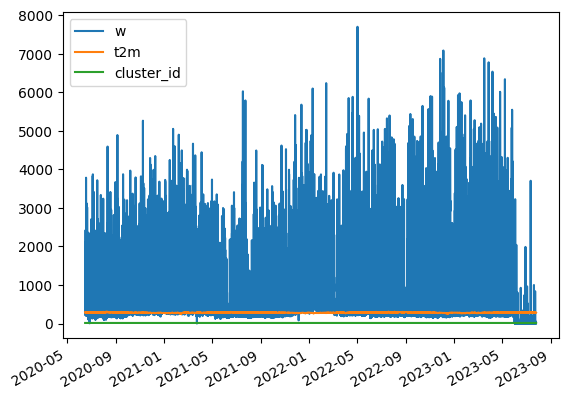

In [19]:
# inspect the data 
df_dict[example].plot()

In [20]:
# convert temperature to Celsius
for key, df in df_dict.items():
    # Check if 'w' column exists in the DataFrame
    if 't2m' in df.columns:
        # Divide each value in the 'w' column by 1000
        df['t2m'] = df['t2m'] -273.15

<Axes: >

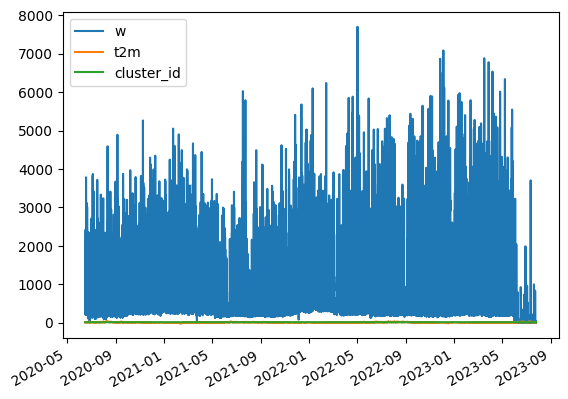

In [21]:
df_dict[example].plot()

In [22]:
# convert to kWh
for key, df in df_dict.items():
    # Check if 'w' column exists in the DataFrame
    if 'w' in df.columns:
        # Divide each value in the 'w' column by 1000
        df['w'] = df['w'] / 1000

<Axes: >

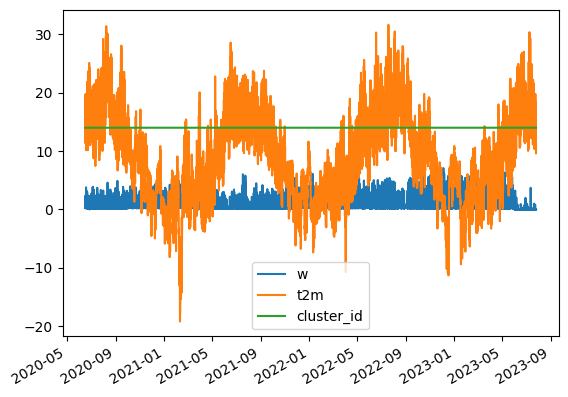

In [23]:
df_dict[example].plot()

#### rolling mean

In [24]:
# calculate the rolling mean with a window size of 4 to smooth the data
# Iterate over each key-value pair in the dictionary
for key, df in df_dict.items():
    # Apply rolling mean to column 'w'
    df['w'] = df['w'].rolling(window=4).mean()
    
   
    # Update the DataFrame in the dictionary with the rolled DataFrame
    df_dict[key] = df

df_dict[example]

,w,t2m,sensor_id,cluster_id
2020-06-16 10:00:00,NaN,16.358118,0b7728d0-c37b-4bb2-8c55-bb0211244291,14
2020-06-16 10:15:00,NaN,16.465509,0b7728d0-c37b-4bb2-8c55-bb0211244291,14
2020-06-16 10:30:00,NaN,16.572900,0b7728d0-c37b-4bb2-8c55-bb0211244291,14
2020-06-16 10:45:00,0.446962,16.680292,0b7728d0-c37b-4bb2-8c55-bb0211244291,14
2020-06-16 11:00:00,0.450099,16.787683,0b7728d0-c37b-4bb2-8c55-bb0211244291,14
...,...,...,...,...
2023-07-26 02:30:00,0.012976,9.636560,0b7728d0-c37b-4bb2-8c55-bb0211244291,14
2023-07-26 02:45:00,0.011260,9.636560,0b7728d0-c37b-4bb2-8c55-bb0211244291,14
2023-07-26 03:00:00,0.012159,9.636560,0b7728d0-c37b-4bb2-8c55-bb0211244291,14
2023-07-26 03:15:00,0.011879,9.636560,0b7728d0-c37b-4bb2-8c55-bb0211244291,14


In [25]:
# inspect the data
df_dict[example].max()

w                                         6.804804
t2m                                      31.632501
sensor_id     0b7728d0-c37b-4bb2-8c55-bb0211244291
cluster_id                                      14
dtype: object

#### sinday cosday

In [26]:
# create time features
def compute_time_features(df):
    minutes = df.index.values.astype(dtype='datetime64[m]').astype(np.float32)
    hours = minutes / 60
    days = hours / 24
    weeks = days / 7
    months = days / (365/12)
    time_features = np.concatenate([
        np.sin(np.pi*2*days).reshape(-1, 1),
        np.cos(np.pi*2*days).reshape(-1, 1),
        #np.sin(np.pi*2*weeks).reshape(-1, 1),
        #np.cos(np.pi*2*weeks).reshape(-1, 1),
        #np.sin(np.pi*2*months).reshape(-1, 1),
        #np.cos(np.pi*2*months).reshape(-1, 1),
    ], axis=1)
    return pd.DataFrame(time_features, columns=['sinday', 'cosday'])

# Assuming df_dict is your dictionary of dataframes
df_dict_features = {}

for key, df in df_dict.items():
    df_features = compute_time_features(df)
    
    # Reset the index for both the original dataframe and the features dataframe
    df = df.reset_index(drop=False)
    df_features = df_features.reset_index(drop=True)
    
    # Concatenate the dataframes
    df_dict[key] = pd.concat([df, df_features], axis=1)

    # Plotting a snippet
    #plt.imshow(df_features.values[:48*14].T, aspect='auto', interpolation='nearest')
    #plt.colorbar()
    #plt.title(f"Time features for {key} - 14 day snippet")
    #plt.show()

In [27]:
df_dict[example]

,index,w,t2m,sensor_id,cluster_id,sinday,cosday
0,2020-06-16 10:00:00,NaN,16.358118,0b7728d0-c37b-4bb2-8c55-bb0211244291,14,0.502181,-0.864763
1,2020-06-16 10:15:00,NaN,16.465509,0b7728d0-c37b-4bb2-8c55-bb0211244291,14,0.433158,-0.901318
2,2020-06-16 10:30:00,NaN,16.572900,0b7728d0-c37b-4bb2-8c55-bb0211244291,14,0.383244,-0.923647
3,2020-06-16 10:45:00,0.446962,16.680292,0b7728d0-c37b-4bb2-8c55-bb0211244291,14,0.324806,-0.945781
4,2020-06-16 11:00:00,0.450099,16.787683,0b7728d0-c37b-4bb2-8c55-bb0211244291,14,0.250001,-0.968246
...,...,...,...,...,...,...,...
107469,2023-07-26 02:30:00,0.012976,9.636560,0b7728d0-c37b-4bb2-8c55-bb0211244291,14,0.607791,0.794097
107470,2023-07-26 02:45:00,0.011260,9.636560,0b7728d0-c37b-4bb2-8c55-bb0211244291,14,0.656203,0.754585
107471,2023-07-26 03:00:00,0.012159,9.636560,0b7728d0-c37b-4bb2-8c55-bb0211244291,14,0.707594,0.706619
107472,2023-07-26 03:15:00,0.011879,9.636560,0b7728d0-c37b-4bb2-8c55-bb0211244291,14,0.760584,0.649239


#### check that sinday and cosday etc are correctly set

In [28]:
# Define the target index
target_index = '2022-01-01 00:15:00'

# Create a new dictionary to store the isolated rows
isolated_rows_dict = {}

# Isolate rows with the target index from each DataFrame
for key, df in df_dict.items():
    isolated_row = df.loc[df['index'] == target_index]
    isolated_rows_dict[key] = isolated_row

# Concatenate the isolated rows into a new DataFrame
result_df = pd.concat(isolated_rows_dict.values(), keys=isolated_rows_dict.keys())

result_df

,,index,w,t2m,sensor_id,cluster_id,sinday,cosday
0b7728d0-c37b-4bb2-8c55-bb0211244291,54102,2022-01-01 00:15:00,1.788663,9.939050,0b7728d0-c37b-4bb2-8c55-bb0211244291,14,0.078567,0.996909
0d1df061-d516-455b-9194-4b515a2a94af,78191,2022-01-01 00:15:00,0.812189,10.300356,0d1df061-d516-455b-9194-4b515a2a94af,14,0.078567,0.996909
0d359b12-cb16-4b49-a0b0-df6f5c378040,65998,2022-01-01 00:15:00,0.414348,11.323145,0d359b12-cb16-4b49-a0b0-df6f5c378040,14,0.078567,0.996909
11dace6f-33da-4f18-8ced-3fad7d6df8ed,64082,2022-01-01 00:15:00,0.633973,12.075479,11dace6f-33da-4f18-8ced-3fad7d6df8ed,14,0.078567,0.996909
19636f91-d044-4bc4-8cab-d9fae1bd07c0,39976,2022-01-01 00:15:00,0.337127,11.427820,19636f91-d044-4bc4-8cab-d9fae1bd07c0,14,0.078567,0.996909
19f5f180-1f4e-45d9-85ce-db650babe239,84064,2022-01-01 00:15:00,1.339388,3.362299,19f5f180-1f4e-45d9-85ce-db650babe239,14,0.078567,0.996909
2cfdab06-4c1d-4663-a017-fae4521be7af,72894,2022-01-01 00:15:00,0.382557,10.595064,2cfdab06-4c1d-4663-a017-fae4521be7af,14,0.078567,0.996909
330caf03-7eca-4e6b-aca9-661b17716fd2,64636,2022-01-01 00:15:00,1.018367,11.872606,330caf03-7eca-4e6b-aca9-661b17716fd2,14,0.078567,0.996909
335e6fe0-1521-4392-91d8-ce2259d8a396,82132,2022-01-01 00:15:00,0.309088,10.788805,335e6fe0-1521-4392-91d8-ce2259d8a396,14,0.078567,0.996909
38478ba8-ecec-46c4-9212-212eca5133a1,64844,2022-01-01 00:15:00,0.972924,10.788477,38478ba8-ecec-46c4-9212-212eca5133a1,14,0.078567,0.996909


In [29]:
result_df['sinday'].unique()

array([0.07856718], dtype=float32)

### data normalization

In [30]:
# rescale temperature
for key, df in df_dict.items():
    # Check if 't2m' column exists in the DataFrame
    if 't2m' in df.columns:
        df['t2m'] = (df['t2m'] + 20) / 40

In [31]:
# rescale sinday
for key, df in df_dict.items():
    # Check if 'sinday' column exists in the DataFrame
    if 'sinday' in df.columns:
        df['sinday'] = (df['sinday'] + 1) / 2

In [32]:
# rescale cosday
for key, df in df_dict.items():
    # Check if 'cosday' column exists in the DataFrame
    if 'cosday' in df.columns:
        df['cosday'] = (df['cosday'] + 1) / 2

In [33]:
# set indices
for key, df in df_dict.items():
    df = df.set_index('index', inplace=True)

In [34]:
# inspect the data
df_dict[example]

,w,t2m,sensor_id,cluster_id,sinday,cosday
index,,,,,,
2020-06-16 10:00:00,NaN,0.908953,0b7728d0-c37b-4bb2-8c55-bb0211244291,14,0.751090,0.067619
2020-06-16 10:15:00,NaN,0.911638,0b7728d0-c37b-4bb2-8c55-bb0211244291,14,0.716579,0.049341
2020-06-16 10:30:00,NaN,0.914323,0b7728d0-c37b-4bb2-8c55-bb0211244291,14,0.691622,0.038176
2020-06-16 10:45:00,0.446962,0.917007,0b7728d0-c37b-4bb2-8c55-bb0211244291,14,0.662403,0.027110
2020-06-16 11:00:00,0.450099,0.919692,0b7728d0-c37b-4bb2-8c55-bb0211244291,14,0.625000,0.015877
...,...,...,...,...,...,...
2023-07-26 02:30:00,0.012976,0.740914,0b7728d0-c37b-4bb2-8c55-bb0211244291,14,0.803895,0.897049
2023-07-26 02:45:00,0.011260,0.740914,0b7728d0-c37b-4bb2-8c55-bb0211244291,14,0.828101,0.877292
2023-07-26 03:00:00,0.012159,0.740914,0b7728d0-c37b-4bb2-8c55-bb0211244291,14,0.853797,0.853310


<Axes: xlabel='index'>

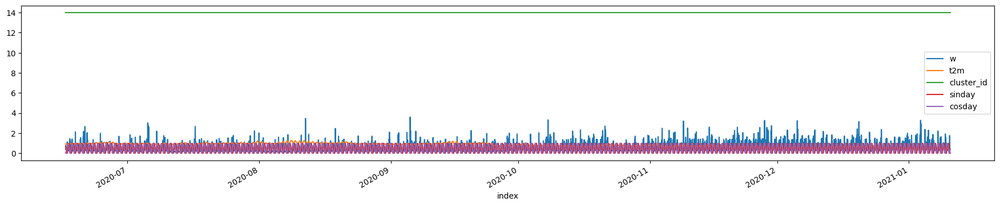

In [35]:
df_dict[example].iloc[:20000,:].plot(figsize=(22,4))

#### divide dfs

In [36]:
# define typical weeks of the year for winter, summer and transitional time

def find_first_monday_in_month(year, month):
    date = pd.Timestamp(year, month, 1)
    while date.dayofweek != 0:  # Monday is 0
        date += pd.Timedelta(days=1)
    return date

def create_seasonal_dataframes(df, year):
    # Define start and end dates for winter, summer, and transitional periods
    winter_start_date_1 = find_first_monday_in_month(year, 12)  # First Monday in December
    winter_end_date_1 = winter_start_date_1 + pd.DateOffset(days=20)  # Extend for the following 21 days

    # Additional winter period: First Monday after new year and the following 8 weeks
    winter_start_date_2 = find_first_monday_in_month(year + 1, 1)  # First Monday after new year (January)
    winter_end_date_2 = winter_start_date_2 + pd.DateOffset(weeks=8)  # 8 weeks after the start

    winter_df_1 = df[(df.index >= winter_start_date_1) & (df.index <= winter_end_date_1)]
    winter_df_2 = df[(df.index >= winter_start_date_2) & (df.index <= winter_end_date_2)]

    # Find the first Monday in June
    summer_start_date = find_first_monday_in_month(year, 6)

    # Calculate the end of summer, which is 16 weeks after the start
    summer_end_date = summer_start_date + pd.DateOffset(weeks=16)  # 16 weeks after the start

    # Find the first Monday in April
    transitional_start_date_1 = find_first_monday_in_month(year, 4)
    transitional_end_date_1 = transitional_start_date_1 + pd.DateOffset(weeks=8)  # 8 weeks after the start

    # Find the first Monday in October
    transitional_start_date_2 = find_first_monday_in_month(year, 10)
    transitional_end_date_2 = transitional_start_date_2 + pd.DateOffset(weeks=4)  # 4 weeks after the start

    transitional_df_1 = df[(df.index >= transitional_start_date_1) & (df.index <= transitional_end_date_1)]
    transitional_df_2 = df[(df.index >= transitional_start_date_2) & (df.index <= transitional_end_date_2)]
    
    combined_winter_df = pd.concat([winter_df_1, winter_df_2])
    combined_transitional_df = pd.concat([transitional_df_1, transitional_df_2])
    summer_df = df[(df.index >= summer_start_date) & (df.index <= summer_end_date)]

    return combined_winter_df, summer_df, combined_transitional_df

# Initialize empty DataFrames for aggregation
winter_all_df = pd.DataFrame()
summer_all_df = pd.DataFrame()
transitional_all_df = pd.DataFrame()

# Iterate over each DataFrame in df_dict
for key, df in df_dict.items():
    # Example usage for multiple years (e.g., 2022, 2023)
    for year in range(2015, 2024):
        winter_df, summer_df, transitional_df = create_seasonal_dataframes(df, year)
        
        # Concatenate DataFrames for each season
        winter_all_df = pd.concat([winter_all_df, winter_df])
        summer_all_df = pd.concat([summer_all_df, summer_df])
        transitional_all_df = pd.concat([transitional_all_df, transitional_df])

# Combine resulting seasonal dataframes
combined_seasonal_df = {
    'winter_all_df': winter_all_df,
    'summer_all_df': summer_all_df,
    'transitional_all_df': transitional_all_df
}

### Plotting, Input, typical week

In [37]:
# select only the first column
winter_all_df_w = winter_all_df.iloc[:,:1]
winter_all_df_w

,w
index,
2020-12-07 00:00:00,0.657010
2020-12-07 00:15:00,0.417890
2020-12-07 00:30:00,0.419641
2020-12-07 00:45:00,0.422436
2020-12-07 01:00:00,0.405770
...,...
2023-02-26 23:00:00,0.762917
2023-02-26 23:15:00,0.744175
2023-02-26 23:30:00,0.751969


In [38]:
winter_all_df_w_orig_mean = winter_all_df_w.mean()

In [39]:
# select only the first column
summer_all_df_w = summer_all_df.iloc[:,:1]
summer_all_df_w

,w
index,
2020-06-16 10:00:00,NaN
2020-06-16 10:15:00,NaN
2020-06-16 10:30:00,NaN
2020-06-16 10:45:00,0.446962
2020-06-16 11:00:00,0.450099
...,...
2023-07-26 02:45:00,0.429606
2023-07-26 03:00:00,0.421900
2023-07-26 03:15:00,0.394708


In [40]:
summer_all_df_w_orig_mean = summer_all_df_w.mean()

In [41]:
# select only the first column
transitional_all_df_w = transitional_all_df.iloc[:,:1]
transitional_all_df_w

,w
index,
2020-10-05 00:00:00,0.472393
2020-10-05 00:15:00,0.460199
2020-10-05 00:30:00,0.449534
2020-10-05 00:45:00,0.422926
2020-10-05 01:00:00,0.368606
...,...
2023-05-28 23:00:00,0.553868
2023-05-28 23:15:00,0.580717
2023-05-28 23:30:00,0.595384


In [42]:
transitional_all_df_w_orig_mean = transitional_all_df_w.mean()

In [43]:
# Calculate average weeks of winter, summer and transitional 

# Step 1: Extract weekday, hour, and minute
season_data = {'winter': winter_all_df_w, 'summer': summer_all_df_w, 'transitional': transitional_all_df_w}
season_results = {}

for season, df in season_data.items():
    df_copy = df.copy()
    df_copy['weekday'] = df_copy.index.weekday
    df_copy['hour'] = df_copy.index.hour
    df_copy['minute'] = df_copy.index.minute
    season_results[season] = df_copy

# Step 2: Group by weekday, hour, and minute, and calculate mean and confidence intervals
def calculate_mean_and_ci(group):
    mean = group.mean()
    ci_low = mean - 1.96 * group.std() / np.sqrt(len(group))
    ci_high = mean + 1.96 * group.std() / np.sqrt(len(group))
    return mean, ci_low, ci_high

for season, df in season_results.items():
    grouped = df.groupby(['weekday', 'hour', 'minute'])['w']
    season_results[season] = grouped.apply(calculate_mean_and_ci).apply(pd.Series).rename(columns={0: 'mean', 1: 'ci_low', 2: 'ci_high'})

# Step 3: Create separate DataFrames for each season
result_dfs = {}
for season, result in season_results.items():
    result_df = result.reset_index()
    result_dfs[season] = result_df

In [44]:
# Define a dictionary to map weekday numbers to weekday names
weekday_names = {
    0: 'Montag',
    1: 'Dienstag',
    2: 'Mittwoch',
    3: 'Donnerstag',
    4: 'Freitag',
    5: 'Samstag',
    6: 'Sonntag'
}

# Map weekdays in all result_dfs
for season, df in result_dfs.items():
    df['weekday'] = df['weekday'].map(weekday_names)


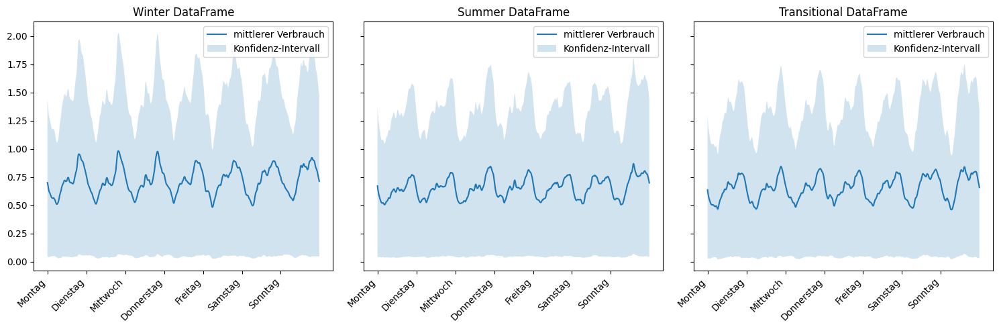

In [45]:
# Plot the typical weeks of winter, summer and transitional period
import matplotlib.pyplot as plt

# Create a figure with three subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5), sharey=True)

# Plot Row-wise Statistics for each season DataFrame with shaded area for standard deviation
for i, (season, df) in enumerate(result_dfs.items()):
    axes[i].plot(df.index, df['mean'], label='mittlerer Verbrauch')
    axes[i].fill_between(df.index,
                         df['mean'] - df['ci_low'],
                         df['mean'] + df['ci_high'],
                         alpha=0.2, label='Konfidenz-Intervall')
    axes[i].set_title(f"{season.capitalize()} DataFrame")
    axes[i].legend()
    # Set x-axis ticks to show only one label per 96 values
    axes[i].set_xticks(df.index[::96])
    axes[i].set_xticklabels(df['weekday'][::96], rotation=45, ha='right')

# Adjust layout to prevent overlapping
plt.tight_layout()

# Show the plot
plt.show()

### sample days from pool of days (all profiles)

In [46]:
# dfs contain time periods of summer, winter, transition:
# convert to libraries containing single days (name by the weekdays)

#### summer

In [47]:
# drop the cluster_id column
summer_all_df = summer_all_df.drop(['cluster_id'], axis=1)

In [48]:
ind_summer_dfs = {}

# Define the number of rows in each individual DataFrame
rows_per_df = 96

# Calculate the time difference between consecutive indices
time_diff = summer_all_df.index.to_series().diff().min()

# Group the data by 'sensor_id'
grouped_data = summer_all_df.groupby('sensor_id')

# Iterate through each group
for sensor_id, group_df in grouped_data:
    # Calculate the time difference within the group
    group_time_diff = group_df.index.to_series().diff().min()
    
    # Iterate through the datetime index of the group
    for start_time in group_df.index:
        # Check if the current start_time is 5:00 am
        if start_time.hour == 5 and start_time.minute == 0:
            # Extract the corresponding slice of the DataFrame for this sensor_id
            end_time = start_time + pd.Timedelta(minutes=(rows_per_df - 1) * group_time_diff.total_seconds() / 60)
            ind_summer_df = group_df.loc[start_time:end_time].copy()  # Make a copy to avoid modifying the original DataFrame

            # Get the weekday at 12 noon
            weekday_at_noon = (start_time + pd.Timedelta(hours=7)).strftime('%A')  # Assuming the time zone is UTC+7 (adjust accordingly)

            # Store the individual DataFrame in the dictionary with the weekday and sensor_id as part of the key
            ind_summer_dfs[f"{weekday_at_noon}_{sensor_id}_{start_time}"] = ind_summer_df

column_summer_dfs = {}



# Iterate through the individual DataFrames
for key, ind_summer_df in ind_summer_dfs.items():
    # Iterate through the columns of the individual DataFrame
    for column in ind_summer_df.columns:
        # Exclude 'sinday' and 'cosday' columns
        if column not in ['t2m', 'sensor_id', 'sinday', 'cosday']:
            # Create a separate DataFrame for each column
            column_df = pd.DataFrame({column: ind_summer_df[column]})

            # Add 96 rows of 'sinday' and 'cosday' to the DataFrame
            column_df['t2m'] = ind_summer_df.loc[:, 't2m'].values
#            column_df['sensor_id'] = ind_summer_df.loc[:, 'sensor_id'].values  
            column_df['sinday'] = ind_summer_df.loc[:, 'sinday'].values
            column_df['cosday'] = ind_summer_df.loc[:, 'cosday'].values
#            column_df['lag_1'] = ind_summer_df.loc[:, 'lag_1'].values    
            
            # Store the individual DataFrame in the dictionary
            column_summer_dfs[f"{key}_{column}"] = column_df

In [49]:
column_summer_dfs

{'Wednesday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-06-17 05:00:00_w':                             w       t2m    sinday    cosday
 index                                                      
 2020-06-17 05:00:00  0.255564  0.821974  0.983941  0.625703
 2020-06-17 05:15:00  0.243992  0.837352  0.991576  0.591393
 2020-06-17 05:30:00  0.238312  0.852731  0.995837  0.564387
 2020-06-17 05:45:00  0.249917  0.868109  0.998890  0.533292
 2020-06-17 06:00:00  0.257687  0.883488  0.999997  0.498160
 ...                       ...       ...       ...       ...
 2020-06-18 03:45:00  0.243517  0.824095  0.912719  0.782246
 2020-06-18 04:00:00  0.232417  0.820527  0.933488  0.749174
 2020-06-18 04:15:00  0.218132  0.820335  0.949923  0.718104
 2020-06-18 04:30:00  0.224019  0.820144  0.962667  0.689576
 2020-06-18 04:45:00  0.226906  0.819952  0.973605  0.660308
 
 [96 rows x 4 columns],
 'Thursday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-06-18 05:00:00_w':                             w       t

In [50]:
# Check the number of dataframes in column_summer_dfs
num_column_summer_dfs = len(column_summer_dfs)
print(f"Number of DataFrames in column_summer_dfs: {num_column_summer_dfs}")

Number of DataFrames in column_summer_dfs: 11496


In [51]:
filtered_column_summer_dfs = {}

# Iterate through the original dictionary
for key, df in column_summer_dfs.items():
    # Check if the DataFrame contains NaN values and has exactly 96 rows
    if not df.isnull().values.any() and len(df) == 96:
        # If there are no NaN values and the number of rows is 96, add it to the new dictionary
        filtered_column_summer_dfs[key] = df

# Update the original dictionary with the filtered one
column_summer_dfs = filtered_column_summer_dfs

In [52]:
# Check the number of dataframes in column_summer_dfs
num_column_summer_dfs = len(column_summer_dfs)
print(f"Number of DataFrames in column_summer_dfs: {num_column_summer_dfs}")

Number of DataFrames in column_summer_dfs: 11313


In [53]:
# Access and print specific DataFrames from column_summer_dfs
keys_to_print = list(column_summer_dfs.keys())[:25]

keys_to_print

['Wednesday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-06-17 05:00:00_w',
 'Thursday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-06-18 05:00:00_w',
 'Friday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-06-19 05:00:00_w',
 'Saturday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-06-20 05:00:00_w',
 'Sunday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-06-21 05:00:00_w',
 'Monday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-06-22 05:00:00_w',
 'Tuesday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-06-23 05:00:00_w',
 'Wednesday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-06-24 05:00:00_w',
 'Thursday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-06-25 05:00:00_w',
 'Friday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-06-26 05:00:00_w',
 'Saturday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-06-27 05:00:00_w',
 'Sunday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-06-28 05:00:00_w',
 'Monday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-06-29 05:00:00_w',
 'Tuesday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-06-30 05:00:00_w',
 'We

In [54]:
#column_summer_dfs['Monday_1178737b-13d0-4f18-be37-485975448f37_2019-06-03 05:00:00_w']

#### winter

In [55]:
winter_all_df = winter_all_df.drop(['cluster_id'], axis=1)

In [56]:
ind_winter_dfs = {}

# Define the number of rows in each individual DataFrame
rows_per_df = 96

# Calculate the time difference between consecutive indices
time_diff = winter_all_df.index.to_series().diff().min()

# Group the data by 'sensor_id'
grouped_data = winter_all_df.groupby('sensor_id')

# Iterate through each group
for sensor_id, group_df in grouped_data:
    # Calculate the time difference within the group
    group_time_diff = group_df.index.to_series().diff().min()
    
    # Iterate through the datetime index of the group
    for start_time in group_df.index:
        # Check if the current start_time is 5:00 am
        if start_time.hour == 5 and start_time.minute == 0:
            # Extract the corresponding slice of the DataFrame for this sensor_id
            end_time = start_time + pd.Timedelta(minutes=(rows_per_df - 1) * group_time_diff.total_seconds() / 60)
            ind_winter_df = group_df.loc[start_time:end_time].copy()  # Make a copy to avoid modifying the original DataFrame

            # Get the weekday at 12 noon
            weekday_at_noon = (start_time + pd.Timedelta(hours=7)).strftime('%A')  # Assuming the time zone is UTC+7 (adjust accordingly)

            # Store the individual DataFrame in the dictionary with the weekday and sensor_id as part of the key
            ind_winter_dfs[f"{weekday_at_noon}_{sensor_id}_{start_time}"] = ind_winter_df

column_winter_dfs = {}

# Iterate through the individual DataFrames
for key, ind_winter_df in ind_winter_dfs.items():
    # Iterate through the columns of the individual DataFrame
    for column in ind_winter_df.columns:
        # Exclude 'sinday' and 'cosday' columns
        if column not in ['t2m', 'sensor_id', 'sinday', 'cosday']:
            # Create a separate DataFrame for each column
            column_df = pd.DataFrame({column: ind_winter_df[column]})

            # Add 96 rows of 'sinday' and 'cosday' to the DataFrame
            column_df['t2m'] = ind_winter_df.loc[:, 't2m'].values
#            column_df['sensor_id'] = ind_winter_df.loc[:, 'sensor_id'].values  
            column_df['sinday'] = ind_winter_df.loc[:, 'sinday'].values
            column_df['cosday'] = ind_winter_df.loc[:, 'cosday'].values
#            column_df['lag_1'] = ind_winter_df.loc[:, 'lag_1'].values    
            
            # Store the individual DataFrame in the dictionary
            column_winter_dfs[f"{key}_{column}"] = column_df

In [57]:
column_winter_dfs

{'Monday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-12-07 05:00:00_w':                             w       t2m    sinday    cosday
 index                                                      
 2020-12-07 05:00:00  0.345053  0.510579  0.984083  0.625156
 2020-12-07 05:15:00  0.330088  0.510411  0.991679  0.590838
 2020-12-07 05:30:00  0.331805  0.510243  0.995909  0.563827
 2020-12-07 05:45:00  0.545117  0.510076  0.998657  0.536625
 2020-12-07 06:00:00  0.761052  0.509908  0.999994  0.497595
 ...                       ...       ...       ...       ...
 2020-12-08 03:45:00  0.712132  0.506572  0.913038  0.781780
 2020-12-08 04:00:00  0.628658  0.505871  0.933769  0.748685
 2020-12-08 04:15:00  0.397412  0.505814  0.950169  0.717596
 2020-12-08 04:30:00  0.268753  0.505757  0.962881  0.689054
 2020-12-08 04:45:00  0.271591  0.505700  0.973785  0.659773
 
 [96 rows x 4 columns],
 'Tuesday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-12-08 05:00:00_w':                             w       t2m  

In [58]:
# Check the number of dataframes in column_summer_dfs
num_column_winter_dfs = len(column_winter_dfs)
print(f"Number of DataFrames in column_winter_dfs: {num_column_winter_dfs}")

Number of DataFrames in column_winter_dfs: 8923


In [59]:
filtered_column_winter_dfs = {}

# Iterate through the original dictionary
for key, df in column_winter_dfs.items():
    # Check if the DataFrame contains NaN values and has exactly 96 rows
    if not df.isnull().values.any() and len(df) == 96:
        # If there are no NaN values and the number of rows is 96, add it to the new dictionary
        filtered_column_winter_dfs[key] = df

# Update the original dictionary with the filtered one
column_winter_dfs = filtered_column_winter_dfs

In [60]:
# Check the number of dataframes in column_summer_dfs
num_column_winter_dfs = len(column_winter_dfs)
print(f"Number of DataFrames in column_winter_dfs: {num_column_winter_dfs}")

Number of DataFrames in column_winter_dfs: 8685


In [61]:
# Access and print specific DataFrames from column_summer_dfs
keys_to_print = list(column_winter_dfs.keys())[:25]

keys_to_print

['Monday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-12-07 05:00:00_w',
 'Tuesday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-12-08 05:00:00_w',
 'Wednesday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-12-09 05:00:00_w',
 'Thursday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-12-10 05:00:00_w',
 'Friday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-12-11 05:00:00_w',
 'Saturday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-12-12 05:00:00_w',
 'Sunday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-12-13 05:00:00_w',
 'Monday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-12-14 05:00:00_w',
 'Tuesday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-12-15 05:00:00_w',
 'Wednesday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-12-16 05:00:00_w',
 'Thursday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-12-17 05:00:00_w',
 'Friday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-12-18 05:00:00_w',
 'Saturday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-12-19 05:00:00_w',
 'Sunday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-12-20 05:00:00_w',
 'Mo

In [62]:
#column_winter_dfs['Monday_1178737b-13d0-4f18-be37-485975448f37_2019-12-02 05:00:00_w']

#### transitional

In [63]:
transitional_all_df = transitional_all_df.drop(['cluster_id'], axis=1)

In [64]:
# Assuming transitional_df is your original DataFrame
ind_transitional_dfs = {}

# Define the number of rows in each individual DataFrame
rows_per_df = 96

# Calculate the time difference between consecutive indices
time_diff = transitional_all_df.index.to_series().diff().min()

# Group the data by 'sensor_id'
grouped_data = transitional_all_df.groupby('sensor_id')

# Iterate through each group
for sensor_id, group_df in grouped_data:
    # Calculate the time difference within the group
    group_time_diff = group_df.index.to_series().diff().min()
    
    # Iterate through the datetime index of the group
    for start_time in group_df.index:
        # Check if the current start_time is 5:00 am
        if start_time.hour == 5 and start_time.minute == 0:
            # Extract the corresponding slice of the DataFrame for this sensor_id
            end_time = start_time + pd.Timedelta(minutes=(rows_per_df - 1) * group_time_diff.total_seconds() / 60)
            ind_transitional_df = group_df.loc[start_time:end_time].copy()  # Make a copy to avoid modifying the original DataFrame

            # Get the weekday at 12 noon
            weekday_at_noon = (start_time + pd.Timedelta(hours=7)).strftime('%A')  # Assuming the time zone is UTC+7 (adjust accordingly)

            # Store the individual DataFrame in the dictionary with the weekday and sensor_id as part of the key
            ind_transitional_dfs[f"{weekday_at_noon}_{sensor_id}_{start_time}"] = ind_transitional_df

column_transitional_dfs = {}

# Iterate through the individual DataFrames
for key, ind_transitional_df in ind_transitional_dfs.items():
    # Iterate through the columns of the individual DataFrame
    for column in ind_transitional_df.columns:
        # Exclude 'sinday' and 'cosday' columns
        if column not in ['t2m', 'sensor_id', 'sinday', 'cosday']:
            # Create a separate DataFrame for each column
            column_df = pd.DataFrame({column: ind_transitional_df[column]})

            # Add 96 rows of 'sinday' and 'cosday' to the DataFrame
            column_df['t2m'] = ind_transitional_df.loc[:, 't2m'].values
#            column_df['sensor_id'] = ind_transitional_df.loc[:, 'sensor_id'].values  
            column_df['sinday'] = ind_transitional_df.loc[:, 'sinday'].values
            column_df['cosday'] = ind_transitional_df.loc[:, 'cosday'].values
#            column_df['lag_1'] = ind_transitional_df.loc[:, 'lag_1'].values    
            
            # Store the individual DataFrame in the dictionary
            column_transitional_dfs[f"{key}_{column}"] = column_df

In [65]:
column_transitional_dfs

{'Monday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-10-05 05:00:00_w':                             w       t2m    sinday    cosday
 index                                                      
 2020-10-05 05:00:00  0.302407  0.713527  0.983695  0.626645
 2020-10-05 05:15:00  0.304905  0.711150  0.992104  0.588508
 2020-10-05 05:30:00  0.308728  0.708773  0.995711  0.565352
 2020-10-05 05:45:00  0.305133  0.706397  0.998825  0.534263
 2020-10-05 06:00:00  0.310769  0.704020  0.999999  0.499133
 ...                       ...       ...       ...       ...
 2020-10-06 03:45:00  0.341291  0.737765  0.912169  0.783049
 2020-10-06 04:00:00  0.335661  0.739847  0.933003  0.750018
 2020-10-06 04:15:00  0.323920  0.740505  0.949498  0.718979
 2020-10-06 04:30:00  0.320415  0.741163  0.962297  0.690476
 2020-10-06 04:45:00  0.301791  0.741822  0.973292  0.661230
 
 [96 rows x 4 columns],
 'Tuesday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-10-06 05:00:00_w':                             w       t2m  

In [66]:
# Check the number of dataframes in column_summer_dfs
num_column_transitional_dfs = len(column_transitional_dfs)
print(f"Number of DataFrames in column_transitional_dfs: {num_column_transitional_dfs}")

Number of DataFrames in column_transitional_dfs: 9715


In [67]:
filtered_column_transitional_dfs = {}

# Iterate through the original dictionary
for key, df in column_transitional_dfs.items():
    # Check if the DataFrame contains NaN values and has exactly 96 rows
    if not df.isnull().values.any() and len(df) == 96:
        # If there are no NaN values and the number of rows is 96, add it to the new dictionary
        filtered_column_transitional_dfs[key] = df

# Update the original dictionary with the filtered one
column_transitional_dfs = filtered_column_transitional_dfs

In [68]:
# Check the number of dataframes in column_summer_dfs
num_column_transitional_dfs = len(column_transitional_dfs)
print(f"Number of DataFrames in column_transitional_dfs: {num_column_transitional_dfs}")

Number of DataFrames in column_transitional_dfs: 9482


In [69]:
# Access and print specific DataFrames from column_summer_dfs
keys_to_print = list(column_transitional_dfs.keys())[:25]

keys_to_print

['Monday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-10-05 05:00:00_w',
 'Tuesday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-10-06 05:00:00_w',
 'Wednesday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-10-07 05:00:00_w',
 'Thursday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-10-08 05:00:00_w',
 'Friday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-10-09 05:00:00_w',
 'Saturday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-10-10 05:00:00_w',
 'Sunday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-10-11 05:00:00_w',
 'Monday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-10-12 05:00:00_w',
 'Tuesday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-10-13 05:00:00_w',
 'Wednesday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-10-14 05:00:00_w',
 'Thursday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-10-15 05:00:00_w',
 'Friday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-10-16 05:00:00_w',
 'Saturday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-10-17 05:00:00_w',
 'Sunday_0b7728d0-c37b-4bb2-8c55-bb0211244291_2020-10-18 05:00:00_w',
 'Mo

In [70]:
#column_transitional_dfs['Saturday_1178737b-13d0-4f18-be37-485975448f37_2019-04-27 05:00:00_w']

#### create tensors for individual weekdays

In [71]:
# Now we have three different dictionaries for summer, winter and transitional time, each containing dfs of individual days 
# Transform the dictionaries, store the days in tensors

In [72]:
# Define the order of weekdays
weekday_order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

# Create a dictionary to store tensors for each weekday
tensor_dict = {}

# List of dataframes for each season
all_dataframes = [("Summer", column_summer_dfs), ("Winter", column_winter_dfs), ("Transitional", column_transitional_dfs)]

for season_name, season_dfs in all_dataframes:
    for day in weekday_order:
        # Check if the day exists in the dictionary
        if any(day in key for key in season_dfs.keys()):
            # Extract the values from the dataframe and store them in a tensor
            tensor_dict[(day, season_name)] = np.stack([season_dfs[key].values for key in season_dfs.keys() if day in key])

# Access the shape of tensors for verification
for (day, season_name), tensor in tensor_dict.items():
    print(f"Tensor shape for {day} in {season_name}: {tensor.shape}")

Tensor shape for Monday in Summer: (1636, 96, 4)
Tensor shape for Tuesday in Summer: (1626, 96, 4)
Tensor shape for Wednesday in Summer: (1622, 96, 4)
Tensor shape for Thursday in Summer: (1622, 96, 4)
Tensor shape for Friday in Summer: (1624, 96, 4)
Tensor shape for Saturday in Summer: (1659, 96, 4)
Tensor shape for Sunday in Summer: (1524, 96, 4)
Tensor shape for Monday in Winter: (1288, 96, 4)
Tensor shape for Tuesday in Winter: (1288, 96, 4)
Tensor shape for Wednesday in Winter: (1291, 96, 4)
Tensor shape for Thursday in Winter: (1292, 96, 4)
Tensor shape for Friday in Winter: (1293, 96, 4)
Tensor shape for Saturday in Winter: (1177, 96, 4)
Tensor shape for Sunday in Winter: (1056, 96, 4)
Tensor shape for Monday in Transitional: (1392, 96, 4)
Tensor shape for Tuesday in Transitional: (1390, 96, 4)
Tensor shape for Wednesday in Transitional: (1381, 96, 4)
Tensor shape for Thursday in Transitional: (1384, 96, 4)
Tensor shape for Friday in Transitional: (1385, 96, 4)
Tensor shape for 

In [73]:
# Create variables for each day and season
for day in weekday_order:
    for season_name in ["Summer", "Winter", "Transitional"]:
        variable_name = f"{season_name.lower()}_{day.lower()}"
        tensor_variable = tensor_dict.get((day, season_name), None)
        globals()[variable_name] = tensor_variable

In [74]:
#summer_monday
#winter_tuesday
#transitional_wednesday
#...

#### visualize ind. days

##### summer

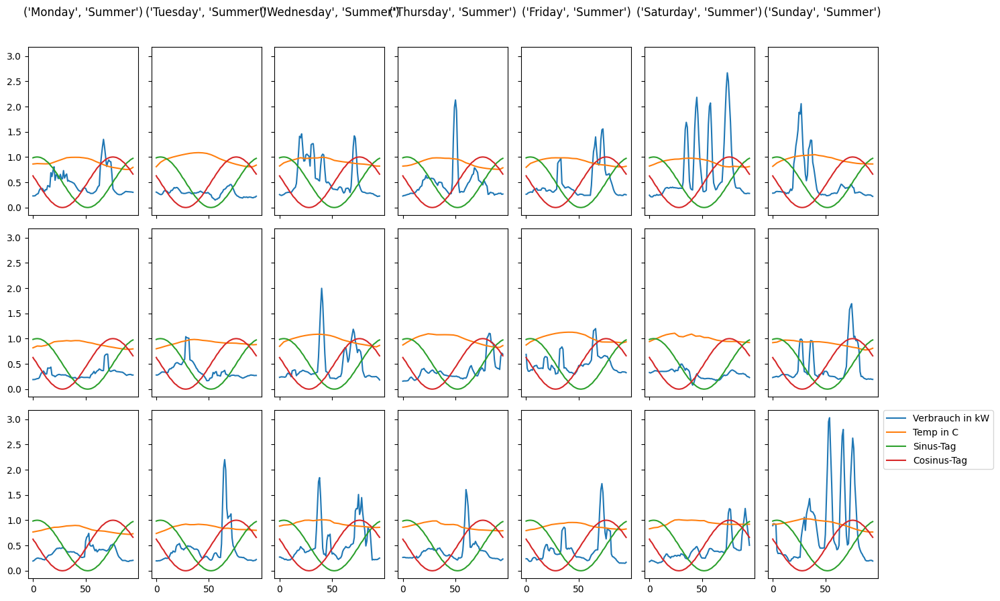

In [75]:
# Select 10 sequences from each tensor
subset_sequences_monday = summer_monday[:3]
subset_sequences_tuesday = summer_tuesday[:3]
subset_sequences_wednesday = summer_wednesday[:3]
subset_sequences_thursday = summer_thursday[:3]
subset_sequences_friday = summer_friday[:3]
subset_sequences_saturday = summer_saturday[:3]
subset_sequences_sunday = summer_sunday[:3]

# Combine the subsets into a list for easy iteration
subset_sequences_list = [
    subset_sequences_monday,
    subset_sequences_tuesday,
    subset_sequences_wednesday,
    subset_sequences_thursday,
    subset_sequences_friday,
    subset_sequences_saturday,
    subset_sequences_sunday
]

# Calculate the number of rows and columns for subplots
num_columns = 7
num_rows = 3

# Create a figure with subplots
fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 3 * num_rows), sharex=True, sharey=True)

# Iterate over the subset of sequences and plot each one in a separate subplot
for i in range(num_rows):
    for j, subset_sequences in enumerate(subset_sequences_list):
        sequence = subset_sequences[i]

        # Extract x and y values for the current sequence
        x_values = np.arange(96)  # Assuming steps go from 0 to 99
        y_values = sequence  # All values from the current sequence

        # Plot the sequence in the corresponding subplot
        for k in range(4):  # Plot each column separately on the y-axis
            axes[i, j].plot(x_values, y_values[:, k], label=f'Column {k + 1}')

        # Set subplot title
        if i == 0:
            axes[i, j].set_title(list(tensor_dict.keys())[j], y=1.15)

# Add legends to the rightmost and lowermost subplots
axes[-1, -1].legend(['Verbrauch in kW', 'Temp in C', 'Sinus-Tag', 'Cosinus-Tag'], loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()

##### winter

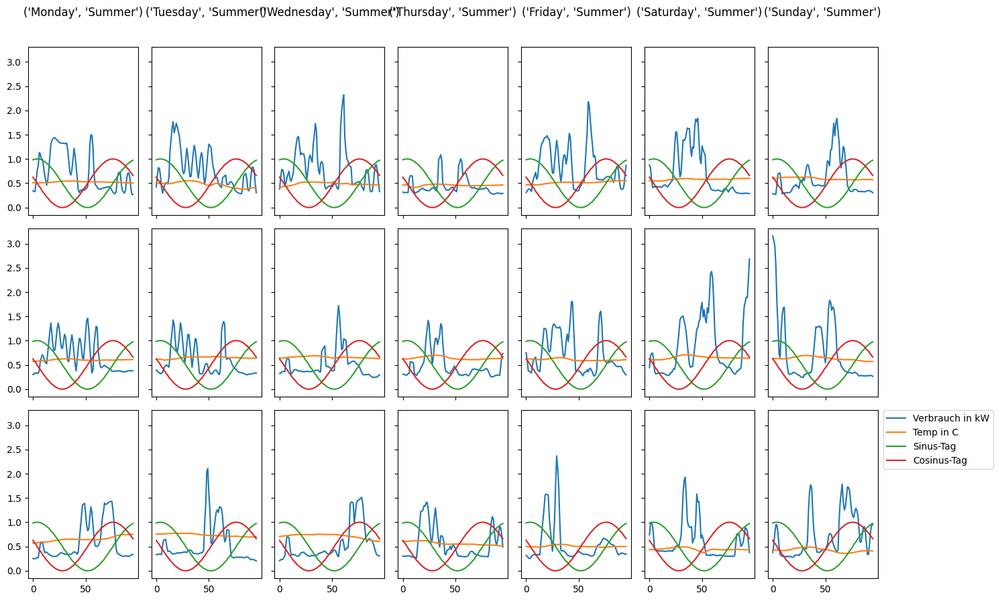

In [76]:
# Select 10 sequences from each tensor
subset_sequences_monday = winter_monday[:3]
subset_sequences_tuesday = winter_tuesday[:3]
subset_sequences_wednesday = winter_wednesday[:3]
subset_sequences_thursday = winter_thursday[:3]
subset_sequences_friday = winter_friday[:3]
subset_sequences_saturday = winter_saturday[:3]
subset_sequences_sunday = winter_sunday[:3]

# Combine the subsets into a list for easy iteration
subset_sequences_list = [
    subset_sequences_monday,
    subset_sequences_tuesday,
    subset_sequences_wednesday,
    subset_sequences_thursday,
    subset_sequences_friday,
    subset_sequences_saturday,
    subset_sequences_sunday
]

# Calculate the number of rows and columns for subplots
num_columns = 7
num_rows = 3

# Create a figure with subplots
fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 3 * num_rows), sharex=True, sharey=True)

# Iterate over the subset of sequences and plot each one in a separate subplot
for i in range(num_rows):
    for j, subset_sequences in enumerate(subset_sequences_list):
        sequence = subset_sequences[i]

        # Extract x and y values for the current sequence
        x_values = np.arange(96)  # Assuming steps go from 0 to 99
        y_values = sequence  # All values from the current sequence

        # Plot the sequence in the corresponding subplot
        for k in range(4):  # Plot each column separately on the y-axis
            axes[i, j].plot(x_values, y_values[:, k], label=f'Column {k + 1}')

        # Set subplot title
        if i == 0:
            axes[i, j].set_title(list(tensor_dict.keys())[j], y=1.15)

# Add legends to the rightmost and lowermost subplots
axes[-1, -1].legend(['Verbrauch in kW', 'Temp in C', 'Sinus-Tag', 'Cosinus-Tag'], loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()

##### transitional

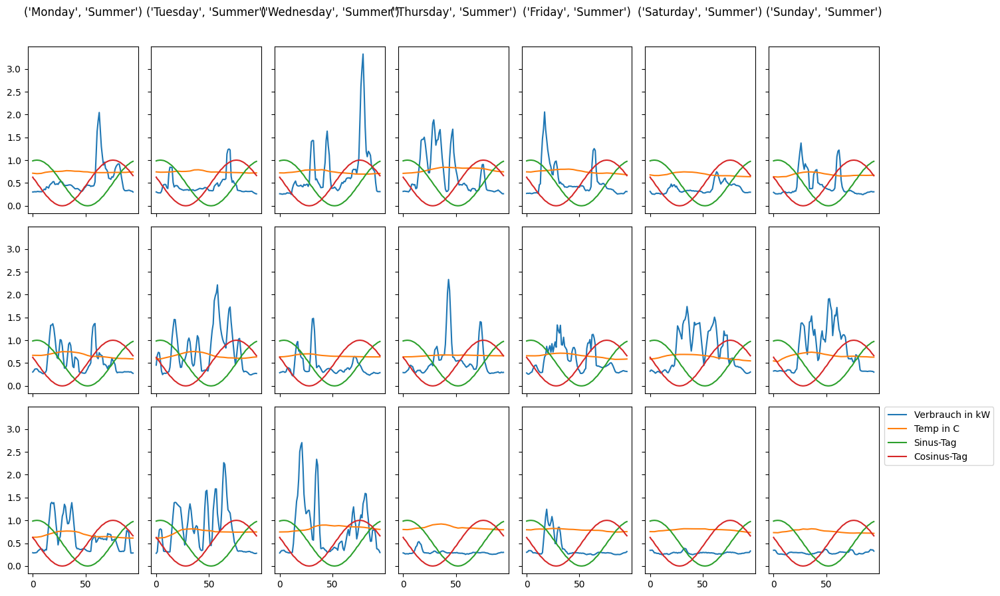

In [77]:
# Select 10 sequences from each tensor
subset_sequences_monday = transitional_monday[:3]
subset_sequences_tuesday = transitional_tuesday[:3]
subset_sequences_wednesday = transitional_wednesday[:3]
subset_sequences_thursday = transitional_thursday[:3]
subset_sequences_friday = transitional_friday[:3]
subset_sequences_saturday = transitional_saturday[:3]
subset_sequences_sunday = transitional_sunday[:3]

# Combine the subsets into a list for easy iteration
subset_sequences_list = [
    subset_sequences_monday,
    subset_sequences_tuesday,
    subset_sequences_wednesday,
    subset_sequences_thursday,
    subset_sequences_friday,
    subset_sequences_saturday,
    subset_sequences_sunday
]

# Calculate the number of rows and columns for subplots
num_columns = 7
num_rows = 3

# Create a figure with subplots
fig, axes = plt.subplots(num_rows, num_columns, figsize=(15, 3 * num_rows), sharex=True, sharey=True)

# Iterate over the subset of sequences and plot each one in a separate subplot
for i in range(num_rows):
    for j, subset_sequences in enumerate(subset_sequences_list):
        sequence = subset_sequences[i]

        # Extract x and y values for the current sequence
        x_values = np.arange(96)  # Assuming steps go from 0 to 99
        y_values = sequence  # All values from the current sequence

        # Plot the sequence in the corresponding subplot
        for k in range(4):  # Plot each column separately on the y-axis
            axes[i, j].plot(x_values, y_values[:, k], label=f'Column {k + 1}')

        # Set subplot title
        if i == 0:
            axes[i, j].set_title(list(tensor_dict.keys())[j], y=1.15)

# Add legends to the rightmost and lowermost subplots
axes[-1, -1].legend(['Verbrauch in kW', 'Temp in C', 'Sinus-Tag', 'Cosinus-Tag'], loc='upper left', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

# Adjust layout to prevent overlapping
plt.tight_layout()
plt.show()

### HMM model

In [78]:
from pomegranate.hmm import DenseHMM
from pomegranate.distributions import *

#### HMM - combining days

In [79]:
# Inspect the shape of the tensors
tensor_names = []
for season_name in ["Winter", "Summer", "Transitional"]:
    for day in weekday_order:
        variable_name = f"{season_name.lower()}_{day.lower()}"
        tensor_names.append(variable_name)

# Access the variables for verification
for tensor_name in tensor_names:
    tensor_variable = globals().get(tensor_name, None)
    if tensor_variable is not None:
        print(f"{tensor_name} shape: {tensor_variable.shape}")
    else:
        print(f"{tensor_name} not found.")

winter_monday shape: (1288, 96, 4)
winter_tuesday shape: (1288, 96, 4)
winter_wednesday shape: (1291, 96, 4)
winter_thursday shape: (1292, 96, 4)
winter_friday shape: (1293, 96, 4)
winter_saturday shape: (1177, 96, 4)
winter_sunday shape: (1056, 96, 4)
summer_monday shape: (1636, 96, 4)
summer_tuesday shape: (1626, 96, 4)
summer_wednesday shape: (1622, 96, 4)
summer_thursday shape: (1622, 96, 4)
summer_friday shape: (1624, 96, 4)
summer_saturday shape: (1659, 96, 4)
summer_sunday shape: (1524, 96, 4)
transitional_monday shape: (1392, 96, 4)
transitional_tuesday shape: (1390, 96, 4)
transitional_wednesday shape: (1381, 96, 4)
transitional_thursday shape: (1384, 96, 4)
transitional_friday shape: (1385, 96, 4)
transitional_saturday shape: (1385, 96, 4)
transitional_sunday shape: (1165, 96, 4)


In [80]:
# Initialize samples_dict before the loop to store the samples generated
samples_dict = {}

# Initialize states_dict before the loop to store the states defined
states_dict = {}

# Loop through each tensor
for tensor_name in tensor_names:
    # Assuming you have the tensor data loaded or defined somewhere
    current_tensor = globals()[tensor_name]

    # Initialize the model with desired number of states
    model = DenseHMM([Normal(), Normal(), Normal(), Normal(), Normal(),
                 Normal(), Normal(), Normal(), Normal(), Normal(),
                 Normal(), Normal(), Normal(), Normal(), Normal(),
                 Normal(), Normal(), Normal(), Normal(), Normal(),
                 Normal(), Normal(), Normal(), Normal(), Normal(),
                 Normal(), Normal(), Normal(), Normal(), Normal(),
                 Normal(), Normal(), Normal(), Normal(), Normal(),
                 Normal(), Normal(), Normal(), Normal(), Normal(),
                 Normal(), Normal(), Normal(), Normal(), Normal(),
                 Normal(), Normal(), Normal(), Normal(), Normal()], max_iter=40, verbose=True)


    
    # Define your model using the current tensor
    model.fit(current_tensor)
    
    # Predict and define states
    states = model.predict(current_tensor)
    
    # Sample from the model
    samples = model.sample(200)

    # Do something with the samples or any other operations you need

    # Create a dictionary for the current tensor's states
    tensor_states_dict = {f"{tensor_name}_{i}": state for i, state in enumerate(states)}

    # Update the main dictionary with the current tensor's states
    states_dict.update(tensor_states_dict)    

    # Create a dictionary for the current tensor's samples
    tensor_samples_dict = {f"{tensor_name}_{i}": sample for i, sample in enumerate(samples)}

    # Update the main dictionary with the current tensor's samples
    samples_dict.update(tensor_samples_dict)
    del model

[1] Improvement: 71084.0390625, Time: 1.122s
[2] Improvement: 28617.0546875, Time: 1.128s
[3] Improvement: 23188.80859375, Time: 1.38s
[4] Improvement: 14660.751953125, Time: 1.559s
[5] Improvement: 9453.123046875, Time: 1.784s
[6] Improvement: 6802.4140625, Time: 1.704s
[7] Improvement: 5378.17333984375, Time: 1.701s
[8] Improvement: 4459.279296875, Time: 1.799s
[9] Improvement: 3719.7666015625, Time: 1.747s
[10] Improvement: 3149.4189453125, Time: 2.022s
[11] Improvement: 2718.60205078125, Time: 1.755s
[12] Improvement: 2129.4228515625, Time: 1.845s
[13] Improvement: 1563.943359375, Time: 1.412s
[14] Improvement: 1275.3505859375, Time: 1.743s
[15] Improvement: 1130.712890625, Time: 1.77s
[16] Improvement: 1093.22265625, Time: 1.716s
[17] Improvement: 1150.873046875, Time: 1.908s
[18] Improvement: 1109.015625, Time: 1.708s
[19] Improvement: 773.49609375, Time: 1.807s
[20] Improvement: 515.3359375, Time: 1.925s
[21] Improvement: 411.7578125, Time: 1.812s
[22] Improvement: 378.08984375,

[3] Improvement: 22185.32421875, Time: 0.7904s


[4] Improvement: 14442.970703125, Time: 0.7936s


[5] Improvement: 9995.896484375, Time: 0.7835s


[6] Improvement: 7723.89453125, Time: 0.7834s


[7] Improvement: 5700.94873046875, Time: 0.7337s


[8] Improvement: 4385.478515625, Time: 0.7265s


[9] Improvement: 3535.918212890625, Time: 0.7525s


[10] Improvement: 2868.01708984375, Time: 0.817s


[11] Improvement: 2399.42236328125, Time: 0.7972s


[12] Improvement: 2019.021484375, Time: 0.7991s


[13] Improvement: 1676.677734375, Time: 0.8081s


[14] Improvement: 1467.4541015625, Time: 0.7578s


[15] Improvement: 1200.9609375, Time: 0.7656s


[16] Improvement: 754.2587890625, Time: 0.9008s


[17] Improvement: 532.013671875, Time: 0.8426s


[18] Improvement: 473.205078125, Time: 0.8651s


[19] Improvement: 411.6171875, Time: 0.8535s


[20] Improvement: 375.271484375, Time: 0.8151s


[21] Improvement: 364.177734375, Time: 0.7887s


[22] Improvement: 381.111328125, Time: 0.7874s


[23] Improvement: 430.296875, Time: 0.8873s


[24] Improvement: 434.8046875, Time: 0.922s


[25] Improvement: 356.76171875, Time: 0.9576s


[26] Improvement: 286.4296875, Time: 0.8113s


[27] Improvement: 252.44921875, Time: 0.8253s


[28] Improvement: 239.568359375, Time: 0.8357s


[29] Improvement: 237.396484375, Time: 0.9982s


[30] Improvement: 247.91796875, Time: 0.964s


[31] Improvement: 260.904296875, Time: 0.9433s


[32] Improvement: 267.525390625, Time: 0.9291s


[33] Improvement: 271.875, Time: 0.8502s


[34] Improvement: 262.81640625, Time: 0.8448s


[35] Improvement: 243.732421875, Time: 0.9413s


[36] Improvement: 241.171875, Time: 1.005s


[37] Improvement: 248.474609375, Time: 1.02s


[38] Improvement: 194.220703125, Time: 0.8534s


[39] Improvement: 149.931640625, Time: 0.8966s


[40] Improvement: 119.791015625, Time: 1.796s


[1] Improvement: 72601.5234375, Time: 0.7695s


[2] Improvement: 27759.75, Time: 0.8147s


[3] Improvement: 23244.1015625, Time: 0.8168s


[4] Improvement: 15068.828125, Time: 0.7876s


[5] Improvement: 9777.06640625, Time: 0.7188s


[6] Improvement: 7045.8466796875, Time: 0.7169s


[7] Improvement: 5460.6923828125, Time: 0.7128s


[8] Improvement: 4694.75, Time: 0.7581s


[9] Improvement: 4397.87109375, Time: 0.8442s


[10] Improvement: 3785.66552734375, Time: 0.8302s


[11] Improvement: 2788.04052734375, Time: 0.7977s


[12] Improvement: 2249.0419921875, Time: 0.7955s


[13] Improvement: 1968.46875, Time: 0.7797s


[14] Improvement: 1552.400390625, Time: 0.7434s


[15] Improvement: 988.84765625, Time: 0.7477s


[16] Improvement: 676.392578125, Time: 0.8459s


[17] Improvement: 542.615234375, Time: 0.8522s


[18] Improvement: 505.033203125, Time: 0.9022s


[19] Improvement: 460.06640625, Time: 0.8712s


[20] Improvement: 400.720703125, Time: 0.8719s


[21] Improvement: 367.91015625, Time: 0.8908s


[22] Improvement: 346.69140625, Time: 0.9987s


[23] Improvement: 332.27734375, Time: 1.048s


[24] Improvement: 315.521484375, Time: 1.048s


[25] Improvement: 296.056640625, Time: 0.9447s


[26] Improvement: 282.4296875, Time: 0.9443s


[27] Improvement: 270.919921875, Time: 0.9739s


[28] Improvement: 260.244140625, Time: 1.016s


[29] Improvement: 252.1171875, Time: 1.019s


[30] Improvement: 236.490234375, Time: 1.005s


[31] Improvement: 218.28515625, Time: 0.9804s


[32] Improvement: 201.283203125, Time: 0.9392s


[33] Improvement: 187.392578125, Time: 1.062s


[34] Improvement: 171.521484375, Time: 0.9974s


[35] Improvement: 157.33984375, Time: 0.9878s


[36] Improvement: 146.25390625, Time: 0.9935s


[37] Improvement: 140.1328125, Time: 0.9066s


[38] Improvement: 150.0, Time: 0.9098s


[39] Improvement: 97.447265625, Time: 1.001s


[40] Improvement: 86.73828125, Time: 2.044s


[1] Improvement: 78434.84375, Time: 0.8187s


[2] Improvement: 27313.171875, Time: 0.7902s


[3] Improvement: 21476.0234375, Time: 0.7686s


[4] Improvement: 14457.115234375, Time: 0.7378s


[5] Improvement: 10852.5546875, Time: 0.7422s


[6] Improvement: 8092.056640625, Time: 0.8006s


[7] Improvement: 5828.7265625, Time: 0.8069s


[8] Improvement: 4376.388671875, Time: 0.8239s


[9] Improvement: 3686.7568359375, Time: 0.7998s


[10] Improvement: 3171.81689453125, Time: 0.795s


[11] Improvement: 2490.77783203125, Time: 0.7812s


[12] Improvement: 1812.787109375, Time: 0.795s


[13] Improvement: 1336.875, Time: 0.8528s


[14] Improvement: 1060.25, Time: 0.8671s


[15] Improvement: 904.6953125, Time: 0.8862s


[16] Improvement: 826.541015625, Time: 0.8683s


[17] Improvement: 826.2255859375, Time: 0.8053s


[18] Improvement: 912.19921875, Time: 0.803s


[19] Improvement: 1018.4013671875, Time: 0.8171s


[20] Improvement: 917.05078125, Time: 0.9131s


[21] Improvement: 638.337890625, Time: 1.046s


[22] Improvement: 443.208984375, Time: 0.888s


[23] Improvement: 364.62890625, Time: 0.8549s


[24] Improvement: 304.037109375, Time: 0.8585s


[25] Improvement: 249.6015625, Time: 0.9239s


[26] Improvement: 216.791015625, Time: 0.9511s


[27] Improvement: 196.181640625, Time: 1.006s


[28] Improvement: 180.37890625, Time: 0.9622s


[29] Improvement: 171.455078125, Time: 0.8895s


[30] Improvement: 167.32421875, Time: 0.8897s


[31] Improvement: 163.451171875, Time: 0.8896s


[32] Improvement: 157.236328125, Time: 0.892s


[33] Improvement: 151.177734375, Time: 0.897s


[34] Improvement: 145.265625, Time: 0.8974s


[35] Improvement: 139.611328125, Time: 0.9008s


[36] Improvement: 135.2265625, Time: 0.8963s


[37] Improvement: 131.1171875, Time: 1.001s


[38] Improvement: 126.794921875, Time: 0.9007s


[39] Improvement: 124.375, Time: 0.901s


[40] Improvement: 122.830078125, Time: 1.817s


[1] Improvement: 68743.734375, Time: 0.7454s


[2] Improvement: 28121.5859375, Time: 0.7684s


[3] Improvement: 23171.5625, Time: 0.7973s


[4] Improvement: 14894.462890625, Time: 0.8269s


[5] Improvement: 10387.759765625, Time: 0.8574s


[6] Improvement: 8130.205078125, Time: 0.8625s


[7] Improvement: 6695.1767578125, Time: 0.8347s


[8] Improvement: 4950.92724609375, Time: 0.7615s


[9] Improvement: 3379.64990234375, Time: 0.7675s


[10] Improvement: 2456.387939453125, Time: 0.7695s


[11] Improvement: 1900.1591796875, Time: 0.8315s


[12] Improvement: 1547.59033203125, Time: 0.9898s


[13] Improvement: 1302.982421875, Time: 0.88s


[14] Improvement: 1128.7236328125, Time: 0.7729s


[15] Improvement: 1041.30859375, Time: 0.7803s


[16] Improvement: 980.6162109375, Time: 0.7911s


[17] Improvement: 887.2646484375, Time: 0.8865s


[18] Improvement: 878.802734375, Time: 0.9179s


[19] Improvement: 936.87109375, Time: 0.9459s


[20] Improvement: 945.611328125, Time: 0.9091s


[21] Improvement: 806.1171875, Time: 0.8875s


[22] Improvement: 648.90625, Time: 0.8752s


[23] Improvement: 584.123046875, Time: 0.9309s


[24] Improvement: 490.9609375, Time: 1.023s


[25] Improvement: 353.748046875, Time: 1.032s


[26] Improvement: 260.66796875, Time: 0.9442s


[27] Improvement: 217.212890625, Time: 0.9637s


[28] Improvement: 205.955078125, Time: 0.9651s


[29] Improvement: 194.15234375, Time: 1.036s


[30] Improvement: 181.13671875, Time: 1.069s


[31] Improvement: 169.16796875, Time: 1.114s


[32] Improvement: 155.20703125, Time: 1.03s


[33] Improvement: 143.650390625, Time:  1.0s


[34] Improvement: 133.6796875, Time: 1.049s


[35] Improvement: 127.38671875, Time: 1.119s


[36] Improvement: 120.216796875, Time: 1.097s


[37] Improvement: 112.162109375, Time: 1.026s


[38] Improvement: 106.208984375, Time: 1.023s


[39] Improvement: 104.130859375, Time: 1.062s


[40] Improvement: 106.482421875, Time: 2.29s


[1] Improvement: 74047.875, Time: 0.7865s


[2] Improvement: 27319.9453125, Time: 0.7817s


[3] Improvement: 22326.43359375, Time: 0.7456s


[4] Improvement: 14576.70703125, Time: 0.7437s


[5] Improvement: 10394.416015625, Time: 0.7364s


[6] Improvement: 8093.0908203125, Time: 0.816s


[7] Improvement: 6294.16015625, Time: 0.814s


[8] Improvement: 5246.82177734375, Time: 0.7981s


[9] Improvement: 4053.728515625, Time: 0.8193s


[10] Improvement: 2911.59033203125, Time: 0.8417s


[11] Improvement: 2305.4287109375, Time: 0.7954s


[12] Improvement: 1891.373046875, Time: 0.76s


[13] Improvement: 1531.8232421875, Time: 0.7643s


[14] Improvement: 1234.6845703125, Time: 0.7699s


[15] Improvement: 940.138671875, Time: 0.7774s


[16] Improvement: 790.17578125, Time: 0.785s


[17] Improvement: 707.595703125, Time: 0.7896s


[18] Improvement: 578.017578125, Time: 0.7984s


[19] Improvement: 449.86328125, Time: 0.799s


[20] Improvement: 387.466796875, Time: 0.8828s


[21] Improvement: 376.12109375, Time: 0.8012s


[22] Improvement: 377.869140625, Time: 0.799s


[23] Improvement: 374.021484375, Time: 0.7986s


[24] Improvement: 356.99609375, Time: 0.8129s


[25] Improvement: 328.92578125, Time: 0.8041s


[26] Improvement: 306.19140625, Time: 0.8093s


[27] Improvement: 292.529296875, Time: 0.81s


[28] Improvement: 288.306640625, Time: 0.8185s


[29] Improvement: 289.5390625, Time: 0.8125s


[30] Improvement: 296.9375, Time: 0.8199s


[31] Improvement: 292.396484375, Time: 0.8174s


[32] Improvement: 302.119140625, Time: 0.8304s


[33] Improvement: 337.1796875, Time: 0.9711s


[34] Improvement: 344.203125, Time: 0.951s


[35] Improvement: 285.173828125, Time: 1.004s


[36] Improvement: 237.939453125, Time: 0.9097s


[37] Improvement: 234.00390625, Time: 0.8647s


[38] Improvement: 262.849609375, Time: 0.9632s


[39] Improvement: 262.314453125, Time: 0.9503s


[40] Improvement: 187.38671875, Time: 2.02s


[1] Improvement: 63727.6015625, Time: 0.7414s


[2] Improvement: 24397.734375, Time: 0.7511s


[3] Improvement: 20077.13671875, Time: 0.7382s


[4] Improvement: 14066.548828125, Time: 0.7434s


[5] Improvement: 10199.46484375, Time: 0.6859s


[6] Improvement: 7353.9287109375, Time: 0.7252s


[7] Improvement: 5425.82421875, Time: 0.7439s


[8] Improvement: 4266.36279296875, Time: 0.7453s


[9] Improvement: 3278.292236328125, Time: 0.7329s


[10] Improvement: 2350.59375, Time: 0.7454s


[11] Improvement: 1659.8587646484375, Time: 0.7079s


[12] Improvement: 1312.134033203125, Time: 0.7028s


[13] Improvement: 1233.6513671875, Time: 0.7008s


[14] Improvement: 1178.515625, Time: 0.8122s


[15] Improvement: 1086.18994140625, Time: 0.8363s


[16] Improvement: 1077.240234375, Time: 0.8549s


[17] Improvement: 1073.9296875, Time: 0.7969s


[18] Improvement: 972.322265625, Time: 0.8035s


[19] Improvement: 779.1474609375, Time: 0.7221s


[20] Improvement: 580.556640625, Time: 0.7264s


[21] Improvement: 477.3330078125, Time: 0.7276s


[22] Improvement: 416.71484375, Time: 0.7362s


[23] Improvement: 380.9580078125, Time: 0.739s


[24] Improvement: 352.3408203125, Time: 0.7447s


[25] Improvement: 324.333984375, Time: 0.749s


[26] Improvement: 291.599609375, Time: 0.7532s


[27] Improvement: 263.908203125, Time: 0.7601s


[28] Improvement: 249.365234375, Time: 0.8215s


[29] Improvement: 238.85546875, Time: 0.8146s


[30] Improvement: 232.98046875, Time: 0.7733s


[31] Improvement: 240.0615234375, Time: 0.7721s


[32] Improvement: 249.494140625, Time: 0.7805s


[33] Improvement: 252.06640625, Time: 0.9185s


[34] Improvement: 252.1826171875, Time: 0.7898s


[35] Improvement: 235.794921875, Time:  0.8s


[36] Improvement: 211.798828125, Time: 0.8013s


[37] Improvement: 191.044921875, Time: 0.8129s


[38] Improvement: 159.658203125, Time: 0.8219s


[39] Improvement: 117.990234375, Time: 0.8182s


[40] Improvement: 84.544921875, Time: 1.659s


[1] Improvement: 58070.3359375, Time: 0.6189s


[2] Improvement: 21774.1796875, Time: 0.6477s


[3] Improvement: 17399.0234375, Time: 0.653s


[4] Improvement: 12717.197265625, Time: 0.6667s


[5] Improvement: 9674.505859375, Time: 0.6461s


[6] Improvement: 6519.712890625, Time: 0.6577s


[7] Improvement: 4106.2890625, Time: 0.6052s


[8] Improvement: 2955.482421875, Time: 0.6133s


[9] Improvement: 2338.79638671875, Time: 0.6162s


[10] Improvement: 2086.4814453125, Time: 0.6523s


[11] Improvement: 2035.80810546875, Time: 0.6841s


[12] Improvement: 1903.5772705078125, Time: 0.7112s


[13] Improvement: 1605.364013671875, Time: 0.6974s


[14] Improvement: 1285.013916015625, Time: 0.6924s


[15] Improvement: 1035.611328125, Time: 0.7061s


[16] Improvement: 813.021484375, Time: 0.6305s


[17] Improvement: 676.68603515625, Time: 0.628s


[18] Improvement: 615.47509765625, Time: 0.6352s


[19] Improvement: 619.9990234375, Time: 0.6416s


[20] Improvement: 646.2353515625, Time: 0.6424s


[21] Improvement: 692.8857421875, Time: 0.6543s


[22] Improvement: 637.53515625, Time: 0.646s


[23] Improvement: 490.6953125, Time: 0.6507s


[24] Improvement: 374.8349609375, Time: 0.6583s


[25] Improvement: 321.6767578125, Time: 0.6597s


[26] Improvement: 294.3203125, Time: 0.6665s


[27] Improvement: 243.2578125, Time: 0.7471s


[28] Improvement: 189.8798828125, Time: 0.6834s


[29] Improvement: 149.919921875, Time: 0.6721s


[30] Improvement: 115.0341796875, Time: 0.6771s


[31] Improvement: 89.9462890625, Time: 0.7074s


[32] Improvement: 77.1708984375, Time: 0.6861s


[33] Improvement: 72.009765625, Time: 0.6916s


[34] Improvement: 69.544921875, Time: 0.6929s


[35] Improvement: 67.3515625, Time: 0.6955s


[36] Improvement: 64.359375, Time: 0.6969s


[37] Improvement: 61.2587890625, Time: 0.7027s


[38] Improvement: 59.5400390625, Time: 0.7015s


[39] Improvement: 58.724609375, Time: 0.702s


[40] Improvement: 60.0849609375, Time: 1.426s


[1] Improvement: 90710.0859375, Time: 0.9462s


[2] Improvement: 35851.1484375, Time: 1.032s


[3] Improvement: 28407.1875, Time: 1.023s


[4] Improvement: 19847.29296875, Time: 1.008s


[5] Improvement: 13482.99609375, Time: 0.9735s


[6] Improvement: 9155.1796875, Time: 0.9285s


[7] Improvement: 7484.3984375, Time: 0.9824s


[8] Improvement: 5962.21044921875, Time: 1.04s


[9] Improvement: 5000.3212890625, Time: 1.025s


[10] Improvement: 4474.193359375, Time: 1.058s


[11] Improvement: 3662.0546875, Time: 1.041s


[12] Improvement: 2597.259765625, Time: 0.9529s


[13] Improvement: 1776.455078125, Time: 0.9609s


[14] Improvement: 1139.158203125, Time: 0.9784s


[15] Improvement: 771.7109375, Time: 0.9643s


[16] Improvement: 612.916015625, Time: 0.9835s


[17] Improvement: 548.091796875, Time: 0.9951s


[18] Improvement: 532.126953125, Time: 1.046s


[19] Improvement: 527.376953125, Time: 1.093s


[20] Improvement: 511.298828125, Time: 1.028s


[21] Improvement: 484.0625, Time: 1.174s


[22] Improvement: 442.732421875, Time: 1.158s


[23] Improvement: 402.15625, Time: 1.041s


[24] Improvement: 374.587890625, Time: 1.051s


[25] Improvement: 367.150390625, Time: 1.064s


[26] Improvement: 374.876953125, Time: 1.062s


[27] Improvement: 395.580078125, Time: 1.085s


[28] Improvement: 446.921875, Time: 1.119s


[29] Improvement: 498.8125, Time: 1.28s


[30] Improvement: 487.6171875, Time: 1.25s


[31] Improvement: 450.08203125, Time: 1.218s


[32] Improvement: 407.6953125, Time: 1.139s


[33] Improvement: 357.84765625, Time: 1.241s


[34] Improvement: 302.87109375, Time: 1.38s


[35] Improvement: 261.4140625, Time: 1.188s


[36] Improvement: 248.125, Time: 1.171s


[37] Improvement: 255.3671875, Time: 1.209s


[38] Improvement: 274.2890625, Time: 1.287s


[39] Improvement: 282.5, Time: 1.416s


[40] Improvement: 252.85546875, Time: 2.647s


[1] Improvement: 88370.8515625, Time: 0.9208s


[2] Improvement: 35651.1484375, Time: 0.949s


[3] Improvement: 29807.03125, Time: 1.027s


[4] Improvement: 20046.958984375, Time: 1.065s


[5] Improvement: 12396.791015625, Time: 1.036s


[6] Improvement: 8484.0478515625, Time: 1.043s


[7] Improvement: 6742.19580078125, Time: 0.9141s


[8] Improvement: 5671.35693359375, Time: 0.9292s


[9] Improvement: 4688.0, Time: 0.933s


[10] Improvement: 3684.626953125, Time: 0.9334s


[11] Improvement: 2861.701171875, Time: 0.9424s


[12] Improvement: 2441.0224609375, Time: 0.9356s


[13] Improvement: 2306.849609375, Time: 0.9345s


[14] Improvement: 2098.84765625, Time: 1.059s


[15] Improvement: 1637.46875, Time: 0.9589s


[16] Improvement: 1232.6171875, Time: 0.958s


[17] Improvement: 945.220703125, Time: 0.9562s


[18] Improvement: 678.80859375, Time: 0.966s


[19] Improvement: 522.873046875, Time: 0.9764s


[20] Improvement: 480.80859375, Time: 0.9811s


[21] Improvement: 498.220703125, Time: 0.9906s


[22] Improvement: 564.26171875, Time: 0.9944s


[23] Improvement: 612.169921875, Time: 0.9897s


[24] Improvement: 546.0234375, Time: 0.9887s


[25] Improvement: 439.765625, Time: 1.168s


[26] Improvement: 396.494140625, Time: 1.168s


[27] Improvement: 414.587890625, Time: 1.204s


[28] Improvement: 400.34765625, Time: 1.02s


[29] Improvement: 465.056640625, Time: 1.026s


[30] Improvement: 390.884765625, Time: 1.08s


[31] Improvement: 350.78125, Time: 1.203s


[32] Improvement: 280.162109375, Time: 1.181s


[33] Improvement: 221.248046875, Time: 1.057s


[34] Improvement: 188.91796875, Time: 1.055s


[35] Improvement: 172.375, Time: 1.148s


[36] Improvement: 157.0546875, Time: 1.216s


[37] Improvement: 149.68359375, Time: 1.207s


[38] Improvement: 151.6015625, Time: 1.116s


[39] Improvement: 159.7109375, Time: 1.066s


[40] Improvement: 162.3828125, Time: 2.152s


[1] Improvement: 90429.84375, Time: 0.9283s


[2] Improvement: 35066.75, Time: 0.9371s


[3] Improvement: 27568.6640625, Time: 0.9207s


[4] Improvement: 17778.6796875, Time: 0.9181s


[5] Improvement: 12253.857421875, Time: 0.9416s


[6] Improvement: 9220.400390625, Time: 1.009s


[7] Improvement: 6932.70556640625, Time: 1.066s


[8] Improvement: 5302.5380859375, Time: 1.006s


[9] Improvement: 4245.88818359375, Time: 0.9481s


[10] Improvement: 3626.119140625, Time: 0.938s


[11] Improvement: 3157.9736328125, Time: 0.9912s


[12] Improvement: 2744.044921875, Time: 1.02s


[13] Improvement: 2420.11328125, Time: 1.042s


[14] Improvement: 2062.689453125, Time: 1.038s


[15] Improvement: 1938.109375, Time: 0.9902s


[16] Improvement: 1814.48828125, Time: 0.9593s


[17] Improvement: 1542.8359375, Time: 0.9684s


[18] Improvement: 1406.798828125, Time: 0.9715s


[19] Improvement: 1196.8828125, Time: 0.9786s


[20] Improvement: 1002.529296875, Time: 0.9933s


[21] Improvement: 886.806640625, Time: 0.984s


[22] Improvement: 697.439453125, Time: 1.182s


[23] Improvement: 592.283203125, Time: 0.9982s


[24] Improvement: 552.078125, Time: 0.9976s


[25] Improvement: 462.958984375, Time: 0.9969s


[26] Improvement: 407.666015625, Time: 0.9957s


[27] Improvement: 402.994140625, Time: 1.008s


[28] Improvement: 399.05078125, Time: 0.9992s


[29] Improvement: 366.572265625, Time: 1.012s


[30] Improvement: 330.15234375, Time: 1.007s


[31] Improvement: 302.982421875, Time: 1.007s


[32] Improvement: 260.966796875, Time: 1.069s


[33] Improvement: 199.75, Time: 1.203s


[34] Improvement: 138.8046875, Time: 1.235s


[35] Improvement: 104.9296875, Time: 1.163s


[36] Improvement: 80.00390625, Time: 1.112s


[37] Improvement: 73.8046875, Time: 1.186s


[38] Improvement: 83.09375, Time: 1.236s


[39] Improvement: 93.3515625, Time: 1.227s


[40] Improvement: 97.66796875, Time: 2.41s


[1] Improvement: 92166.8515625, Time: 0.9153s


[2] Improvement: 35502.6796875, Time: 1.019s


[3] Improvement: 27881.6015625, Time: 1.03s


[4] Improvement: 18345.984375, Time: 1.053s


[5] Improvement: 13112.509765625, Time: 0.9518s


[6] Improvement: 9892.201171875, Time: 0.9318s


[7] Improvement: 7205.18798828125, Time: 1.001s


[8] Improvement: 5538.0048828125, Time: 1.029s


[9] Improvement: 4374.08251953125, Time: 1.03s


[10] Improvement: 3491.7802734375, Time: 1.077s


[11] Improvement: 3044.328125, Time: 0.9398s


[12] Improvement: 3073.9345703125, Time: 0.9471s


[13] Improvement: 2985.208984375, Time: 0.9541s


[14] Improvement: 2072.60546875, Time: 0.954s


[15] Improvement: 1230.82421875, Time: 0.9682s


[16] Improvement: 842.1953125, Time: 0.9731s


[17] Improvement: 657.3359375, Time: 0.9933s


[18] Improvement: 560.39453125, Time: 1.042s


[19] Improvement: 496.283203125, Time: 1.102s


[20] Improvement: 455.126953125, Time: 1.059s


[21] Improvement: 434.373046875, Time: 1.079s


[22] Improvement: 422.388671875, Time:  1.1s


[23] Improvement: 422.626953125, Time: 1.131s


[24] Improvement: 424.712890625, Time:  1.2s


[25] Improvement: 422.017578125, Time: 1.219s


[26] Improvement: 417.099609375, Time: 1.195s


[27] Improvement: 404.751953125, Time: 1.15s


[28] Improvement: 384.017578125, Time: 1.328s


[29] Improvement: 351.98828125, Time: 1.292s


[30] Improvement: 329.35546875, Time: 1.265s


[31] Improvement: 332.30078125, Time: 1.184s


[32] Improvement: 341.1953125, Time: 1.204s


[33] Improvement: 325.60546875, Time: 1.278s


[34] Improvement: 311.42578125, Time: 1.317s


[35] Improvement: 339.21484375, Time: 1.22s


[36] Improvement: 324.61328125, Time: 1.22s


[37] Improvement: 254.5078125, Time: 1.39s


[38] Improvement: 207.2265625, Time: 1.279s


[39] Improvement: 194.71484375, Time: 1.273s


[40] Improvement: 199.95703125, Time: 2.506s


[1] Improvement: 91737.28125, Time: 0.9879s


[2] Improvement: 34737.9296875, Time: 0.9817s


[3] Improvement: 28230.56640625, Time: 0.9961s


[4] Improvement: 19210.3984375, Time: 0.9656s


[5] Improvement: 13341.302734375, Time: 0.9705s


[6] Improvement: 9187.7958984375, Time: 0.9017s


[7] Improvement: 6642.482421875, Time: 0.9056s


[8] Improvement: 5203.044921875, Time: 0.9073s


[9] Improvement: 4481.4013671875, Time: 0.9111s


[10] Improvement: 4006.85888671875, Time: 0.9047s


[11] Improvement: 3395.4150390625, Time: 0.912s


[12] Improvement: 2616.6201171875, Time: 0.9151s


[13] Improvement: 2027.2626953125, Time: 1.042s


[14] Improvement: 1693.14453125, Time: 0.9201s


[15] Improvement: 1375.6875, Time: 0.929s


[16] Improvement: 1196.861328125, Time: 0.9418s


[17] Improvement: 1178.7890625, Time: 0.9559s


[18] Improvement: 1102.2578125, Time: 0.981s


[19] Improvement: 999.322265625, Time: 1.002s


[20] Improvement: 1031.68359375, Time: 0.9865s


[21] Improvement: 1040.400390625, Time: 0.9964s


[22] Improvement: 829.775390625, Time: 1.017s


[23] Improvement: 594.123046875, Time: 1.016s


[24] Improvement: 453.43359375, Time: 1.125s


[25] Improvement: 390.685546875, Time: 1.147s


[26] Improvement: 364.892578125, Time: 1.187s


[27] Improvement: 356.158203125, Time: 1.03s


[28] Improvement: 358.376953125, Time: 1.012s


[29] Improvement: 382.298828125, Time: 1.128s


[30] Improvement: 411.58203125, Time: 1.177s


[31] Improvement: 421.671875, Time: 1.139s


[32] Improvement: 483.71484375, Time: 1.036s


[33] Improvement: 312.55078125, Time: 1.04s


[34] Improvement: 195.75, Time: 1.183s


[35] Improvement: 170.9296875, Time: 1.256s


[36] Improvement: 166.0703125, Time: 1.255s


[37] Improvement: 204.74609375, Time: 1.092s


[38] Improvement: 181.41796875, Time: 1.16s


[39] Improvement: 147.1953125, Time: 1.337s


[40] Improvement: 163.13671875, Time: 2.803s


[1] Improvement: 98029.203125, Time: 0.9322s


[2] Improvement: 34998.25, Time: 0.9397s


[3] Improvement: 28938.06640625, Time: 0.9927s


[4] Improvement: 19783.96875, Time: 1.009s


[5] Improvement: 14125.796875, Time: 1.099s


[6] Improvement: 10748.2470703125, Time: 1.014s


[7] Improvement: 8409.62890625, Time: 0.9398s


[8] Improvement: 6044.50146484375, Time: 0.9938s


[9] Improvement: 4649.8515625, Time: 1.075s


[10] Improvement: 4092.0322265625, Time: 1.045s


[11] Improvement: 3858.9033203125, Time: 1.071s


[12] Improvement: 3335.66015625, Time: 1.049s


[13] Improvement: 2218.52734375, Time: 0.9622s


[14] Improvement: 1401.248046875, Time: 0.9672s


[15] Improvement: 1110.09375, Time: 1.102s


[16] Improvement: 1004.564453125, Time: 1.188s


[17] Improvement: 996.380859375, Time: 1.096s


[18] Improvement: 997.046875, Time: 1.04s


[19] Improvement: 866.828125, Time: 1.137s


[20] Improvement: 629.328125, Time: 1.203s


[21] Improvement: 438.80078125, Time: 1.174s


[22] Improvement: 332.4609375, Time: 1.156s


[23] Improvement: 281.236328125, Time: 1.125s


[24] Improvement: 249.625, Time: 1.134s


[25] Improvement: 231.529296875, Time: 1.149s


[26] Improvement: 215.533203125, Time: 1.156s


[27] Improvement: 199.974609375, Time: 1.158s


[28] Improvement: 184.431640625, Time: 1.169s


[29] Improvement: 168.978515625, Time: 1.235s


[30] Improvement: 153.85546875, Time: 1.182s


[31] Improvement: 135.322265625, Time: 1.186s


[32] Improvement: 121.09375, Time: 1.187s


[33] Improvement: 107.439453125, Time: 1.189s


[34] Improvement: 93.408203125, Time: 1.301s


[35] Improvement: 81.365234375, Time: 1.24s


[36] Improvement: 69.912109375, Time: 1.21s


[37] Improvement: 63.1796875, Time: 1.252s


[38] Improvement: 55.58984375, Time: 1.388s


[39] Improvement: 51.49609375, Time: 1.412s


[40] Improvement: 47.814453125, Time: 2.653s


[1] Improvement: 86718.90625, Time: 0.8653s


[2] Improvement: 31946.8515625, Time: 0.8953s


[3] Improvement: 24742.65625, Time: 0.939s


[4] Improvement: 17393.609375, Time: 0.9287s


[5] Improvement: 12193.365234375, Time: 0.9452s


[6] Improvement: 8577.7783203125, Time: 0.9264s


[7] Improvement: 6598.408203125, Time: 0.979s


[8] Improvement: 5655.13330078125, Time: 0.9337s


[9] Improvement: 4877.01953125, Time: 0.9406s


[10] Improvement: 4059.029541015625, Time: 0.9432s


[11] Improvement: 3365.98486328125, Time: 0.9437s


[12] Improvement: 2746.0625, Time: 0.8785s


[13] Improvement: 2278.126953125, Time: 0.8869s


[14] Improvement: 1984.76953125, Time: 0.9024s


[15] Improvement: 1683.17578125, Time: 1.001s


[16] Improvement: 1574.572265625, Time: 1.034s


[17] Improvement: 1380.2109375, Time: 1.104s


[18] Improvement: 977.744140625, Time: 0.9758s


[19] Improvement: 710.6328125, Time: 0.9434s


[20] Improvement: 619.70703125, Time: 1.133s


[21] Improvement: 544.162109375, Time: 0.9355s


[22] Improvement: 466.4765625, Time: 0.937s


[23] Improvement: 403.83984375, Time: 0.9461s


[24] Improvement: 356.326171875, Time: 0.9522s


[25] Improvement: 316.978515625, Time: 0.97s


[26] Improvement: 290.748046875, Time: 1.062s


[27] Improvement: 276.201171875, Time: 0.9844s


[28] Improvement: 285.6328125, Time: 0.9907s


[29] Improvement: 300.64453125, Time: 1.001s


[30] Improvement: 280.380859375, Time: 1.003s


[31] Improvement: 233.501953125, Time: 1.01s


[32] Improvement: 182.888671875, Time: 1.017s


[33] Improvement: 143.0625, Time: 1.017s


[34] Improvement: 119.333984375, Time: 1.018s


[35] Improvement: 104.064453125, Time: 1.025s


[36] Improvement: 98.673828125, Time: 1.136s


[37] Improvement: 95.083984375, Time: 1.249s


[38] Improvement: 88.912109375, Time: 1.219s


[39] Improvement: 87.529296875, Time: 1.049s


[40] Improvement: 83.99609375, Time: 2.125s


[1] Improvement: 71639.59375, Time: 0.7744s


[2] Improvement: 31042.109375, Time: 0.8538s


[3] Improvement: 24803.56640625, Time: 0.845s


[4] Improvement: 16001.3203125, Time: 0.864s


[5] Improvement: 11063.01953125, Time: 0.8762s


[6] Improvement: 8102.1171875, Time: 0.8537s


[7] Improvement: 6042.013671875, Time: 0.8589s


[8] Improvement: 4568.6162109375, Time: 0.7772s


[9] Improvement: 3547.36328125, Time: 0.7879s


[10] Improvement: 2940.44091796875, Time: 0.7947s


[11] Improvement: 2345.427734375, Time: 0.7946s


[12] Improvement: 1889.51416015625, Time: 0.7953s


[13] Improvement: 1805.2373046875, Time: 0.7904s


[14] Improvement: 1875.09375, Time: 0.8042s


[15] Improvement: 1794.802734375, Time: 0.8205s


[16] Improvement: 1562.4052734375, Time: 0.9011s


[17] Improvement: 1250.927734375, Time: 0.8061s


[18] Improvement: 866.0615234375, Time: 0.8123s


[19] Improvement: 683.05859375, Time: 0.8148s


[20] Improvement: 605.47265625, Time: 0.835s


[21] Improvement: 486.369140625, Time: 0.8258s


[22] Improvement: 364.966796875, Time: 0.8329s


[23] Improvement: 312.822265625, Time: 0.8352s


[24] Improvement: 291.48046875, Time: 0.8489s


[25] Improvement: 287.91796875, Time: 0.8346s


[26] Improvement: 302.6640625, Time: 0.8308s


[27] Improvement: 341.060546875, Time: 0.8314s


[28] Improvement: 495.015625, Time: 0.961s


[29] Improvement: 715.779296875, Time: 1.016s


[30] Improvement: 501.087890625, Time: 0.9756s


[31] Improvement: 377.001953125, Time: 0.9863s


[32] Improvement: 389.41015625, Time: 0.8477s


[33] Improvement: 385.916015625, Time: 0.8494s


[34] Improvement: 348.357421875, Time: 0.9747s


[35] Improvement: 253.326171875, Time: 0.9991s


[36] Improvement: 186.744140625, Time: 1.047s


[37] Improvement: 149.189453125, Time: 0.8736s


[38] Improvement: 129.75390625, Time: 0.8847s


[39] Improvement: 119.640625, Time: 0.8973s


[40] Improvement: 116.3203125, Time: 1.928s


[1] Improvement: 76165.578125, Time: 0.8618s


[2] Improvement: 31356.3359375, Time: 0.8642s


[3] Improvement: 24917.609375, Time: 0.8499s


[4] Improvement: 17398.458984375, Time: 0.8463s


[5] Improvement: 10966.603515625, Time: 0.7909s


[6] Improvement: 7462.9775390625, Time: 0.7878s


[7] Improvement: 6299.28564453125, Time: 0.8679s


[8] Improvement: 4693.4208984375, Time: 0.8705s


[9] Improvement: 2843.23828125, Time: 0.8679s


[10] Improvement: 1944.68505859375, Time: 0.908s


[11] Improvement: 1728.486328125, Time: 0.8948s


[12] Improvement: 1530.125, Time: 0.8114s


[13] Improvement: 1279.830078125, Time: 0.8159s


[14] Improvement: 1131.0078125, Time: 0.8152s


[15] Improvement: 1081.599609375, Time: 0.8183s


[16] Improvement: 1117.470703125, Time: 0.8309s


[17] Improvement: 1220.900390625, Time: 0.8279s


[18] Improvement: 1342.01953125, Time: 0.8323s


[19] Improvement: 1312.580078125, Time: 0.8373s


[20] Improvement: 1146.1484375, Time: 0.9425s


[21] Improvement: 1052.458984375, Time: 0.8758s


[22] Improvement: 874.869140625, Time: 0.8676s


[23] Improvement: 711.91015625, Time: 0.887s


[24] Improvement: 645.23828125, Time: 0.9158s


[25] Improvement: 587.689453125, Time: 0.9338s


[26] Improvement: 528.65625, Time: 0.9444s


[27] Improvement: 460.720703125, Time: 0.9598s


[28] Improvement: 364.578125, Time: 0.9856s


[29] Improvement: 272.94140625, Time: 0.9826s


[30] Improvement: 214.876953125, Time: 0.9896s


[31] Improvement: 191.42578125, Time: 1.005s


[32] Improvement: 185.96875, Time: 1.089s


[33] Improvement: 186.896484375, Time: 1.063s


[34] Improvement: 180.580078125, Time: 1.146s


[35] Improvement: 168.1484375, Time: 1.02s


[36] Improvement: 160.689453125, Time: 1.031s


[37] Improvement: 157.29296875, Time: 1.075s


[38] Improvement: 156.05859375, Time: 1.119s


[39] Improvement: 145.841796875, Time: 1.106s


[40] Improvement: 125.90625, Time: 2.189s


[1] Improvement: 78609.2265625, Time: 0.7773s


[2] Improvement: 30886.6171875, Time: 0.8389s


[3] Improvement: 24581.7265625, Time: 0.8484s


[4] Improvement: 16746.658203125, Time: 0.875s


[5] Improvement: 10966.978515625, Time: 0.8525s


[6] Improvement: 7973.88671875, Time: 0.8212s


[7] Improvement: 6070.6484375, Time: 0.7862s


[8] Improvement: 4707.19091796875, Time: 0.8355s


[9] Improvement: 3921.82080078125, Time: 0.9043s


[10] Improvement: 3059.6240234375, Time: 0.9244s


[11] Improvement: 2301.494140625, Time: 0.9048s


[12] Improvement: 1854.3154296875, Time: 0.8686s


[13] Improvement: 1416.697265625, Time: 0.8251s


[14] Improvement: 1022.1083984375, Time: 0.8194s


[15] Improvement: 807.2177734375, Time: 0.886s


[16] Improvement: 656.546875, Time: 0.9568s


[17] Improvement: 555.6875, Time: 0.9431s


[18] Improvement: 525.4296875, Time: 0.8499s


[19] Improvement: 507.78125, Time: 0.8342s


[20] Improvement: 541.3828125, Time: 0.8329s


[21] Improvement: 508.2578125, Time: 0.9527s


[22] Improvement: 468.703125, Time: 0.9547s


[23] Improvement: 448.787109375, Time: 1.07s


[24] Improvement: 443.126953125, Time: 0.9926s


[25] Improvement: 419.498046875, Time: 0.8484s


[26] Improvement: 434.275390625, Time: 0.8488s


[27] Improvement: 469.125, Time: 0.9669s


[28] Improvement: 392.55078125, Time: 1.01s


[29] Improvement: 294.8984375, Time: 0.9726s


[30] Improvement: 244.578125, Time: 0.8989s


[31] Improvement: 227.91796875, Time: 0.8681s


[32] Improvement: 231.525390625, Time: 0.867s


[33] Improvement: 249.5625, Time: 0.9978s


[34] Improvement: 257.494140625, Time: 0.977s


[35] Improvement: 236.7890625, Time: 1.011s


[36] Improvement: 217.177734375, Time: 0.9782s


[37] Improvement: 224.857421875, Time: 0.8781s


[38] Improvement: 253.80078125, Time: 0.8783s


[39] Improvement: 255.783203125, Time: 0.9982s


[40] Improvement: 203.1015625, Time: 2.091s


[1] Improvement: 72204.203125, Time: 0.8519s


[2] Improvement: 29630.2265625, Time: 0.8475s


[3] Improvement: 22270.12890625, Time: 0.7798s


[4] Improvement: 15577.93359375, Time: 0.7695s


[5] Improvement: 10664.05078125, Time: 0.791s


[6] Improvement: 7616.83203125, Time: 0.8405s


[7] Improvement: 6136.28759765625, Time: 0.8602s


[8] Improvement: 5014.53125, Time: 0.8853s


[9] Improvement: 4196.45703125, Time: 0.8011s


[10] Improvement: 3932.24658203125, Time: 0.785s


[11] Improvement: 3451.9033203125, Time: 0.7942s


[12] Improvement: 2577.4599609375, Time: 0.9134s


[13] Improvement: 1865.279296875, Time: 0.8868s


[14] Improvement: 1575.705078125, Time: 0.9172s


[15] Improvement: 1574.7880859375, Time: 0.9327s


[16] Improvement: 1563.962890625, Time: 0.8167s


[17] Improvement: 1241.80859375, Time: 0.803s


[18] Improvement: 940.83203125, Time: 0.8116s


[19] Improvement: 752.876953125, Time: 0.816s


[20] Improvement: 578.10546875, Time: 0.8245s


[21] Improvement: 440.00390625, Time: 0.8226s


[22] Improvement: 355.548828125, Time: 0.8294s


[23] Improvement: 308.810546875, Time: 0.834s


[24] Improvement: 290.287109375, Time: 0.8357s


[25] Improvement: 275.0234375, Time: 0.9793s


[26] Improvement: 259.189453125, Time: 0.8523s


[27] Improvement: 280.021484375, Time: 0.8485s


[28] Improvement: 328.998046875, Time: 0.8515s


[29] Improvement: 326.67578125, Time: 0.8497s


[30] Improvement: 294.421875, Time: 0.8535s


[31] Improvement: 258.560546875, Time: 0.8573s


[32] Improvement: 211.26953125, Time: 0.8596s


[33] Improvement: 171.146484375, Time: 0.868s


[34] Improvement: 145.892578125, Time: 0.8757s


[35] Improvement: 130.07421875, Time: 0.8876s


[36] Improvement: 106.87109375, Time: 0.9002s


[37] Improvement: 91.806640625, Time: 1.006s


[38] Improvement: 85.451171875, Time: 1.036s


[39] Improvement: 82.28515625, Time: 1.115s


[40] Improvement: 79.830078125, Time: 2.11s


[1] Improvement: 74195.484375, Time: 0.7911s


[2] Improvement: 31070.078125, Time: 0.796s


[3] Improvement: 23628.15625, Time: 0.8322s


[4] Improvement: 15103.037109375, Time: 0.8765s


[5] Improvement: 10687.43359375, Time: 0.8537s


[6] Improvement: 8384.7919921875, Time: 0.8642s


[7] Improvement: 6398.45458984375, Time: 0.8583s


[8] Improvement: 4668.294921875, Time: 0.8696s


[9] Improvement: 3521.7734375, Time: 0.8153s


[10] Improvement: 2859.71630859375, Time: 0.8547s


[11] Improvement: 2504.900390625, Time: 0.8992s


[12] Improvement: 2314.6181640625, Time: 0.8832s


[13] Improvement: 2293.1708984375, Time: 0.8809s


[14] Improvement: 2252.958984375, Time: 0.8185s


[15] Improvement: 1640.390625, Time: 0.8303s


[16] Improvement: 1164.287109375, Time: 0.8525s


[17] Improvement: 910.80859375, Time: 0.9874s


[18] Improvement: 784.6953125, Time: 0.9508s


[19] Improvement: 705.93359375, Time: 0.9559s


[20] Improvement: 652.296875, Time: 0.9552s


[21] Improvement: 540.087890625, Time: 0.8427s


[22] Improvement: 434.546875, Time: 0.8532s


[23] Improvement: 383.36328125, Time: 0.9571s


[24] Improvement: 354.291015625, Time: 1.012s


##### states dict 

In [81]:
states_dict

{'winter_monday_0': tensor([27, 27,  8,  8, 32, 32, 19, 19, 16, 16, 20, 20, 17,  1,  1, 37, 35, 35,
         35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 34, 34,
         34, 34, 34, 34, 34, 42, 42,  2,  2,  2, 43, 43, 43, 43, 43, 43, 18, 18,
          0,  0,  0,  0, 22, 22, 22, 22, 31, 29, 33, 33, 33, 36, 36, 36, 10, 10,
         10, 10, 10, 30, 30, 30, 30, 30, 30,  3,  3,  3,  3,  3, 23, 23, 23, 47,
         47, 47, 47, 44, 44, 44]),
 'winter_monday_1': tensor([27, 27,  8,  8,  8, 32, 32, 32, 19, 16, 20, 20, 17,  1,  1, 37, 35, 35,
         35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35, 35,  6,  6,  6,  7,
          7,  9,  9, 42, 42,  2,  2,  2, 43, 43, 43, 43, 18,  0,  0,  0,  0,  0,
         22, 22, 22, 22, 22, 22, 22, 22, 22, 29, 33, 33, 33, 36, 36, 36, 36, 10,
         10, 10, 10, 10, 30, 30, 30, 30,  3,  3,  3,  3,  3,  3, 23, 23, 23, 47,
         47, 47, 47, 44, 44, 44]),
 'winter_monday_2': tensor([27, 27, 27,  8,  8, 32, 32, 32, 32, 32, 19, 19, 16, 20

In [82]:
# Check the type of values in states_dict
for state_name, state_array in states_dict.items():
    print(f"Type of {state_name}: {type(state_array)}")
    if isinstance(state_array, torch.Tensor):
        print(f"{state_name} is already a torch.Tensor.")
    else:
        print(f"{state_name} is not a torch.Tensor.")

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [83]:
# New dictionary to store converted tensors
states_dict_3d = {}

# Iterate through each key-value pair in states_dict
for state_name, tensor in states_dict.items():
    # Assuming tensor is a 2D tensor with shape (rows, cols)
    # Add a new dimension at the beginning and at the end
    tensor_3d = tensor.unsqueeze(0).unsqueeze(-1)
    # Add the converted tensor to the new dictionary
    states_dict_3d[state_name] = tensor_3d

In [84]:
for state_name, tensor_3d in states_dict_3d.items():
    print(state_name, tensor_3d.shape)

winter_monday_0 torch.Size([1, 96, 1])
winter_monday_1 torch.Size([1, 96, 1])
winter_monday_2 torch.Size([1, 96, 1])
winter_monday_3 torch.Size([1, 96, 1])
winter_monday_4 torch.Size([1, 96, 1])
winter_monday_5 torch.Size([1, 96, 1])
winter_monday_6 torch.Size([1, 96, 1])
winter_monday_7 torch.Size([1, 96, 1])
winter_monday_8 torch.Size([1, 96, 1])
winter_monday_9 torch.Size([1, 96, 1])
winter_monday_10 torch.Size([1, 96, 1])
winter_monday_11 torch.Size([1, 96, 1])
winter_monday_12 torch.Size([1, 96, 1])
winter_monday_13 torch.Size([1, 96, 1])
winter_monday_14 torch.Size([1, 96, 1])
winter_monday_15 torch.Size([1, 96, 1])
winter_monday_16 torch.Size([1, 96, 1])
winter_monday_17 torch.Size([1, 96, 1])
winter_monday_18 torch.Size([1, 96, 1])
winter_monday_19 torch.Size([1, 96, 1])
winter_monday_20 torch.Size([1, 96, 1])
winter_monday_21 torch.Size([1, 96, 1])
winter_monday_22 torch.Size([1, 96, 1])
winter_monday_23 torch.Size([1, 96, 1])
winter_monday_24 torch.Size([1, 96, 1])
winter_mon

In [85]:
torch.save(states_dict_3d, filename_states)

##### process samples

In [86]:
# Loop through the keys in the resulting dictionary
for key in samples_dict:
    # Print the key and the shape of the corresponding sample
    print(f"Key: {key}, Shape: {samples_dict[key].shape}")

Key: winter_monday_0, Shape: torch.Size([68, 4])
Key: winter_monday_1, Shape: torch.Size([104, 4])
Key: winter_monday_2, Shape: torch.Size([105, 4])
Key: winter_monday_3, Shape: torch.Size([106, 4])
Key: winter_monday_4, Shape: torch.Size([95, 4])
Key: winter_monday_5, Shape: torch.Size([52, 4])
Key: winter_monday_6, Shape: torch.Size([135, 4])
Key: winter_monday_7, Shape: torch.Size([110, 4])
Key: winter_monday_8, Shape: torch.Size([92, 4])
Key: winter_monday_9, Shape: torch.Size([75, 4])
Key: winter_monday_10, Shape: torch.Size([73, 4])
Key: winter_monday_11, Shape: torch.Size([104, 4])
Key: winter_monday_12, Shape: torch.Size([77, 4])
Key: winter_monday_13, Shape: torch.Size([75, 4])
Key: winter_monday_14, Shape: torch.Size([112, 4])
Key: winter_monday_15, Shape: torch.Size([84, 4])
Key: winter_monday_16, Shape: torch.Size([92, 4])
Key: winter_monday_17, Shape: torch.Size([86, 4])
Key: winter_monday_18, Shape: torch.Size([80, 4])
Key: winter_monday_19, Shape: torch.Size([90, 4])
Key

In [87]:
# Create a new dictionary to store filtered tensors
updated_samples_dict = {}

for key, tensor in samples_dict.items():
    # Check the number of rows in the tensor
    num_rows = tensor.size(0)

    # Keep tensors with more than 96 rows
    if num_rows > 96:  # Adjusted the condition to keep tensors with more than 96 rows
        updated_samples_dict[key] = tensor.clone()[:96, :]  # Clone the tensor and select first 96 rows

# Now updated_samples_dict will contain only tensors with more than 96 rows

In [88]:
# Loop through the keys in the resulting dictionary
for key in updated_samples_dict:
    # Print the key and the shape of the corresponding sample
    print(f"Key: {key}, Shape: {updated_samples_dict[key].shape}")

Key: winter_monday_1, Shape: torch.Size([96, 4])
Key: winter_monday_2, Shape: torch.Size([96, 4])
Key: winter_monday_3, Shape: torch.Size([96, 4])
Key: winter_monday_6, Shape: torch.Size([96, 4])
Key: winter_monday_7, Shape: torch.Size([96, 4])
Key: winter_monday_11, Shape: torch.Size([96, 4])
Key: winter_monday_14, Shape: torch.Size([96, 4])
Key: winter_monday_21, Shape: torch.Size([96, 4])
Key: winter_monday_25, Shape: torch.Size([96, 4])
Key: winter_monday_26, Shape: torch.Size([96, 4])
Key: winter_monday_27, Shape: torch.Size([96, 4])
Key: winter_monday_29, Shape: torch.Size([96, 4])
Key: winter_monday_30, Shape: torch.Size([96, 4])
Key: winter_monday_32, Shape: torch.Size([96, 4])
Key: winter_monday_33, Shape: torch.Size([96, 4])
Key: winter_monday_34, Shape: torch.Size([96, 4])
Key: winter_monday_36, Shape: torch.Size([96, 4])
Key: winter_monday_41, Shape: torch.Size([96, 4])
Key: winter_monday_42, Shape: torch.Size([96, 4])
Key: winter_monday_47, Shape: torch.Size([96, 4])
Key: 

In [89]:
# Get the number of keys in the dictionary
num_keys = len(updated_samples_dict)

# Print the number of keys
print("Number of keys:", num_keys)

Number of keys: 1946


In [90]:
updated_samples_dict

{'winter_monday_1': tensor([[ 5.3119e-01,  6.8116e-01,  8.3606e-01,  7.1989e-01],
         [-2.6033e-01,  8.6016e-01,  3.4683e-01,  5.5966e-01],
         [ 3.7353e-01,  2.8068e-01,  1.4161e+00,  3.5922e-01],
         [ 1.6448e-01,  7.4228e-01,  5.5833e-01,  5.8907e-02],
         [-5.4173e-02,  3.6017e-01,  1.2399e+00,  6.5838e-01],
         [ 3.4252e-01,  7.8927e-01,  9.4511e-01,  7.4364e-01],
         [ 3.0637e-01, -1.6159e-01,  1.0498e+00,  4.4417e-01],
         [-4.6006e-02,  1.2097e+00,  7.0732e-01,  6.2038e-01],
         [ 6.9984e-01,  6.9752e-01,  1.1869e+00,  4.2209e-01],
         [ 3.8411e-01,  6.5857e-01,  9.9587e-01,  5.2771e-01],
         [ 3.3665e-01,  7.5311e-01,  9.0232e-01,  1.0914e+00],
         [-1.7224e-01,  5.1649e-01,  4.9429e-01,  2.1318e-01],
         [ 2.5473e-01,  2.8199e-01,  1.2283e+00,  5.8356e-01],
         [ 7.0469e-01,  9.1720e-01,  9.6436e-01,  3.2984e-01],
         [ 1.4395e-01,  2.0144e-02,  1.5047e+00,  2.3365e-01],
         [ 3.4980e-01,  9.2903e-01, 

In [91]:
# find the season-weekday key with the max number of tensors
# Initialize a dictionary to store the number of keys per combination of season and weekday
num_keys_per_combination = {}

# Iterate through the keys
for key in updated_samples_dict.keys():
    # Extract the season and weekday from the key
    parts = key.split('_')
    season = parts[0]
    weekday = parts[1]

    # Update the count for the combination of season and weekday
    combination = f"{season}_{weekday}"
    if combination in num_keys_per_combination:
        num_keys_per_combination[combination] += 1
    else:
        num_keys_per_combination[combination] = 1

# Find the combination with the maximum number of keys
max_combination = max(num_keys_per_combination, key=num_keys_per_combination.get)
max_num_keys = num_keys_per_combination[max_combination]

print("Combination with the maximum number of keys:", max_combination)
print("Maximum number of keys in a combination:", max_num_keys)

Combination with the maximum number of keys: transitional_wednesday
Maximum number of keys in a combination: 106


In [92]:
# find the season-weekday key with the min number of tensors
# Initialize a dictionary to store the number of keys per combination of season and weekday
num_keys_per_combination = {}

# Iterate through the keys
for key in updated_samples_dict.keys():
    # Extract the season and weekday from the key
    parts = key.split('_')
    season = parts[0]
    weekday = parts[1]

    # Update the count for the combination of season and weekday
    combination = f"{season}_{weekday}"
    if combination in num_keys_per_combination:
        num_keys_per_combination[combination] += 1
    else:
        num_keys_per_combination[combination] = 1

# Find the combination with the minimum number of keys
min_combination = min(num_keys_per_combination, key=num_keys_per_combination.get)
min_num_keys = num_keys_per_combination[min_combination]

print("Combination with the minimum number of keys:", min_combination)
print("Minimum number of keys in a combination:", min_num_keys)

Combination with the minimum number of keys: winter_tuesday
Minimum number of keys in a combination: 83


In [93]:
# rename the keys of the dict (0 to 1) 
# Dictionary to store the counts for each unique combination of season and weekday
counts = {}

# Create a list to hold the keys that need to be modified
keys_to_modify = []

# Iterate over the keys and store the keys that need to be modified
for key in updated_samples_dict.keys():
    # Extract season and weekday information
    season, weekday, _ = key.split('_')
    
    # Check if the combination exists in the counts dictionary
    if (season, weekday) not in counts:
        counts[(season, weekday)] = 0
    
    # Append the key to the list of keys to modify
    keys_to_modify.append(key)

# Modify the dictionary using the stored keys
for key in keys_to_modify:
    # Extract season and weekday information
    season, weekday, _ = key.split('_')
    
    # Rename the key
    new_key = f"{season}_{weekday}_{counts[(season, weekday)]}"
    
    # Update the counts
    counts[(season, weekday)] += 1
    
    # Replace the old key with the new key in the dictionary
    updated_samples_dict[new_key] = updated_samples_dict.pop(key)

# Print the updated dictionary
for key in updated_samples_dict.keys():
    print(f"Key: {key}, Shape: {updated_samples_dict[key].shape}")

Key: winter_monday_0, Shape: torch.Size([96, 4])
Key: winter_monday_1, Shape: torch.Size([96, 4])
Key: winter_monday_2, Shape: torch.Size([96, 4])
Key: winter_monday_3, Shape: torch.Size([96, 4])
Key: winter_monday_4, Shape: torch.Size([96, 4])
Key: winter_monday_5, Shape: torch.Size([96, 4])
Key: winter_monday_6, Shape: torch.Size([96, 4])
Key: winter_monday_7, Shape: torch.Size([96, 4])
Key: winter_monday_8, Shape: torch.Size([96, 4])
Key: winter_monday_9, Shape: torch.Size([96, 4])
Key: winter_monday_10, Shape: torch.Size([96, 4])
Key: winter_monday_11, Shape: torch.Size([96, 4])
Key: winter_monday_12, Shape: torch.Size([96, 4])
Key: winter_monday_13, Shape: torch.Size([96, 4])
Key: winter_monday_14, Shape: torch.Size([96, 4])
Key: winter_monday_15, Shape: torch.Size([96, 4])
Key: winter_monday_16, Shape: torch.Size([96, 4])
Key: winter_monday_17, Shape: torch.Size([96, 4])
Key: winter_monday_18, Shape: torch.Size([96, 4])
Key: winter_monday_19, Shape: torch.Size([96, 4])
Key: winte

In [94]:
print(min_num_keys)
print(max_num_keys)

83
106


In [95]:
# Accessing individual tensors
tensor1 = updated_samples_dict['summer_monday_2']
tensor1

tensor([[-5.8474e-01,  5.5050e-01,  7.5085e-01,  1.2831e-01],
        [-6.7639e-02,  1.3066e+00,  1.0691e+00,  7.1900e-01],
        [-1.2795e-01,  6.7625e-01,  1.4382e+00,  6.6515e-01],
        [ 5.5218e-01,  1.6995e+00,  2.1789e+00,  4.9913e-01],
        [ 6.0931e-01,  9.5882e-01,  5.5369e-01,  3.1339e-01],
        [ 5.2401e-01,  9.2290e-02,  8.5195e-01,  5.0357e-01],
        [ 1.9171e-01,  7.2073e-01,  1.0797e+00,  1.1585e+00],
        [ 9.3357e-01,  5.8854e-01,  8.7190e-01,  4.1820e-01],
        [-3.3980e-02,  4.6597e-01,  7.1863e-01,  5.4007e-01],
        [ 6.3461e-01,  6.2868e-01,  8.8386e-01,  5.6044e-01],
        [-2.8905e-01,  8.5260e-01,  1.1039e+00, -1.3751e-01],
        [ 1.5349e-01,  5.6056e-01,  1.5439e+00,  8.3217e-01],
        [ 5.4741e-01,  1.3526e+00,  1.1391e+00,  5.7539e-01],
        [ 7.0829e-01,  5.6796e-01,  9.9231e-01,  7.8060e-02],
        [ 6.0910e-01,  1.1624e+00,  1.0171e+00, -1.3021e-02],
        [ 2.7134e-01,  7.6760e-01,  5.0163e-01,  5.5399e-01],
        

##### manually combining days to one week

In [96]:
# combine one week manually

tensor1 = updated_samples_dict['summer_monday_0'][:96]
tensor2 = updated_samples_dict['summer_tuesday_0'][:96]
tensor3 = updated_samples_dict['summer_wednesday_0'][:96]
tensor4 = updated_samples_dict['summer_thursday_0'][:96]
tensor5 = updated_samples_dict['summer_friday_0'][:96]
tensor6 = updated_samples_dict['summer_saturday_0'][:96]
tensor7 = updated_samples_dict['summer_sunday_0'][:96]

In [97]:
# Assuming you have a list of tensors named tensor_list
tensor_list = [tensor1, tensor2, tensor3, tensor4, tensor5, tensor6, tensor7]

# Concatenate the tensors along a specified axis (assuming axis 0)
concatenated_tensor_summer = np.concatenate(tensor_list, axis=0)

concatenated_tensor_summer

array([[ 0.61715806,  1.0700357 ,  1.4138672 ,  0.72555727],
       [ 0.6119039 ,  0.5862273 ,  1.2304174 ,  0.11826468],
       [ 0.02654514,  0.7360097 ,  1.4073212 ,  0.68719864],
       ...,
       [ 1.0730425 ,  1.018844  ,  0.24751195,  1.0906352 ],
       [ 0.5563651 ,  1.269014  , -0.12255341,  1.0523915 ],
       [ 0.2183893 ,  0.29056132, -0.23296854,  0.6763172 ]],
      dtype=float32)

##### code for combining days to one week

In [98]:
# Initialize a dictionary to store the number of keys per combination of season and weekday
num_keys_per_combination = {}

# Iterate through the keys
for key in updated_samples_dict.keys():
    # Extract the season and weekday from the key
    parts = key.split('_')
    season = parts[0]
    weekday = parts[1]

    # Update the count for the combination of season and weekday
    combination = f"{season}_{weekday}"
    if combination in num_keys_per_combination:
        num_keys_per_combination[combination] += 1
    else:
        num_keys_per_combination[combination] = 1

# Find the combination with the maximum number of keys
max_combination = max(num_keys_per_combination, key=num_keys_per_combination.get)
max_num_keys = num_keys_per_combination[max_combination]

print("Combination with the maximum number of keys:", max_combination)
print("Maximum number of keys in a combination:", max_num_keys)

Combination with the maximum number of keys: transitional_wednesday
Maximum number of keys in a combination: 106


In [99]:
# Initialize a dictionary to store the number of keys per combination of season and weekday
num_keys_per_combination = {}

# Iterate through the keys
for key in updated_samples_dict.keys():
    # Extract the season and weekday from the key
    parts = key.split('_')
    season = parts[0]
    weekday = parts[1]

    # Update the count for the combination of season and weekday
    combination = f"{season}_{weekday}"
    if combination in num_keys_per_combination:
        num_keys_per_combination[combination] += 1
    else:
        num_keys_per_combination[combination] = 1

# Find the combination with the minimum number of keys
min_combination = min(num_keys_per_combination, key=num_keys_per_combination.get)
min_num_keys = num_keys_per_combination[min_combination]

print("Combination with the minimum number of keys:", min_combination)
print("Minimum number of keys in a combination:", min_num_keys)

Combination with the minimum number of keys: winter_tuesday
Minimum number of keys in a combination: 83


#### summer weeks

In [100]:
num_weeks = min_num_keys
days_of_week = ['monday', 'tuesday', 'wednesday', 'thursday', 'friday', 'saturday', 'sunday']

# Initialize the output dictionary
weekly_data_summer = {}

# Iterate through each week
for week_num in range(min_num_keys):
    week_data = []

    # Iterate through each day of the week
    for day_index, day in enumerate(days_of_week):
        # Create the sample name for the current day and week
        sample_name = f'summer_{day}_{week_num}'

        # Extract the data for the current day and week
        day_data = updated_samples_dict[sample_name]

        # Append the modified data to the week_data list
        week_data.append(day_data)

    # Concatenate the modified data for all days of the week to create the weekly data
    weekly_data = torch.cat(week_data, dim=0)

    # Store the weekly data in the output dictionary
    weekly_data_summer[f'week{week_num}'] = weekly_data

# Print the result
for week, data in weekly_data_summer.items():
    print(f'{week}: {data.size()}')

week0: torch.Size([672, 4])
week1: torch.Size([672, 4])
week2: torch.Size([672, 4])
week3: torch.Size([672, 4])
week4: torch.Size([672, 4])
week5: torch.Size([672, 4])
week6: torch.Size([672, 4])
week7: torch.Size([672, 4])
week8: torch.Size([672, 4])
week9: torch.Size([672, 4])
week10: torch.Size([672, 4])
week11: torch.Size([672, 4])
week12: torch.Size([672, 4])
week13: torch.Size([672, 4])
week14: torch.Size([672, 4])
week15: torch.Size([672, 4])
week16: torch.Size([672, 4])
week17: torch.Size([672, 4])
week18: torch.Size([672, 4])
week19: torch.Size([672, 4])
week20: torch.Size([672, 4])
week21: torch.Size([672, 4])
week22: torch.Size([672, 4])
week23: torch.Size([672, 4])
week24: torch.Size([672, 4])
week25: torch.Size([672, 4])
week26: torch.Size([672, 4])
week27: torch.Size([672, 4])
week28: torch.Size([672, 4])
week29: torch.Size([672, 4])
week30: torch.Size([672, 4])
week31: torch.Size([672, 4])
week32: torch.Size([672, 4])
week33: torch.Size([672, 4])
week34: torch.Size([672,

In [101]:
data_week0 = weekly_data_summer['week0']
data_week0.shape

torch.Size([672, 4])

In [102]:
data_week0

tensor([[ 0.6172,  1.0700,  1.4139,  0.7256],
        [ 0.6119,  0.5862,  1.2304,  0.1183],
        [ 0.0265,  0.7360,  1.4073,  0.6872],
        ...,
        [ 1.0730,  1.0188,  0.2475,  1.0906],
        [ 0.5564,  1.2690, -0.1226,  1.0524],
        [ 0.2184,  0.2906, -0.2330,  0.6763]])

##### compare both weeks

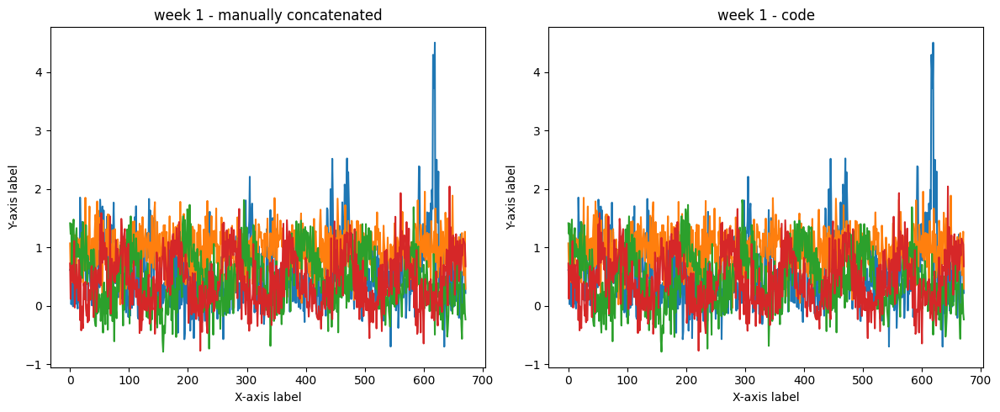

In [103]:
# comparison: manually concatenated week and code - should yield the same output
# Create a figure and two subplots
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Plot data for the first subplot
ax1.plot(concatenated_tensor_summer)
ax1.set_title('week 1 - manually concatenated')
ax1.set_xlabel('X-axis label')
ax1.set_ylabel('Y-axis label')

# Plot data for the second subplot
ax2.plot(data_week0)
ax2.set_title('week 1 - code')
ax2.set_xlabel('X-axis label')
ax2.set_ylabel('Y-axis label')

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


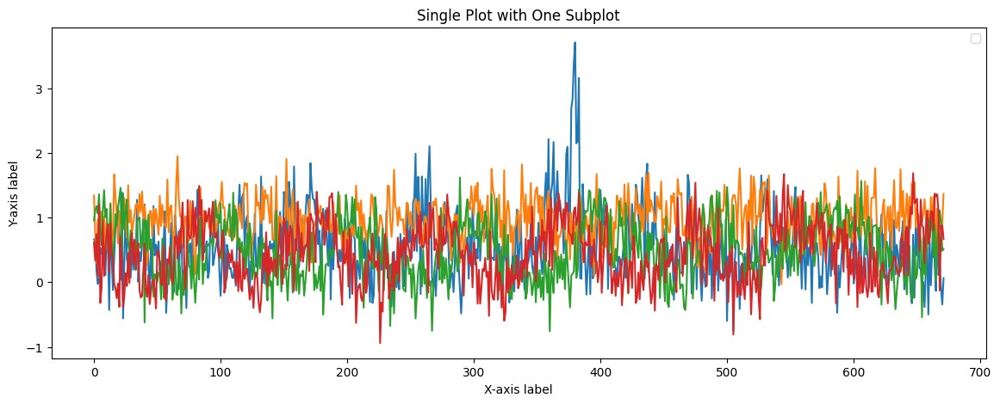

In [104]:
data_week1_subset = weekly_data_summer['week1']

# Create a figure and a single subplot
fig, ax = plt.subplots(figsize=(14, 5))

# Plot the data on the subplot
ax.plot(data_week1_subset, label='')

# Set titles and labels
ax.set_title('Single Plot with One Subplot')
ax.set_xlabel('X-axis label')
ax.set_ylabel('Y-axis label')

# Add a legend if needed
ax.legend()

# Show the plot
plt.show()

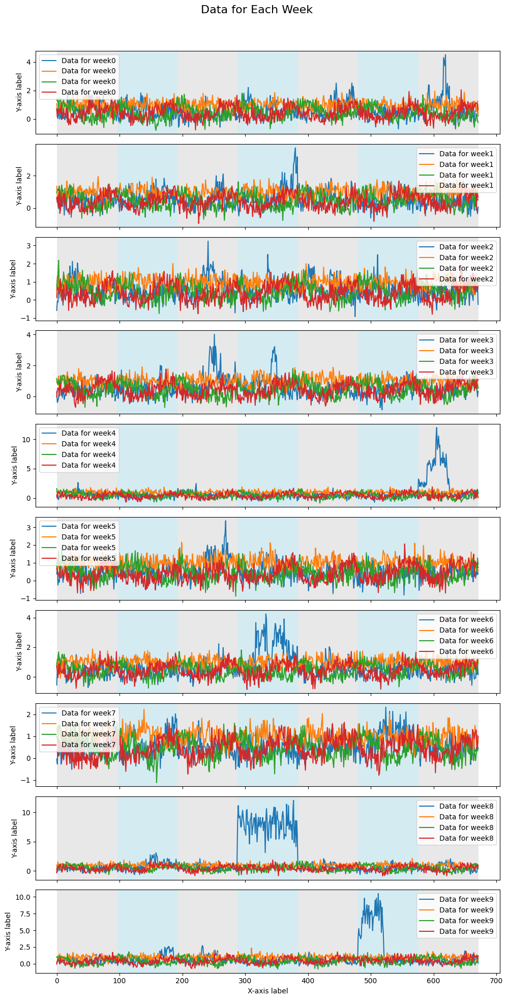

In [105]:
# Create a figure with 10 subplots in one column
fig, axs = plt.subplots(10, 1, figsize=(10, 20), sharex=True)

# Loop through each subplot and plot the corresponding data if available
for i, ax in enumerate(axs):
    if i < len(weekly_data_summer):  # Check if there is data for this subplot
        week, data = list(weekly_data_summer.items())[i]
        ax.plot(data, label=f'Data for {week}')
        ax.set_ylabel('Y-axis label')  # Customize the y-axis label as needed
        ax.legend()

        # Add shaded background every 96 values
        for j in range(0, len(data), 96):
            color = 'lightgray' if j // 96 % 2 == 0 else 'lightblue'
            ax.axvspan(j, min(j + 96, len(data)), facecolor=color, alpha=0.5)

    else:
        # If there's no data for this subplot, you can customize it or leave it empty
        ax.axis('off')  

# Customize titles, labels, and other properties based on your specific requirements
fig.suptitle('Data for Each Week', fontsize=16)
axs[-1].set_xlabel('X-axis label')  # Assuming all subplots share the same x-axis label

# Adjust layout for better spacing
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust the rect parameter as needed

# Show the plot
plt.show()

#### winter

In [106]:
num_weeks = min_num_keys
days_of_week = ['monday', 'tuesday', 'wednesday', 'thursday', 'friday', 'saturday', 'sunday']

# Initialize the output dictionary
weekly_data_winter = {}

# Iterate through each week
for week_num in range(min_num_keys):
    week_data = []

    # Iterate through each day of the week
    for day_index, day in enumerate(days_of_week):
        # Create the sample name for the current day and week
        sample_name = f'winter_{day}_{week_num}'

        # Extract the data for the current day and week
        day_data = updated_samples_dict[sample_name]

        # Append the modified data to the week_data list
        week_data.append(day_data)

    # Concatenate the modified data for all days of the week to create the weekly data
    weekly_data = torch.cat(week_data, dim=0)

    # Store the weekly data in the output dictionary
    weekly_data_winter[f'week{week_num}'] = weekly_data

# Print the result
for week, data in weekly_data_winter.items():
    print(f'{week}: {data.size()}')

week0: torch.Size([672, 4])
week1: torch.Size([672, 4])
week2: torch.Size([672, 4])
week3: torch.Size([672, 4])
week4: torch.Size([672, 4])
week5: torch.Size([672, 4])
week6: torch.Size([672, 4])
week7: torch.Size([672, 4])
week8: torch.Size([672, 4])
week9: torch.Size([672, 4])
week10: torch.Size([672, 4])
week11: torch.Size([672, 4])
week12: torch.Size([672, 4])
week13: torch.Size([672, 4])
week14: torch.Size([672, 4])
week15: torch.Size([672, 4])
week16: torch.Size([672, 4])
week17: torch.Size([672, 4])
week18: torch.Size([672, 4])
week19: torch.Size([672, 4])
week20: torch.Size([672, 4])
week21: torch.Size([672, 4])
week22: torch.Size([672, 4])
week23: torch.Size([672, 4])
week24: torch.Size([672, 4])
week25: torch.Size([672, 4])
week26: torch.Size([672, 4])
week27: torch.Size([672, 4])
week28: torch.Size([672, 4])
week29: torch.Size([672, 4])
week30: torch.Size([672, 4])
week31: torch.Size([672, 4])
week32: torch.Size([672, 4])
week33: torch.Size([672, 4])
week34: torch.Size([672,

In [107]:
data_week0 = weekly_data_winter['week0']
data_week0.shape

torch.Size([672, 4])

In [108]:
data_week0

tensor([[ 0.5312,  0.6812,  0.8361,  0.7199],
        [-0.2603,  0.8602,  0.3468,  0.5597],
        [ 0.3735,  0.2807,  1.4161,  0.3592],
        ...,
        [-0.1213,  0.6290,  0.9844,  1.2564],
        [ 0.4526,  0.5825,  1.1219,  0.8488],
        [ 0.3445,  0.2917,  0.6804,  0.4693]])

#### transitional

In [109]:
num_weeks = min_num_keys
days_of_week = ['monday', 'tuesday', 'wednesday', 'thursday', 'friday', 'saturday', 'sunday']

# Initialize the output dictionary
weekly_data_transitional = {}

# Iterate through each week
for week_num in range(min_num_keys):
    week_data = []

    # Iterate through each day of the week
    for day_index, day in enumerate(days_of_week):
        # Create the sample name for the current day and week
        sample_name = f'transitional_{day}_{week_num}'

        # Extract the data for the current day and week
        day_data = updated_samples_dict[sample_name]

        # Append the modified data to the week_data list
        week_data.append(day_data)

    # Concatenate the modified data for all days of the week to create the weekly data
    weekly_data = torch.cat(week_data, dim=0)

    # Store the weekly data in the output dictionary
    weekly_data_transitional[f'week{week_num}'] = weekly_data

# Print the result
for week, data in weekly_data_transitional.items():
    print(f'{week}: {data.size()}')

week0: torch.Size([672, 4])
week1: torch.Size([672, 4])
week2: torch.Size([672, 4])
week3: torch.Size([672, 4])
week4: torch.Size([672, 4])
week5: torch.Size([672, 4])
week6: torch.Size([672, 4])
week7: torch.Size([672, 4])
week8: torch.Size([672, 4])
week9: torch.Size([672, 4])
week10: torch.Size([672, 4])
week11: torch.Size([672, 4])
week12: torch.Size([672, 4])
week13: torch.Size([672, 4])
week14: torch.Size([672, 4])
week15: torch.Size([672, 4])
week16: torch.Size([672, 4])
week17: torch.Size([672, 4])
week18: torch.Size([672, 4])
week19: torch.Size([672, 4])
week20: torch.Size([672, 4])
week21: torch.Size([672, 4])
week22: torch.Size([672, 4])
week23: torch.Size([672, 4])
week24: torch.Size([672, 4])
week25: torch.Size([672, 4])
week26: torch.Size([672, 4])
week27: torch.Size([672, 4])
week28: torch.Size([672, 4])
week29: torch.Size([672, 4])
week30: torch.Size([672, 4])
week31: torch.Size([672, 4])
week32: torch.Size([672, 4])
week33: torch.Size([672, 4])
week34: torch.Size([672,

In [110]:
data_week0 = weekly_data_transitional['week0']
data_week0.shape

torch.Size([672, 4])

In [111]:
data_week0

tensor([[ 0.5501,  0.9633,  0.7721,  0.8210],
        [ 0.2820,  0.3988,  0.6263,  1.2200],
        [ 0.1959,  1.1328,  0.5530,  0.9850],
        ...,
        [ 0.3638,  0.9199,  0.7504,  0.1569],
        [-0.1474,  0.1758,  0.5959,  0.9266],
        [ 0.1928,  0.9198,  0.7571,  0.9960]])

#### combining weeks to complete profile

In [112]:
# Create one week
# Create a datetime index starting from December 2022 with 15 minute intervals
start_date = '2020-12-01'
end_date = '2021-01-01'
datetime_index = pd.date_range(start=start_date, end=end_date, freq='15T')

# Find the last Monday in December
last_monday = datetime_index[(datetime_index.month == 12) & (datetime_index.weekday == 0)].max()

# Set the time to 05:00
last_monday = last_monday.replace(hour=5, minute=0)

# Add four columns and add the data from week0
week0_data = weekly_data_winter['week0']  # Assuming weekly_data_winter is your dictionary
columns = ['w', 't2m', 'sinday', 'cosday']  # Adjust columns according to your data
last_monday_data = pd.DataFrame(week0_data, columns=columns, index=pd.date_range(start=last_monday, periods=len(week0_data), freq='15T'))

print(last_monday_data)

                            w       t2m    sinday    cosday
2020-12-28 05:00:00  0.531188  0.681160  0.836059  0.719890
2020-12-28 05:15:00 -0.260325  0.860161  0.346827  0.559661
2020-12-28 05:30:00  0.373532  0.280684  1.416101  0.359219
2020-12-28 05:45:00  0.164479  0.742282  0.558335  0.058907
2020-12-28 06:00:00 -0.054173  0.360165  1.239908  0.658382
...                       ...       ...       ...       ...
2021-01-04 03:45:00  0.432300  0.583936  1.165347  0.799202
2021-01-04 04:00:00  0.051992  0.101237  1.061726  0.578651
2021-01-04 04:15:00 -0.121317  0.629019  0.984394  1.256350
2021-01-04 04:30:00  0.452559  0.582469  1.121884  0.848812
2021-01-04 04:45:00  0.344514  0.291661  0.680396  0.469304

[672 rows x 4 columns]


In [113]:
# Create a datetime index starting from December 2022 with 15 minute intervals
start_date = '2022-12-01'
end_date = '2023-01-01'
datetime_index = pd.date_range(start=start_date, end=end_date, freq='15T')

# Find the last Monday in December
last_monday = datetime_index[(datetime_index.month == 12) & (datetime_index.weekday == 0)].max()

# Set the time to 05:00
last_monday = last_monday.replace(hour=5, minute=0)

# Add four columns and add the data from week0
week0_data = weekly_data_winter['week0']  # Assuming weekly_data_winter is your dictionary
columns = ['w', 't2m', 'sinday', 'cosday']  # Adjust columns according to your data
last_monday_data = pd.DataFrame(week0_data, columns=columns, index=pd.date_range(start=last_monday, periods=len(week0_data), freq='15T'))

# Loop through subsequent weeks and concatenate data
for i in range(1, len(weekly_data_winter)):
    week_data = weekly_data_winter[f'week{i}']  # Assuming keys are 'week1', 'week2', etc.
    week_start_date = last_monday + pd.Timedelta(days=7*i)
    week_end_date = week_start_date + pd.Timedelta(days=7) - pd.Timedelta(minutes=15)  # Adjust end date to avoid overlap
    week_index = pd.date_range(start=week_start_date, end=week_end_date, freq='15T')  # Use end date
    week_df = pd.DataFrame(week_data, columns=columns, index=week_index)
    last_monday_data = pd.concat([last_monday_data, week_df])

last_monday_data

,w,t2m,sinday,cosday
2022-12-26 05:00:00,0.531188,0.681160,0.836059,0.719890
2022-12-26 05:15:00,-0.260325,0.860161,0.346827,0.559661
2022-12-26 05:30:00,0.373532,0.280684,1.416101,0.359219
2022-12-26 05:45:00,0.164479,0.742282,0.558335,0.058907
2022-12-26 06:00:00,-0.054173,0.360165,1.239908,0.658382
...,...,...,...,...
2024-07-29 03:45:00,0.775480,0.696693,-0.391806,0.144456
2024-07-29 04:00:00,0.062299,0.626730,-0.051635,0.624872
2024-07-29 04:15:00,1.573364,0.160956,0.017203,1.117982
2024-07-29 04:30:00,0.769990,0.702943,0.405040,0.506736


In [114]:
# slice the df to plot
# Example date to slice data before
certain_date = '2023-01-07'

# Assuming last_monday_data is your DataFrame
# Convert the certain_date to datetime if it's not already in datetime format
certain_date = pd.to_datetime(certain_date)

# Slice the DataFrame to include data only after the certain date
sliced_data = last_monday_data[last_monday_data.index < certain_date]

sliced_data

,w,t2m,sinday,cosday
2022-12-26 05:00:00,0.531188,0.681160,0.836059,0.719890
2022-12-26 05:15:00,-0.260325,0.860161,0.346827,0.559661
2022-12-26 05:30:00,0.373532,0.280684,1.416101,0.359219
2022-12-26 05:45:00,0.164479,0.742282,0.558335,0.058907
2022-12-26 06:00:00,-0.054173,0.360165,1.239908,0.658382
...,...,...,...,...
2023-01-06 22:45:00,1.088691,1.052356,0.158807,0.716166
2023-01-06 23:00:00,1.083271,0.260323,0.858402,1.178936
2023-01-06 23:15:00,0.560746,0.303082,0.516467,0.581379
2023-01-06 23:30:00,0.986584,0.475694,0.298869,0.720446


<Axes: >

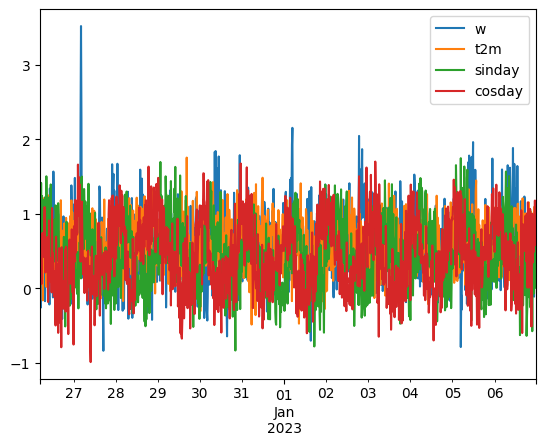

In [115]:
sliced_data.plot()

In [116]:
# Check for duplicate rows
duplicate_rows = last_monday_data.duplicated()

# Filter out duplicate rows
duplicate_data = last_monday_data[duplicate_rows]

# Print the duplicate data
print("Duplicate Rows:")
print(duplicate_data)

# Alternatively, you can count the number of duplicate rows
num_duplicates = last_monday_data.duplicated().sum()
print("Number of duplicate rows:", num_duplicates)

Duplicate Rows:
Empty DataFrame
Columns: [w, t2m, sinday, cosday]
Index: []
Number of duplicate rows: 0


###### winter

In [117]:
len(weekly_data_winter)

83

In [118]:
# Create a datetime index starting from December 2022 with 15 minute intervals
start_date = '2020-12-01'
end_date = '2021-01-01'
datetime_index = pd.date_range(start=start_date, end=end_date, freq='15T')

# Find the last Monday in December
last_monday = datetime_index[(datetime_index.month == 12) & (datetime_index.weekday == 0)].max()

# Set the time to 05:00
last_monday = last_monday.replace(hour=5, minute=0)

# Add four columns and add the data from week0
week0_data = weekly_data_winter['week0']  # Assuming weekly_data_winter is your dictionary
columns = ['w', 't2m', 'sinday', 'cosday']  # Adjust columns according to your data
winter_data_1 = pd.DataFrame(week0_data, columns=columns, index=pd.date_range(start=last_monday, periods=len(week0_data), freq='15T'))

for i in range(1, 14):  # Loop through only 15 weeks
    week_data = weekly_data_winter.get(f'week{i}', None)  # Assuming keys are 'week1', 'week2', etc.
    if week_data is not None:  # Check if data exists for this week
        week_start_date = last_monday + pd.Timedelta(days=7*i)
        week_end_date = week_start_date + pd.Timedelta(days=7) - pd.Timedelta(minutes=15)  # Adjust end date to avoid overlap
        week_index = pd.date_range(start=week_start_date, end=week_end_date, freq='15T')  # Use end date
        week_df = pd.DataFrame(week_data, columns=columns, index=week_index)
        winter_data_1 = pd.concat([winter_data_1, week_df])

winter_data_1

,w,t2m,sinday,cosday
2020-12-28 05:00:00,0.531188,0.681160,0.836059,0.719890
2020-12-28 05:15:00,-0.260325,0.860161,0.346827,0.559661
2020-12-28 05:30:00,0.373532,0.280684,1.416101,0.359219
2020-12-28 05:45:00,0.164479,0.742282,0.558335,0.058907
2020-12-28 06:00:00,-0.054173,0.360165,1.239908,0.658382
...,...,...,...,...
2021-04-05 03:45:00,1.858402,0.512388,1.035281,-0.227518
2021-04-05 04:00:00,1.410463,0.536402,1.434059,0.657077
2021-04-05 04:15:00,1.451812,0.386923,1.260734,0.890789
2021-04-05 04:30:00,1.603049,0.722538,0.890247,0.559080


<Axes: >

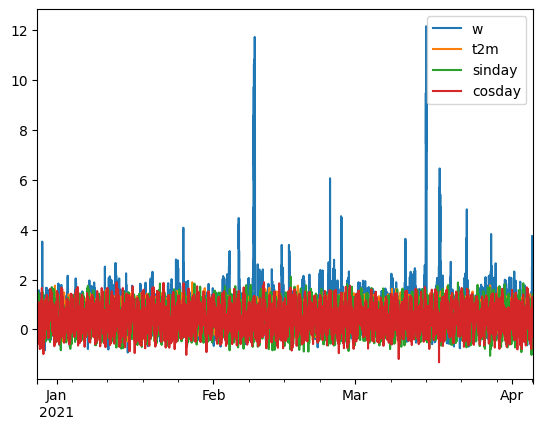

In [119]:
winter_data_1.plot()

###### winter (2)

In [120]:
# Assuming weekly_data_winter is your dictionary containing weekly data
# Create a datetime index starting from December 2022 with 15 minute intervals
start_date = '2021-12-01'
end_date = '2021-12-10'
datetime_index = pd.date_range(start=start_date, end=end_date, freq='15T')

# Find the first Monday in December
first_monday = datetime_index[datetime_index.weekday == 0][0]

# Set the time to 05:00
first_monday = first_monday.replace(hour=5, minute=0)

# Initialize DataFrame with data from the 12th week
week0_data = weekly_data_winter.get('week15', None)  # Assuming keys are 'week1', 'week2', etc.
if week0_data is not None:
    columns = ['w', 't2m', 'sinday', 'cosday']  # Adjust columns according to your data
    winter_data_2 = pd.DataFrame(week0_data, columns=columns, index=pd.date_range(start=first_monday, periods=len(week0_data), freq='15T'))

    # Iterate over remaining weeks
    for i in range(16, 32):
        week_data = weekly_data_winter.get(f'week{i}', None)  # Assuming keys are 'week1', 'week2', etc.
        if week_data is not None:
            week_start_date = first_monday + pd.Timedelta(days=7 * (i - 15))  # Adjust index for week number
            week_end_date = week_start_date + pd.Timedelta(days=7) - pd.Timedelta(minutes=15)  # Adjust end date to avoid overlap
            week_index = pd.date_range(start=week_start_date, end=week_end_date, freq='15T')  # Use end date
            week_df = pd.DataFrame(week_data, columns=columns, index=week_index)
            winter_data_2 = pd.concat([winter_data_2, week_df])

print(winter_data_2)

                            w       t2m    sinday    cosday
2021-12-06 05:00:00  0.273294  0.857321  1.394740  0.888606
2021-12-06 05:15:00  1.275670  0.745923  1.117852  0.887913
2021-12-06 05:30:00  0.567262  0.515035  1.022654 -0.023471
2021-12-06 05:45:00 -0.121674  0.388156  1.062948  0.573643
2021-12-06 06:00:00  1.001539  0.370651  0.427222  0.241179
...                       ...       ...       ...       ...
2022-04-04 03:45:00  0.239024  1.027225  0.867244  0.486854
2022-04-04 04:00:00  0.980825  0.385427  0.824029  0.907883
2022-04-04 04:15:00  0.019620  0.963063  0.969318  0.823867
2022-04-04 04:30:00  0.460311  0.261177  0.900077  1.353023
2022-04-04 04:45:00 -0.362945  0.501836  0.677549  1.075595

[11424 rows x 4 columns]


In [121]:
winter_data_2

,w,t2m,sinday,cosday
2021-12-06 05:00:00,0.273294,0.857321,1.394740,0.888606
2021-12-06 05:15:00,1.275670,0.745923,1.117852,0.887913
2021-12-06 05:30:00,0.567262,0.515035,1.022654,-0.023471
2021-12-06 05:45:00,-0.121674,0.388156,1.062948,0.573643
2021-12-06 06:00:00,1.001539,0.370651,0.427222,0.241179
...,...,...,...,...
2022-04-04 03:45:00,0.239024,1.027225,0.867244,0.486854
2022-04-04 04:00:00,0.980825,0.385427,0.824029,0.907883
2022-04-04 04:15:00,0.019620,0.963063,0.969318,0.823867
2022-04-04 04:30:00,0.460311,0.261177,0.900077,1.353023


<Axes: >

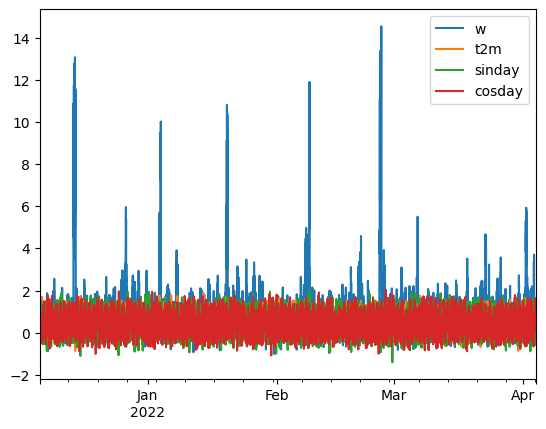

In [122]:
winter_data_2.plot()

###### winter (3)

In [123]:
weekly_data_winter

{'week0': tensor([[ 0.5312,  0.6812,  0.8361,  0.7199],
         [-0.2603,  0.8602,  0.3468,  0.5597],
         [ 0.3735,  0.2807,  1.4161,  0.3592],
         ...,
         [-0.1213,  0.6290,  0.9844,  1.2564],
         [ 0.4526,  0.5825,  1.1219,  0.8488],
         [ 0.3445,  0.2917,  0.6804,  0.4693]]),
 'week1': tensor([[ 0.8241,  0.5472,  1.3825,  0.3159],
         [ 0.2298,  0.6847,  0.9372,  0.4777],
         [ 0.1215,  0.6791,  0.4297,  0.4872],
         ...,
         [ 0.4869, -0.0317,  0.6274,  0.5857],
         [ 1.0131,  0.5298,  1.0360,  0.6300],
         [ 0.5475, -0.1050,  0.8226,  0.5834]]),
 'week2': tensor([[ 0.2931,  0.3504,  0.3183,  0.1954],
         [ 0.4361,  0.5061,  1.6008, -0.0203],
         [ 0.6322,  0.7710,  0.6358,  0.6817],
         ...,
         [ 0.9065,  0.5523,  0.6635,  0.9436],
         [ 0.2340,  0.2267,  0.6476,  0.7983],
         [ 1.0234,  1.0741,  1.0435,  1.5917]]),
 'week3': tensor([[0.6807, 0.5430, 1.2010, 0.3266],
         [0.9005, 0.4566, 1

In [124]:
# Assuming weekly_data_winter is your dictionary containing weekly data
# Create a datetime index starting from December 2022 with 15 minute intervals
start_date = '2022-12-01'
end_date = '2022-12-10'

datetime_index = pd.date_range(start=start_date, end=end_date, freq='15T')

# Find the first Monday in December
first_monday = datetime_index[datetime_index.weekday == 0][0]

# Set the time to 05:00
first_monday = first_monday.replace(hour=5, minute=0)

# Initialize DataFrame with data from the 12th week
week0_data = weekly_data_winter.get('week34', None)  # Assuming keys are 'week1', 'week2', etc.
if week0_data is not None:
    columns = ['w', 't2m', 'sinday', 'cosday']  # Adjust columns according to your data
    winter_data_3 = pd.DataFrame(week0_data, columns=columns, index=pd.date_range(start=first_monday, periods=len(week0_data), freq='15T'))

    # Iterate over remaining weeks
    for i in range(35, 50):
        week_data = weekly_data_winter.get(f'week{i}', None)  # Assuming keys are 'week1', 'week2', etc.
        if week_data is not None:
            week_start_date = first_monday + pd.Timedelta(days=7 * (i - 34))  # Adjust index for week number
            week_end_date = week_start_date + pd.Timedelta(days=7) - pd.Timedelta(minutes=15)  # Adjust end date to avoid overlap
            week_index = pd.date_range(start=week_start_date, end=week_end_date, freq='15T')  # Use end date
            week_df = pd.DataFrame(week_data, columns=columns, index=week_index)
            winter_data_3 = pd.concat([winter_data_3, week_df])

print(winter_data_3)

                            w       t2m    sinday    cosday
2022-12-05 05:00:00 -0.255133  0.483082  0.554123  0.248173
2022-12-05 05:15:00  0.625996  0.838222  0.937352  0.540347
2022-12-05 05:30:00 -0.128114  1.205531  0.788128  0.109727
2022-12-05 05:45:00  0.945485  0.637267  1.098658  0.610704
2022-12-05 06:00:00  0.602399  0.319297  0.620071  0.770226
...                       ...       ...       ...       ...
2023-03-27 03:45:00  0.986957  0.889450  1.487455  1.053592
2023-03-27 04:00:00  0.281014  0.178732  0.826048  0.978290
2023-03-27 04:15:00  0.569644  0.111443  0.710949  0.669779
2023-03-27 04:30:00  0.458542  0.413992  1.261944  0.942941
2023-03-27 04:45:00  0.599178  0.363689  1.511273  0.597364

[10752 rows x 4 columns]


<Axes: >

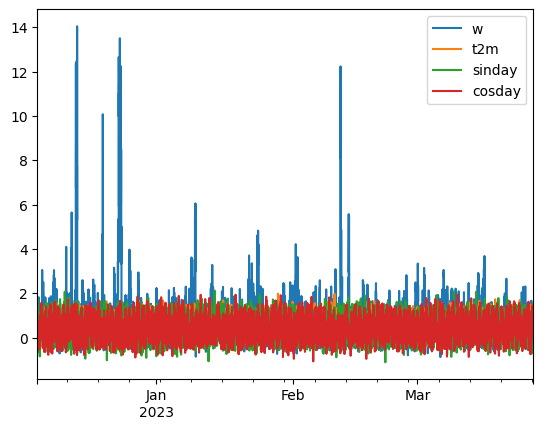

In [125]:
winter_data_3.plot()

###### summer

In [126]:
# Create a datetime index starting from December 2022 with 15 minute intervals
start_date = '2021-06-01'
end_date = '2021-06-10'
datetime_index = pd.date_range(start=start_date, end=end_date, freq='15T')

# Find the first Monday in June
last_monday = datetime_index[(datetime_index.month == 6) & (datetime_index.weekday == 0)].min()

# Set the time to 05:00
last_monday = last_monday.replace(hour=5, minute=0)

# Add four columns and add the data from week0
week0_data = weekly_data_summer['week0']  # Assuming weekly_data_summer is your dictionary
columns = ['w', 't2m', 'sinday', 'cosday']  # Adjust columns according to your data
summer_data = pd.DataFrame(week0_data, columns=columns, index=pd.date_range(start=last_monday, periods=len(week0_data), freq='15T'))

# Loop through subsequent weeks and concatenate data
for i in range(1, 20):
    week_data = weekly_data_summer[f'week{i}']  # Assuming keys are 'week1', 'week2', etc.
    week_start_date = last_monday + pd.Timedelta(days=7*i)
    week_end_date = week_start_date + pd.Timedelta(days=7) - pd.Timedelta(minutes=15)  # Adjust end date to avoid overlap
    week_index = pd.date_range(start=week_start_date, end=week_end_date, freq='15T')  # Use end date
    week_df = pd.DataFrame(week_data, columns=columns, index=week_index)
    summer_data = pd.concat([summer_data, week_df])

summer_data

,w,t2m,sinday,cosday
2021-06-07 05:00:00,0.617158,1.070036,1.413867,0.725557
2021-06-07 05:15:00,0.611904,0.586227,1.230417,0.118265
2021-06-07 05:30:00,0.026545,0.736010,1.407321,0.687199
2021-06-07 05:45:00,0.318842,0.410994,0.629227,0.431242
2021-06-07 06:00:00,1.024850,1.176688,1.250822,0.615870
...,...,...,...,...
2021-10-25 03:45:00,-0.078142,0.513282,1.267214,1.358494
2021-10-25 04:00:00,0.654139,0.945196,0.494492,0.311808
2021-10-25 04:15:00,0.560681,0.848830,0.531184,0.639000
2021-10-25 04:30:00,0.597052,0.888317,0.636106,0.699718


<Axes: >

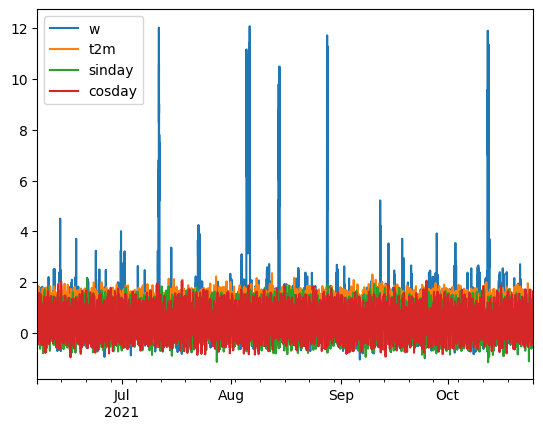

In [127]:
summer_data.plot()

###### summer  (2)

In [128]:
# Create a datetime index starting from December 2022 with 15 minute intervals
start_date = '2022-06-01'
end_date = '2022-06-10'
datetime_index = pd.date_range(start=start_date, end=end_date, freq='15T')

# Find the first Monday in June
last_monday = datetime_index[(datetime_index.month == 6) & (datetime_index.weekday == 0)].min()

# Set the time to 05:00
last_monday = last_monday.replace(hour=5, minute=0)

# Add four columns and add the data from week0
week0_data = weekly_data_summer['week21']  # Assuming weekly_data_summer is your dictionary
columns = ['w', 't2m', 'sinday', 'cosday']  # Adjust columns according to your data
summer_data_2 = pd.DataFrame(week0_data, columns=columns, index=pd.date_range(start=last_monday, periods=len(week0_data), freq='15T'))

# Loop through subsequent weeks and concatenate data
for i in range(22, len(weekly_data_summer)):
    week_data = weekly_data_summer[f'week{i}']  # Assuming keys are 'week1', 'week2', etc.
    week_start_date = last_monday + pd.Timedelta(days=7 * (i - 21))
    week_end_date = week_start_date + pd.Timedelta(days=7) - pd.Timedelta(minutes=15)  # Adjust end date to avoid overlap
    week_index = pd.date_range(start=week_start_date, end=week_end_date, freq='15T')  # Use end date
    week_df = pd.DataFrame(week_data, columns=columns, index=week_index)
    summer_data_2 = pd.concat([summer_data_2, week_df])

summer_data_2

,w,t2m,sinday,cosday
2022-06-06 05:00:00,0.146412,0.881255,1.099944,0.641773
2022-06-06 05:15:00,0.433881,1.145206,1.031836,0.089140
2022-06-06 05:30:00,0.411344,0.611050,1.249908,0.683801
2022-06-06 05:45:00,0.574403,0.752577,1.444475,0.258724
2022-06-06 06:00:00,0.010398,0.677595,0.928844,1.703223
...,...,...,...,...
2023-08-14 03:45:00,2.895242,1.083017,0.519805,1.368706
2023-08-14 04:00:00,1.543128,0.645093,0.665401,0.439057
2023-08-14 04:15:00,1.461932,1.081755,1.106036,0.476111
2023-08-14 04:30:00,2.310119,1.127062,0.568815,0.574039


<Axes: >

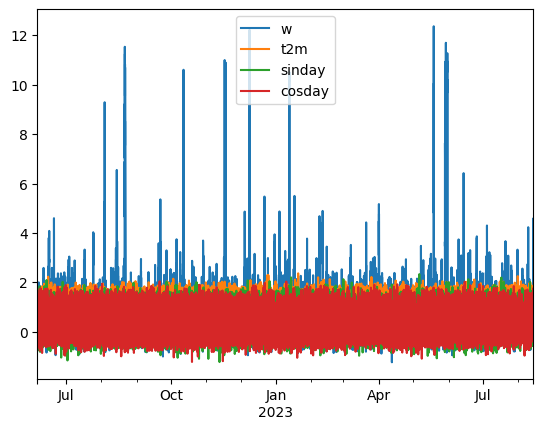

In [129]:
summer_data_2.plot()

###### transitional 1 (April)

In [130]:
# Create a datetime index starting from December 2022 with 15 minute intervals
start_date = '2021-04-01'
end_date = '2021-04-10'
datetime_index = pd.date_range(start=start_date, end=end_date, freq='15T')

# Find the first Monday in April
last_monday = datetime_index[(datetime_index.month == 4) & (datetime_index.weekday == 0)].min()

# Set the time to 05:00
last_monday = last_monday.replace(hour=5, minute=0)

# Add four columns and add the data from week0
week0_data = weekly_data_transitional['week0']  # Assuming weekly_data_summer is your dictionary
ccolumns = ['w', 't2m', 'sinday', 'cosday']  # Adjust columns according to your data
transitional_data_1 = pd.DataFrame(week0_data, columns=columns, index=pd.date_range(start=last_monday, periods=len(week0_data), freq='15T'))

for i in range(1, 10):  # Loop through only 9 weeks
    week_data = weekly_data_transitional.get(f'week{i}', None)  # Assuming keys are 'week1', 'week2', etc.
    if week_data is not None:  # Check if data exists for this week
        week_start_date = last_monday + pd.Timedelta(days=7*i)
        week_end_date = week_start_date + pd.Timedelta(days=7) - pd.Timedelta(minutes=15)  # Adjust end date to avoid overlap
        week_index = pd.date_range(start=week_start_date, end=week_end_date, freq='15T')  # Use end date
        week_df = pd.DataFrame(week_data, columns=columns, index=week_index)
        transitional_data_1 = pd.concat([transitional_data_1, week_df])

transitional_data_1

,w,t2m,sinday,cosday
2021-04-05 05:00:00,0.550144,0.963339,0.772116,0.820999
2021-04-05 05:15:00,0.281976,0.398818,0.626327,1.220032
2021-04-05 05:30:00,0.195931,1.132818,0.552994,0.985044
2021-04-05 05:45:00,0.372418,0.475903,1.651372,0.626091
2021-04-05 06:00:00,0.499148,0.342593,1.023081,0.982592
...,...,...,...,...
2021-06-14 03:45:00,0.604385,0.641524,1.079160,0.512532
2021-06-14 04:00:00,-0.239338,0.369277,0.928754,0.585050
2021-06-14 04:15:00,0.195877,0.280292,1.431843,1.041933
2021-06-14 04:30:00,0.311003,0.563156,1.470719,0.697239


<Axes: >

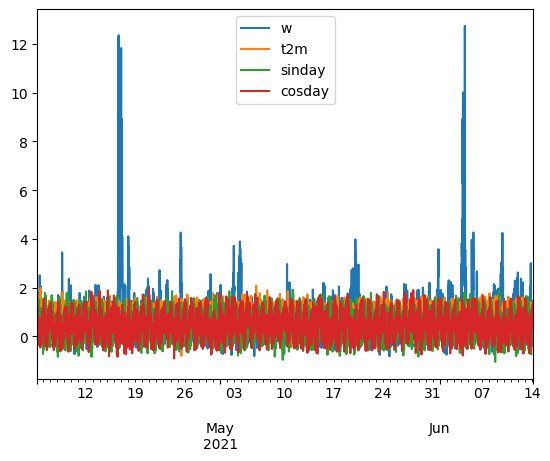

In [131]:
transitional_data_1.plot()

###### transitional 2 (October)

In [132]:
weekly_data_transitional

{'week0': tensor([[ 0.5501,  0.9633,  0.7721,  0.8210],
         [ 0.2820,  0.3988,  0.6263,  1.2200],
         [ 0.1959,  1.1328,  0.5530,  0.9850],
         ...,
         [ 0.3638,  0.9199,  0.7504,  0.1569],
         [-0.1474,  0.1758,  0.5959,  0.9266],
         [ 0.1928,  0.9198,  0.7571,  0.9960]]),
 'week1': tensor([[-0.0156,  0.5124,  0.7394, -0.2451],
         [ 0.4495,  1.3587,  0.9493, -0.3273],
         [ 0.3793,  0.6273,  0.9140,  0.3090],
         ...,
         [-0.4612,  0.9689,  1.0331,  0.7974],
         [ 0.3910,  1.2421,  1.0435,  0.7747],
         [ 0.5623,  1.2694,  0.3661,  0.4632]]),
 'week2': tensor([[ 0.1750,  0.9473,  1.0665, -0.1612],
         [ 0.4654,  0.3881,  0.8160, -0.0479],
         [ 0.3697,  0.5563,  0.8598,  0.8683],
         ...,
         [ 1.0219,  0.4717,  0.7748,  0.6781],
         [ 1.0413,  0.7888,  0.9188,  1.0523],
         [ 1.2855,  0.6145,  1.0042,  0.7651]]),
 'week3': tensor([[ 0.4299,  0.7672,  0.8437,  0.5443],
         [ 0.6207,  0.1

In [133]:
# Create a datetime index starting from October 2023 with 15 minute intervals
start_date = '2021-10-01'
end_date = '2021-10-10'
datetime_index = pd.date_range(start=start_date, end=end_date, freq='15T')

# Find the first Monday in October
first_monday = datetime_index[(datetime_index.month == 10) & (datetime_index.weekday == 0)].min()

# Set the time to 05:00
first_monday = first_monday.replace(hour=5, minute=0)

# Add four columns and add the data from week0
week0_data = weekly_data_transitional['week11']  # Assuming weekly_data_transitional is your dictionary
columns = ['w', 't2m', 'sinday', 'cosday']  # Adjust columns according to your data
transitional_data_2 = pd.DataFrame(week0_data, columns=columns, index=pd.date_range(start=first_monday, periods=len(week0_data), freq='15T'))


for i in range(12, 22):  # Adjust the loop range to start from the 11th week
    week_data = weekly_data_transitional.get(f'week{i}', None)  # Assuming keys are 'week1', 'week2', etc.
    if week_data is not None:  # Check if data exists for this week
        week_start_date = first_monday + pd.Timedelta(days=7 * (i - 11))
        week_end_date = week_start_date + pd.Timedelta(days=7) - pd.Timedelta(minutes=15)  # Adjust end date to avoid overlap
        week_index = pd.date_range(start=week_start_date, end=week_end_date, freq='15T')  # Use end date
        week_df = pd.DataFrame(week_data, columns=columns, index=week_index)
        transitional_data_2 = pd.concat([transitional_data_2, week_df])

transitional_data_2

,w,t2m,sinday,cosday
2021-10-04 05:00:00,0.296086,0.359399,0.708404,1.491908
2021-10-04 05:15:00,0.990564,1.101242,0.769221,0.557715
2021-10-04 05:30:00,0.415058,0.266442,0.910292,0.773575
2021-10-04 05:45:00,0.682788,0.773159,0.503941,0.922940
2021-10-04 06:00:00,0.249442,0.827181,0.334431,0.423801
...,...,...,...,...
2021-12-20 03:45:00,0.182819,0.445328,-0.048021,0.802471
2021-12-20 04:00:00,0.600641,0.377804,0.365753,0.855954
2021-12-20 04:15:00,0.591054,-0.069608,0.250200,1.429895
2021-12-20 04:30:00,0.498946,0.125806,0.946288,1.030273


<Axes: >

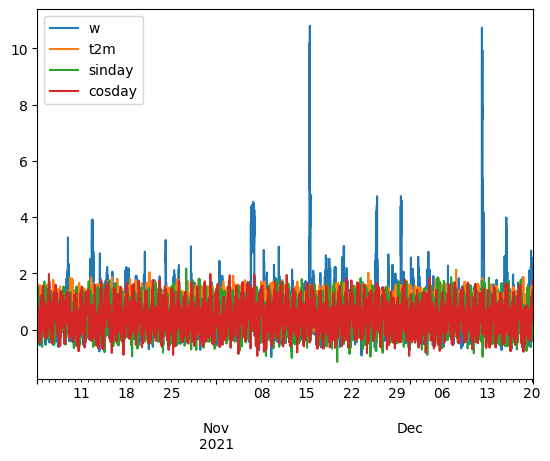

In [134]:
transitional_data_2.plot()

###### transitional 3 (April)

In [135]:
# Create a datetime index starting from December 2022 with 15 minute intervals
start_date = '2022-04-01'
end_date = '2022-04-10'
datetime_index = pd.date_range(start=start_date, end=end_date, freq='15T')

# Find the first Monday in April
last_monday = datetime_index[(datetime_index.month == 4) & (datetime_index.weekday == 0)].min()

# Set the time to 05:00
last_monday = last_monday.replace(hour=5, minute=0)

# Add four columns and add the data from week0
week0_data = weekly_data_transitional['week23']  # Assuming weekly_data_summer is your dictionary
ccolumns = ['w', 't2m', 'sinday', 'cosday']  # Adjust columns according to your data
transitional_data_3 = pd.DataFrame(week0_data, columns=columns, index=pd.date_range(start=last_monday, periods=len(week0_data), freq='15T'))

for i in range(24, 34):  # Loop through only 12 weeks
    week_data = weekly_data_transitional.get(f'week{i}', None)  # Assuming keys are 'week1', 'week2', etc.
    if week_data is not None:  # Check if data exists for this week
        week_start_date = last_monday + pd.Timedelta(days=7* (i - 23))
        week_end_date = week_start_date + pd.Timedelta(days=7) - pd.Timedelta(minutes=15)  # Adjust end date to avoid overlap
        week_index = pd.date_range(start=week_start_date, end=week_end_date, freq='15T')  # Use end date
        week_df = pd.DataFrame(week_data, columns=columns, index=week_index)
        transitional_data_3 = pd.concat([transitional_data_3, week_df])

transitional_data_3

,w,t2m,sinday,cosday
2022-04-04 05:00:00,0.427455,1.024101,0.404957,0.665448
2022-04-04 05:15:00,0.200258,0.795311,0.348875,0.589258
2022-04-04 05:30:00,0.670091,-0.131533,0.933931,0.197708
2022-04-04 05:45:00,0.765226,0.455345,0.877125,0.415247
2022-04-04 06:00:00,0.707708,0.819565,1.151801,-0.463370
...,...,...,...,...
2022-06-20 03:45:00,0.639692,0.989702,0.845728,1.161388
2022-06-20 04:00:00,0.274666,0.608664,0.138308,1.117382
2022-06-20 04:15:00,0.828328,0.215094,0.766724,1.112998
2022-06-20 04:30:00,0.932036,0.668553,-0.057474,0.740835


<Axes: >

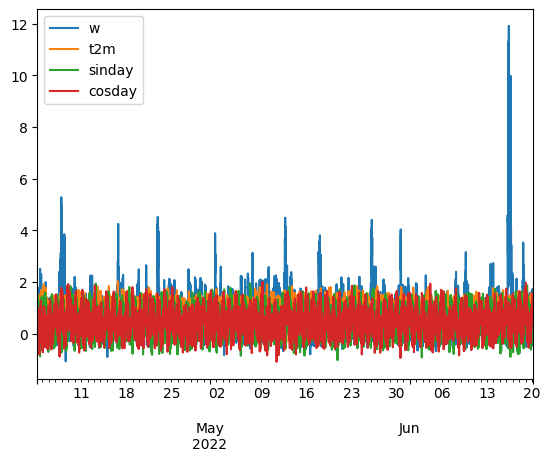

In [136]:
transitional_data_3.plot()

###### transitional 4 (October)

In [137]:
weekly_data_transitional

{'week0': tensor([[ 0.5501,  0.9633,  0.7721,  0.8210],
         [ 0.2820,  0.3988,  0.6263,  1.2200],
         [ 0.1959,  1.1328,  0.5530,  0.9850],
         ...,
         [ 0.3638,  0.9199,  0.7504,  0.1569],
         [-0.1474,  0.1758,  0.5959,  0.9266],
         [ 0.1928,  0.9198,  0.7571,  0.9960]]),
 'week1': tensor([[-0.0156,  0.5124,  0.7394, -0.2451],
         [ 0.4495,  1.3587,  0.9493, -0.3273],
         [ 0.3793,  0.6273,  0.9140,  0.3090],
         ...,
         [-0.4612,  0.9689,  1.0331,  0.7974],
         [ 0.3910,  1.2421,  1.0435,  0.7747],
         [ 0.5623,  1.2694,  0.3661,  0.4632]]),
 'week2': tensor([[ 0.1750,  0.9473,  1.0665, -0.1612],
         [ 0.4654,  0.3881,  0.8160, -0.0479],
         [ 0.3697,  0.5563,  0.8598,  0.8683],
         ...,
         [ 1.0219,  0.4717,  0.7748,  0.6781],
         [ 1.0413,  0.7888,  0.9188,  1.0523],
         [ 1.2855,  0.6145,  1.0042,  0.7651]]),
 'week3': tensor([[ 0.4299,  0.7672,  0.8437,  0.5443],
         [ 0.6207,  0.1

In [138]:
# Create a datetime index starting from October 2023 with 15 minute intervals
start_date = '2022-10-01'
end_date = '2022-10-10'
datetime_index = pd.date_range(start=start_date, end=end_date, freq='15T')

# Find the first Monday in October
first_monday = datetime_index[(datetime_index.month == 10) & (datetime_index.weekday == 0)].min()

# Set the time to 05:00
first_monday = first_monday.replace(hour=5, minute=0)

# Add four columns and add the data from week0
week0_data = weekly_data_transitional['week35']  # Assuming weekly_data_transitional is your dictionary
columns = ['w', 't2m', 'sinday', 'cosday']  # Adjust columns according to your data
transitional_data_4 = pd.DataFrame(week0_data, columns=columns, index=pd.date_range(start=first_monday, periods=len(week0_data), freq='15T'))


for i in range(36, 46):  # Adjust the loop range to start from the 11th week
    week_data = weekly_data_transitional.get(f'week{i}', None)  # Assuming keys are 'week1', 'week2', etc.
    if week_data is not None:  # Check if data exists for this week
        week_start_date = first_monday + pd.Timedelta(days=7 * (i - 35))
        week_end_date = week_start_date + pd.Timedelta(days=7) - pd.Timedelta(minutes=15)  # Adjust end date to avoid overlap
        week_index = pd.date_range(start=week_start_date, end=week_end_date, freq='15T')  # Use end date
        week_df = pd.DataFrame(week_data, columns=columns, index=week_index)
        transitional_data_4 = pd.concat([transitional_data_4, week_df])

transitional_data_4

,w,t2m,sinday,cosday
2022-10-03 05:00:00,1.041879,0.441013,0.995586,0.642632
2022-10-03 05:15:00,0.230514,0.404336,0.306955,0.207982
2022-10-03 05:30:00,0.284763,0.415977,0.549442,0.920522
2022-10-03 05:45:00,0.436313,1.236370,0.865186,0.263227
2022-10-03 06:00:00,0.808111,0.490779,1.215615,0.805751
...,...,...,...,...
2022-12-19 03:45:00,0.513679,0.514714,0.725241,1.305207
2022-12-19 04:00:00,0.844014,0.756631,0.556666,1.437548
2022-12-19 04:15:00,0.573973,0.357863,0.149887,0.713576
2022-12-19 04:30:00,1.066604,0.273649,0.088374,0.952062


<Axes: >

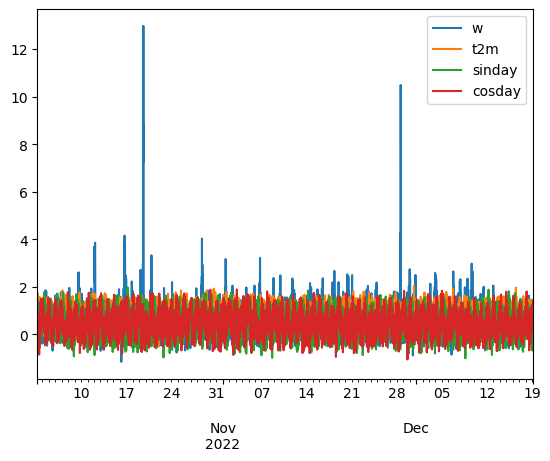

In [139]:
transitional_data_4.plot()

##### combine all weeks

In [140]:
# delete unnecessary tails of all dfs:
# Find the last timestamp in winter_data_2

# Create a list of your dataframes
dfs = [winter_data_1, transitional_data_1, summer_data, transitional_data_2, winter_data_2, transitional_data_3, summer_data_2, transitional_data_4, winter_data_3]

# Identify the index values A, B, C, D
index_A = transitional_data_1.index[0]
index_B = summer_data.index[0]
index_C = transitional_data_2.index[0]
index_D = winter_data_2.index[0]
index_E = transitional_data_3.index[0]
index_F = summer_data_2.index[0]
index_G = transitional_data_4.index[0] 
index_H = winter_data_3.index[0]


# Slice the dataframes accordingly
winter_data_1 = winter_data_1.loc[:index_A]
transitional_data_1 = transitional_data_1.loc[index_A:index_B]
summer_data = summer_data.loc[index_B:index_C]
transitional_data_2 = transitional_data_2.loc[index_C:index_D]
winter_data_2 = winter_data_2.loc[index_D:index_E] 
transitional_data_3 = transitional_data_3.loc[index_E:index_F]
summer_data_2 = summer_data_2.loc[index_F:index_G]
transitional_data_4 = transitional_data_4.loc[index_G:index_H]
winter_data_3 = winter_data_3

# Create a list of modified dataframes
dfs = [winter_data_1, transitional_data_1, summer_data, transitional_data_2, winter_data_2, transitional_data_3, summer_data_2, transitional_data_4, winter_data_3]

In [141]:
transitional_data_3

,w,t2m,sinday,cosday
2022-04-04 05:00:00,0.427455,1.024101,0.404957,0.665448
2022-04-04 05:15:00,0.200258,0.795311,0.348875,0.589258
2022-04-04 05:30:00,0.670091,-0.131533,0.933931,0.197708
2022-04-04 05:45:00,0.765226,0.455345,0.877125,0.415247
2022-04-04 06:00:00,0.707708,0.819565,1.151801,-0.463370
...,...,...,...,...
2022-06-06 04:00:00,0.521613,0.832329,1.422699,0.365965
2022-06-06 04:15:00,-0.023445,0.751315,1.028994,1.292688
2022-06-06 04:30:00,-0.189591,0.783480,0.973710,0.844296
2022-06-06 04:45:00,0.050863,1.648211,1.081468,0.423123


In [142]:
# Merge dataframes
merged_df = pd.concat([winter_data_1, transitional_data_1], axis=0)
merged_df_2 = pd.concat([merged_df, summer_data], axis=0)
merged_df_3 = pd.concat([merged_df_2, transitional_data_2], axis=0)
merged_df_4 = pd.concat([merged_df_3, winter_data_2], axis=0)
merged_df_5 = pd.concat([merged_df_4, transitional_data_3], axis=0)
merged_df_6 = pd.concat([merged_df_5, summer_data_2], axis=0)
merged_df_7 = pd.concat([merged_df_6, transitional_data_4], axis=0)
merged_df_8 = pd.concat([merged_df_7, winter_data_3], axis=0)
merged_df_8

,w,t2m,sinday,cosday
2020-12-28 05:00:00,0.531188,0.681160,0.836059,0.719890
2020-12-28 05:15:00,-0.260325,0.860161,0.346827,0.559661
2020-12-28 05:30:00,0.373532,0.280684,1.416101,0.359219
2020-12-28 05:45:00,0.164479,0.742282,0.558335,0.058907
2020-12-28 06:00:00,-0.054173,0.360165,1.239908,0.658382
...,...,...,...,...
2023-03-27 03:45:00,0.986957,0.889450,1.487455,1.053592
2023-03-27 04:00:00,0.281014,0.178732,0.826048,0.978290
2023-03-27 04:15:00,0.569644,0.111443,0.710949,0.669779
2023-03-27 04:30:00,0.458542,0.413992,1.261944,0.942941


<Axes: >

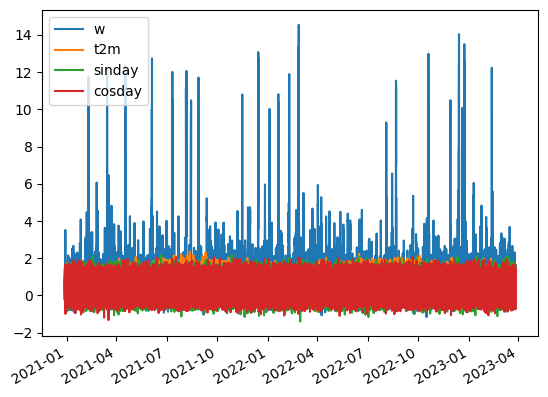

In [143]:
merged_df_8.plot()

In [144]:
# the df has to be cut after the last timestamp of winter2 to avoid the overhang of transitional_2

<Axes: >

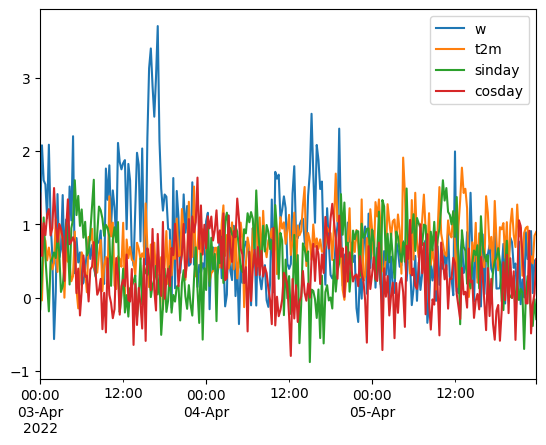

In [145]:
# Define the start and end dates
start_date = "2022-04-03"
end_date = "2022-04-05"

# Slice the dataframe accordingly
merged_df_8.loc[start_date:end_date].plot()

In [146]:
# Define the start and end dates
start_date = "2021-01-01"
end_date = "2022-12-31"

# Slice the dataframe accordingly
merged_df_8_cut = merged_df_8.loc[start_date:end_date]

<Axes: >

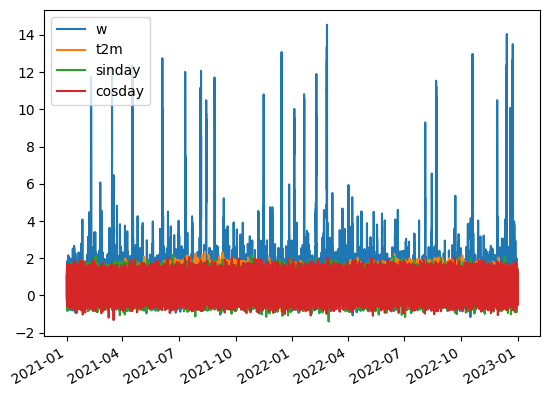

In [147]:
merged_df_8_cut.plot()

In [148]:
# We do not want any duplicates because each day/week should have been used only once
# Check for duplicate rows
duplicates = merged_df_8_cut.duplicated()

# Count the number of duplicate rows
num_duplicates = duplicates.sum()

if num_duplicates > 0:
    print("There are duplicate rows in merged_df_8_cut.")
    # Optionally, you can display the duplicate rows themselves
    duplicate_rows = merged_df_8_cut[duplicates]
    print("Duplicate rows:")
    print(duplicate_rows)
else:
    print("There are no duplicate rows in merged_df_8_cut.")

There are no duplicate rows in merged_df_8_cut.


In [149]:
nans = merged_df_8_cut.isna().sum()
nans

w         0
t2m       0
sinday    0
cosday    0
dtype: int64

### data re-normalization

In [150]:
merged_df_8_cut

,w,t2m,sinday,cosday
2021-01-01 00:00:00,1.048651,0.927025,0.317179,1.114036
2021-01-01 00:15:00,0.837564,-0.308053,-0.250075,0.865833
2021-01-01 00:30:00,1.098346,0.284252,0.205247,0.829519
2021-01-01 00:45:00,0.222975,0.387176,0.271469,1.108938
2021-01-01 01:00:00,0.909263,0.560256,-0.045224,0.878526
...,...,...,...,...
2022-12-31 22:45:00,0.613336,0.996824,0.264306,0.449729
2022-12-31 23:00:00,0.809660,0.699614,0.007124,0.102707
2022-12-31 23:15:00,0.905081,0.115262,-0.390702,0.145929
2022-12-31 23:30:00,0.481526,-0.002076,-0.238597,0.778930


In [151]:
# rename the columns
merged_df_8_cut.rename(columns={'w': 'kWh', 't2m': 'temp_celsius'}, inplace=True)

/tmp/ipykernel_87238/3822575624.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_df_8_cut.rename(columns={'w': 'kWh', 't2m': 'temp_celsius'}, inplace=True)


In [152]:
merged_df_8_cut.drop(columns=['sinday', 'cosday'], inplace=True)

/tmp/ipykernel_87238/2954120389.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_df_8_cut.drop(columns=['sinday', 'cosday'], inplace=True)


In [153]:
# rescale the columns if needed
merged_df_8_cut['temp_celsius'] = (merged_df_8_cut['temp_celsius'] * 40) - 20

/tmp/ipykernel_87238/1255560364.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  merged_df_8_cut['temp_celsius'] = (merged_df_8_cut['temp_celsius'] * 40) - 20


In [154]:
merged_df_8_cut.to_csv(filename)

### Plotting, synthetic data / Output, typical week

In [155]:
# Assuming df_dict is a dictionary containing DataFrames

def find_first_monday_in_month(year, month):
    date = pd.Timestamp(year, month, 1)
    while date.dayofweek != 0:  # Monday is 0
        date += pd.Timedelta(days=1)
    return date

def create_seasonal_dataframes(df, year):
    # Define start and end dates for winter, summer, and transitional periods
    winter_start_date_1 = find_first_monday_in_month(year, 12)  # First Monday in December
    winter_end_date_1 = winter_start_date_1 + pd.DateOffset(days=20)  # Extend for the following 21 days

    # Additional winter period: First Monday after new year and the following 8 weeks
    winter_start_date_2 = find_first_monday_in_month(year + 1, 1)  # First Monday after new year (January)
    winter_end_date_2 = winter_start_date_2 + pd.DateOffset(weeks=8)  # 8 weeks after the start

    winter_df_1 = df[(df.index >= winter_start_date_1) & (df.index <= winter_end_date_1)]
    winter_df_2 = df[(df.index >= winter_start_date_2) & (df.index <= winter_end_date_2)]

    # Find the first Monday in June
    summer_start_date = find_first_monday_in_month(year, 6)

    # Calculate the end of summer, which is 16 weeks after the start
    summer_end_date = summer_start_date + pd.DateOffset(weeks=16)  # 16 weeks after the start

    # Find the first Monday in April
    transitional_start_date_1 = find_first_monday_in_month(year, 4)
    transitional_end_date_1 = transitional_start_date_1 + pd.DateOffset(weeks=8)  # 8 weeks after the start

    # Find the first Monday in October
    transitional_start_date_2 = find_first_monday_in_month(year, 10)
    transitional_end_date_2 = transitional_start_date_2 + pd.DateOffset(weeks=4)  # 4 weeks after the start

    transitional_df_1 = df[(df.index >= transitional_start_date_1) & (df.index <= transitional_end_date_1)]
    transitional_df_2 = df[(df.index >= transitional_start_date_2) & (df.index <= transitional_end_date_2)]
    
    combined_winter_df = pd.concat([winter_df_1, winter_df_2])
    combined_transitional_df = pd.concat([transitional_df_1, transitional_df_2])
    summer_df = df[(df.index >= summer_start_date) & (df.index <= summer_end_date)]

    return combined_winter_df, summer_df, combined_transitional_df

# Initialize empty DataFrames for aggregation
winter_all_df = pd.DataFrame()
summer_all_df = pd.DataFrame()
transitional_all_df = pd.DataFrame()

for year in range(2015, 2024):
    winter_df, summer_df, transitional_df = create_seasonal_dataframes(merged_df_8_cut, year)
        
    # Concatenate DataFrames for each season
    winter_all_df = pd.concat([winter_all_df, winter_df])
    summer_all_df = pd.concat([summer_all_df, summer_df])
    transitional_all_df = pd.concat([transitional_all_df, transitional_df])

# Combine resulting seasonal dataframes
combined_seasonal_df = {
    'winter_all_df': winter_all_df,
    'summer_all_df': summer_all_df,
    'transitional_all_df': transitional_all_df
}

In [156]:
winter_all_df_w = winter_all_df.iloc[:,:1]
winter_all_df_w

,kWh
2021-01-04 00:00:00,1.261264
2021-01-04 00:15:00,0.334151
2021-01-04 00:30:00,0.851860
2021-01-04 00:45:00,0.685481
2021-01-04 01:00:00,0.298102
...,...
2022-12-24 23:00:00,0.043415
2022-12-24 23:15:00,0.217918
2022-12-24 23:30:00,-0.354831
2022-12-24 23:45:00,0.802589


In [157]:
winter_all_df_w_mean_synth = winter_all_df_w.mean()

In [158]:
summer_all_df_w = summer_all_df.iloc[:,:1]
summer_all_df_w

,kWh
2021-06-07 00:00:00,0.070933
2021-06-07 00:15:00,1.122317
2021-06-07 00:30:00,0.768034
2021-06-07 00:45:00,1.503078
2021-06-07 01:00:00,0.652379
...,...
2022-09-25 23:00:00,0.509682
2022-09-25 23:15:00,0.477148
2022-09-25 23:30:00,-0.181905
2022-09-25 23:45:00,0.222991


In [159]:
summer_all_df_w_mean_synth = summer_all_df_w.mean()

In [160]:
transitional_all_df_w = transitional_all_df.iloc[:,:1]
transitional_all_df_w

,kWh
2021-04-05 00:00:00,2.878542
2021-04-05 00:15:00,1.725213
2021-04-05 00:30:00,2.205367
2021-04-05 00:45:00,3.210409
2021-04-05 01:00:00,2.332037
...,...
2022-10-30 23:00:00,0.577149
2022-10-30 23:15:00,0.533388
2022-10-30 23:30:00,0.827010
2022-10-30 23:45:00,0.780527


In [161]:
transitional_all_df_w_mean_synth = transitional_all_df_w.mean()

In [162]:
# Step 1: Extract weekday, hour, and minute
season_data = {'winter': winter_all_df_w, 'summer': summer_all_df_w, 'transitional': transitional_all_df_w}
season_results = {}

for season, df in season_data.items():
    df_copy = df.copy()
    df_copy['weekday'] = df_copy.index.weekday
    df_copy['hour'] = df_copy.index.hour
    df_copy['minute'] = df_copy.index.minute
    season_results[season] = df_copy

# Step 2: Group by weekday, hour, and minute, and calculate mean and confidence intervals
def calculate_mean_and_ci(group):
    mean = group.mean()
    ci_low = mean - 1.96 * group.std() / np.sqrt(len(group))
    ci_high = mean + 1.96 * group.std() / np.sqrt(len(group))
    return mean, ci_low, ci_high

for season, df in season_results.items():
    grouped = df.groupby(['weekday', 'hour', 'minute'])['kWh']
    season_results[season] = grouped.apply(calculate_mean_and_ci).apply(pd.Series).rename(columns={0: 'mean', 1: 'ci_low', 2: 'ci_high'})

# Step 3: Create separate DataFrames for each season
result_dfs = {}
for season, result in season_results.items():
    result_df = result.reset_index()
    result_dfs[season] = result_df

In [163]:
result_dfs

{'winter':      weekday  hour  minute      mean    ci_low   ci_high
 0          0     0       0  0.779299  0.523394  1.035205
 1          0     0      15  0.830969  0.658281  1.003657
 2          0     0      30  0.721946  0.491901  0.951991
 3          0     0      45  0.750654  0.394183  1.107125
 4          0     1       0  0.748863  0.472257  1.025470
 ..       ...   ...     ...       ...       ...       ...
 667        6    22      45  0.762672  0.522053  1.003291
 668        6    23       0  0.965510  0.641040  1.289981
 669        6    23      15  0.940231  0.647228  1.233235
 670        6    23      30  0.907103  0.555090  1.259117
 671        6    23      45  0.780060  0.477709  1.082411
 
 [672 rows x 6 columns],
 'summer':      weekday  hour  minute      mean    ci_low   ci_high
 0          0     0       0  0.673220  0.383196  0.963244
 1          0     0      15  0.684094  0.462785  0.905402
 2          0     0      30  0.680455  0.385813  0.975096
 3          0     0      

In [164]:
# Define a dictionary to map weekday numbers to weekday names
weekday_names = {
    0: 'Montag',
    1: 'Dienstag',
    2: 'Mittwoch',
    3: 'Donnerstag',
    4: 'Freitag',
    5: 'Samstag',
    6: 'Sonntag'
}

# Map weekdays in all result_dfs
for season, df in result_dfs.items():
    df['weekday'] = df['weekday'].map(weekday_names)


In [165]:
result_dfs

{'winter':      weekday  hour  minute      mean    ci_low   ci_high
 0     Montag     0       0  0.779299  0.523394  1.035205
 1     Montag     0      15  0.830969  0.658281  1.003657
 2     Montag     0      30  0.721946  0.491901  0.951991
 3     Montag     0      45  0.750654  0.394183  1.107125
 4     Montag     1       0  0.748863  0.472257  1.025470
 ..       ...   ...     ...       ...       ...       ...
 667  Sonntag    22      45  0.762672  0.522053  1.003291
 668  Sonntag    23       0  0.965510  0.641040  1.289981
 669  Sonntag    23      15  0.940231  0.647228  1.233235
 670  Sonntag    23      30  0.907103  0.555090  1.259117
 671  Sonntag    23      45  0.780060  0.477709  1.082411
 
 [672 rows x 6 columns],
 'summer':      weekday  hour  minute      mean    ci_low   ci_high
 0     Montag     0       0  0.673220  0.383196  0.963244
 1     Montag     0      15  0.684094  0.462785  0.905402
 2     Montag     0      30  0.680455  0.385813  0.975096
 3     Montag     0      

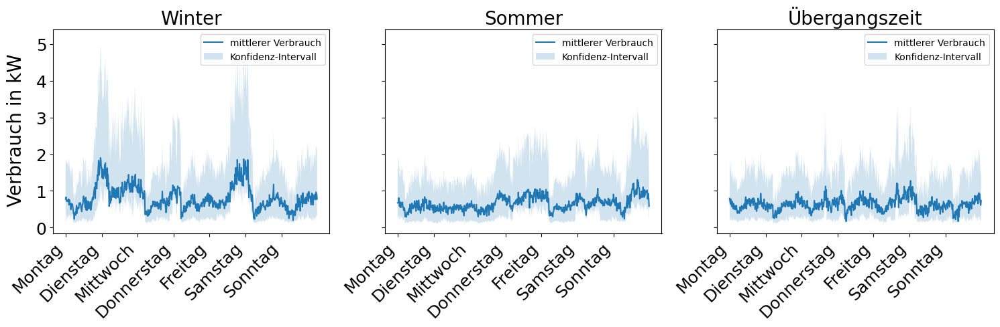

In [166]:
import matplotlib.pyplot as plt

# Create a figure with three subplots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(15, 5), sharey=True)

titles = ('Winter', 'Sommer', 'Übergangszeit')

# Plot Row-wise Statistics for each season DataFrame with shaded area for standard deviation
for i, ((season, df), title) in enumerate(zip(result_dfs.items(), titles)):
    axes[i].plot(df.index, df['mean'], label='mittlerer Verbrauch')
    axes[i].fill_between(df.index,
                         df['mean'] - df['ci_low'],
                         df['mean'] + df['ci_high'],
                         alpha=0.2, label='Konfidenz-Intervall')
    axes[i].set_title(title, fontsize=20)
    axes[i].legend()
    # Set x-axis ticks to show only one label per 96 values
    axes[i].set_xticks(df.index[::96])
    axes[i].set_xticklabels(df['weekday'][::96], rotation=45, ha='right')

# Set font size for x-axis and y-axis tick labels
for ax in axes:
    ax.tick_params(axis='x', labelsize=18)
    ax.tick_params(axis='y', labelsize=18)

# Set common y-axis label
fig.text(0.009, 0.6, 'Verbrauch in kW', va='center', rotation='vertical', fontsize=20)

# Adjust layout to prevent overlapping
plt.tight_layout()

# Save the plot as an SVG file
plt.savefig(plotname, format='svg')

# Show the plot
plt.show()

In [167]:
# compare 

In [168]:
data = {
    'Winter Original Mean': winter_all_df_w_orig_mean.values,
    'Summer Original Mean': summer_all_df_w_orig_mean.values,
    'Transitional Original Mean': transitional_all_df_w_orig_mean.values,
    'Winter Synthetic Mean': winter_all_df_w_mean_synth.values,
    'Summer Synthetic Mean': summer_all_df_w_mean_synth.values,
    'Transitional Synthetic Mean': transitional_all_df_w_mean_synth.values
}

df = pd.DataFrame(data)

In [169]:
# Create the DataFrame
data = {
    'Original Mean': [winter_all_df_w_orig_mean.iloc[0], summer_all_df_w_orig_mean.iloc[0], transitional_all_df_w_orig_mean.iloc[0]],
    'Synthetic Mean': [winter_all_df_w_mean_synth.iloc[0], summer_all_df_w_mean_synth.iloc[0], transitional_all_df_w_mean_synth.iloc[0]]
}

df = pd.DataFrame(data)
df

,Original Mean,Synthetic Mean
0,0.718872,0.814977
1,0.655427,0.656985
2,0.651702,0.631376


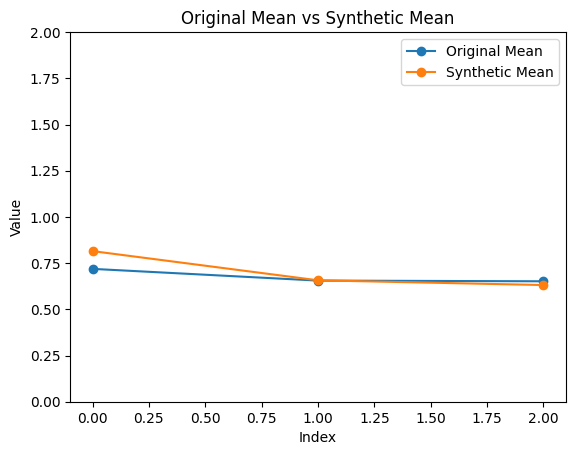

In [170]:
# Extract the values from the DataFrame
orig_mean = df['Original Mean']
synthetic_mean = df['Synthetic Mean']

# Plot the values
plt.plot(orig_mean, label='Original Mean', marker='o')
plt.plot(synthetic_mean, label='Synthetic Mean', marker='o')

# Add labels and legend
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Original Mean vs Synthetic Mean')
plt.legend()

plt.ylim(0, 2) 

# Show the plot
plt.show()